In [2]:
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from keras.layers import Dense, Input, Flatten, Conv2D, MaxPooling2D, LayerNormalization, Softmax, Dropout
from keras.callbacks import EarlyStopping
from keras.models import Sequential, Model

In [3]:
#training, testing = tf.keras.datasets.mnist.load_data(path="mnist.npz")
training, testing = tf.keras.datasets.fashion_mnist.load_data()



images_training = training[0]/256
images_testing = testing[0]/256

labels_training = pd.get_dummies(training[1]).to_numpy()
labels_testing = pd.get_dummies(testing[1]).to_numpy()

In [4]:
def generate_gaussian_noise(images,noise_sd):
    #Adds random gaussian noise to images
    noisy_images = images + np.random.normal(0,noise_sd,np.shape(images))
    return noisy_images


def generate_contrast(images,a):
    
    contrasted_images = np.zeros(np.shape(images))
    #changes contrast based on alpha
    alpha = a
    for i in range(np.shape(images)[0]):
        for j in range(np.shape(images)[1]):
            for k in range(np.shape(images)[2]):
                if images[i,j,k] < 0.5:
                    contrasted_images[i,j,k] = 0.5*(2*images[i,j,k])**alpha
                    
                else:
                    contrasted_images[i,j,k] = 1 - 0.5*(2*(1-images[i,j,k]))**alpha
    
    return contrasted_images

def generate_pixel_dropout(images,dropout, replace=0.5):
    dropout_images = np.zeros(np.shape(images))

    for i in range(np.shape(images)[0]):
        for j in range(np.shape(images)[1]):
            for k in range(np.shape(images)[2]):
                if np.random.rand(1,)[0] < dropout:
                    dropout_images[i,j,k] = replace
                else:
                    dropout_images[i,j,k] = images[i,j,k]                       
                    
     
    
    return dropout_images


def generate_lum(images,lum):
    lum_images = np.zeros(np.shape(images))
    for i in range(np.shape(images)[0]):
        for j in range(np.shape(images)[1]):
            for k in range(np.shape(images)[2]):          
                lum_images[i,j,k] = images[i,j,k] + lum

     
    
    return lum_images

def display_images(images,n=10):
    #Displays first n images
    plt.figure(10000)
    fig, ax = plt.subplots(1,n,figsize=(15,15))
    for i in range(n):
        ax[i].imshow(images[i])  
    plt.show()
    
def compute_accuracy(actual_labels, predicted_labels):
    c = 0
    for i in range(len(actual_labels[:,0])):
        if np.argmax(actual_labels[i,:]) == np.argmax(predicted_labels[i,:]):
            c = c+1
            
    return c/len(actual_labels[:,0])
        
def compute_confidence(actual_labels, predicted_labels):
    c = 0
    all_conf = 0 
    correct_conf = 0
    for i in range(len(actual_labels[:,0])):
        if np.argmax(actual_labels[i,:]) == np.argmax(predicted_labels[i,:]):
            c = c+1
            correct_conf = predicted_labels[i,np.argmax(predicted_labels[i,:])] + correct_conf
        all_conf = predicted_labels[i,np.argmax(predicted_labels[i,:])] + all_conf
        
    all_conf = all_conf/len(actual_labels[:,0])
    correct_conf = correct_conf/c
    
    return all_conf,correct_conf

def compute_frequencies(predicted_labels):
    freq = np.zeros((10,1))
    for i in range(len(predicted_labels[:,0])): 
        freq[np.argmax(predicted_labels[i,:]),0] = 1 + freq[np.argmax(predicted_labels[i,:]),0]
        
    freq = freq/len(predicted_labels[:,0])
        
    return freq
        
    
def compute_confidence_by_category(actual_labels, predicted_labels):
    c = np.zeros((10,1))
    cc = np.zeros((10,1))
    all_conf = np.zeros((10,1))
    correct_conf = np.zeros((10,1))
    
    for j in range(10):
        for i in range(len(actual_labels[:,0])):
            if np.argmax(predicted_labels[i,:]) == j:
                cc[j] = cc[j] + 1
                if np.argmax(actual_labels[i,:]) == np.argmax(predicted_labels[i,:]):
                    c[j] = c[j]+1
                    correct_conf[j] = predicted_labels[i,np.argmax(predicted_labels[i,:])] + correct_conf[j]
                all_conf[j] = predicted_labels[i,np.argmax(predicted_labels[i,:])] + all_conf[j]

        all_conf[j] = all_conf[j]/cc[j]
        correct_conf[j] = correct_conf[j]/c[j]
    
    return all_conf,correct_conf

Clean Data


<Figure size 640x480 with 0 Axes>

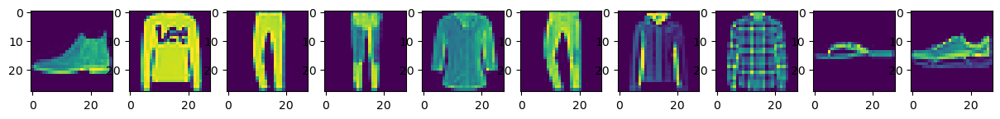

Noisy Data


<Figure size 640x480 with 0 Axes>

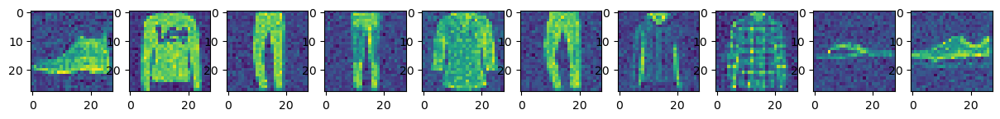

<Figure size 640x480 with 0 Axes>

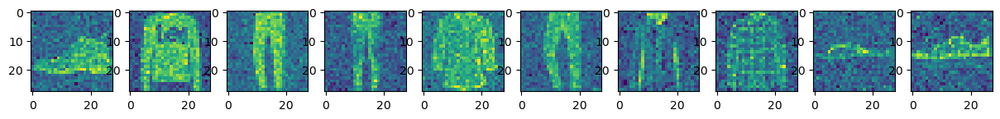

<Figure size 640x480 with 0 Axes>

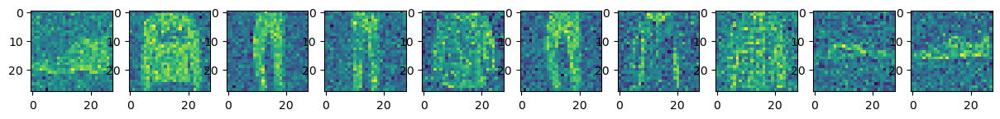

<Figure size 640x480 with 0 Axes>

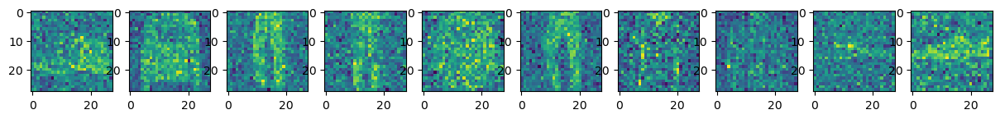

<Figure size 640x480 with 0 Axes>

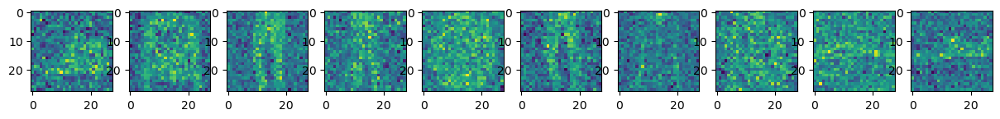

<Figure size 640x480 with 0 Axes>

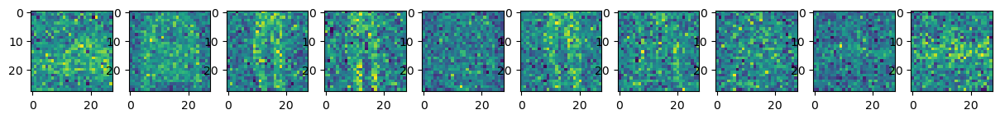

<Figure size 640x480 with 0 Axes>

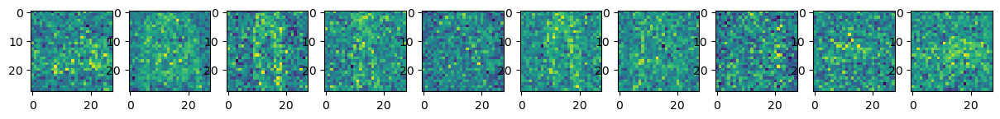

<Figure size 640x480 with 0 Axes>

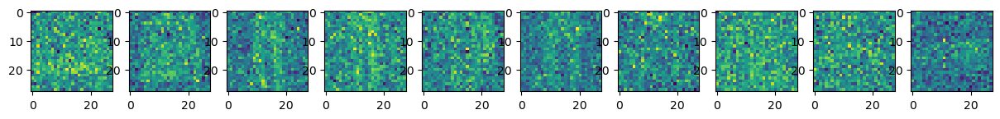

<Figure size 640x480 with 0 Axes>

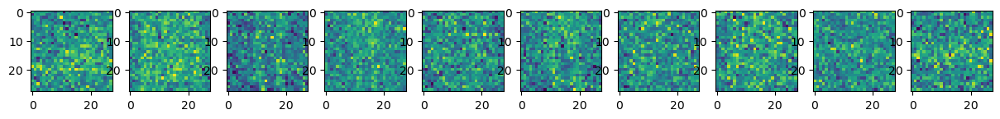

<Figure size 640x480 with 0 Axes>

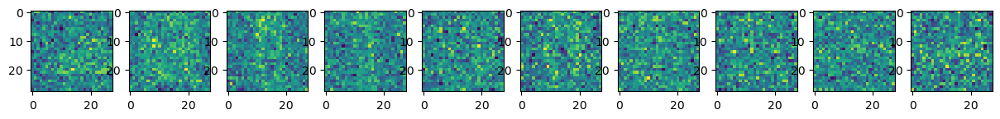

<Figure size 640x480 with 0 Axes>

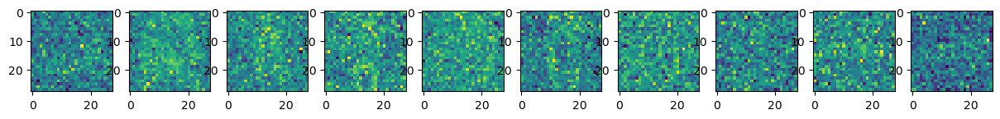

<Figure size 640x480 with 0 Axes>

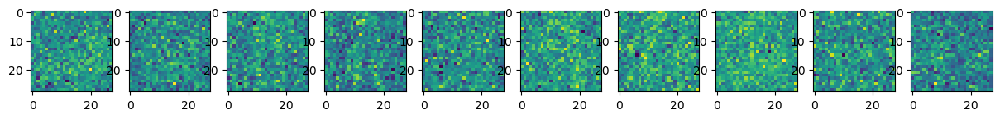

<Figure size 640x480 with 0 Axes>

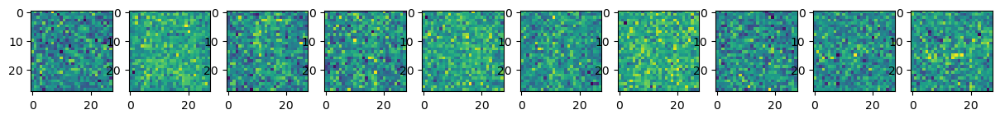

<Figure size 640x480 with 0 Axes>

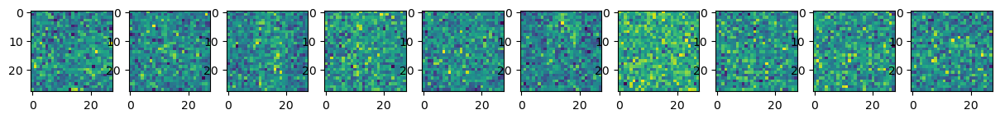

<Figure size 640x480 with 0 Axes>

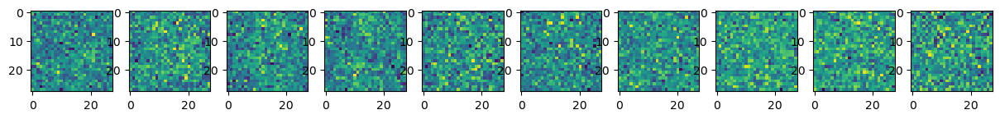

<Figure size 640x480 with 0 Axes>

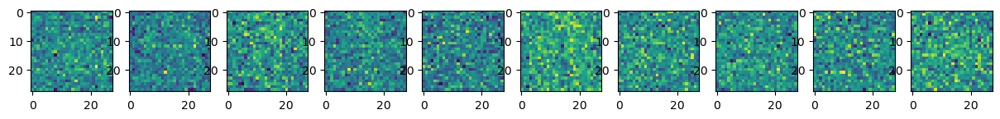

<Figure size 640x480 with 0 Axes>

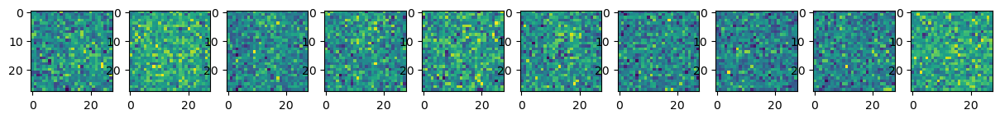

<Figure size 640x480 with 0 Axes>

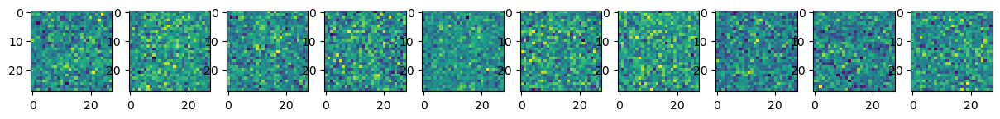

<Figure size 640x480 with 0 Axes>

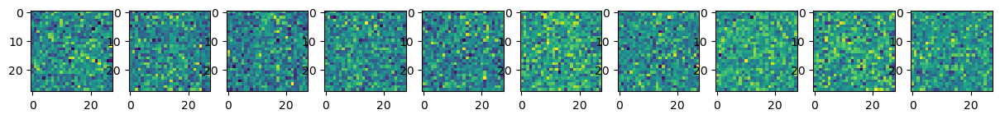

In [4]:
#Display clean data
print("Clean Data")
display_images(images_testing)

print("Noisy Data")
sd_test = np.arange(0.1,2,0.1)
for i in range(len(sd_test)):
    noisy_testing = generate_gaussian_noise(images_testing,sd_test[i])
    
    display_images(noisy_testing)
  

Contrast Data


<Figure size 640x480 with 0 Axes>

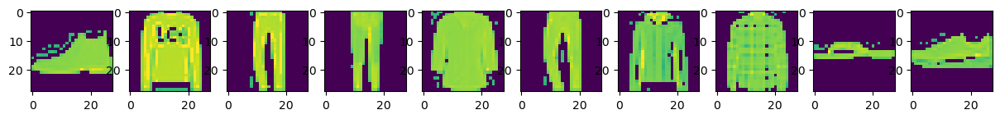

<Figure size 640x480 with 0 Axes>

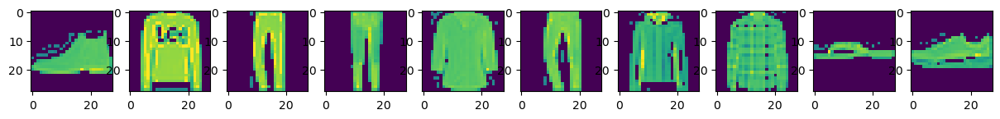

<Figure size 640x480 with 0 Axes>

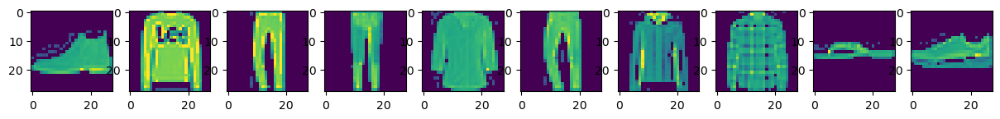

<Figure size 640x480 with 0 Axes>

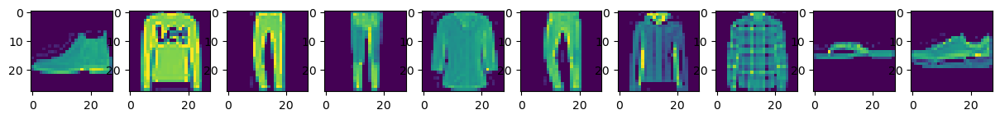

<Figure size 640x480 with 0 Axes>

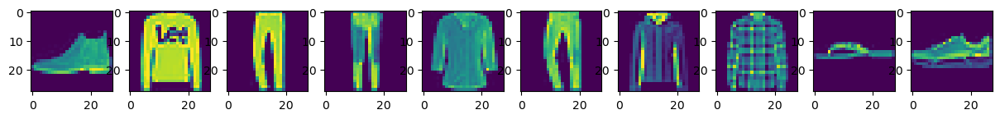

<Figure size 640x480 with 0 Axes>

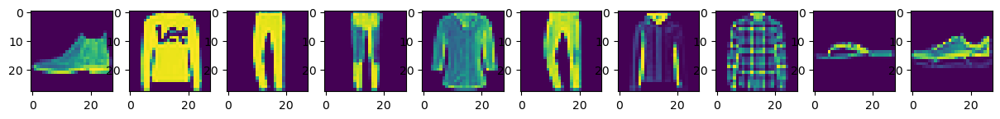

<Figure size 640x480 with 0 Axes>

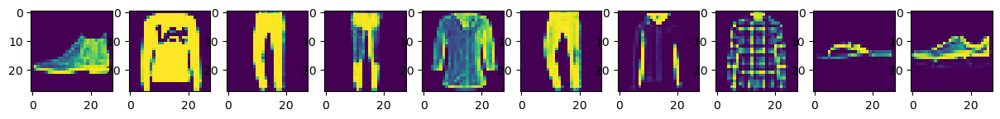

<Figure size 640x480 with 0 Axes>

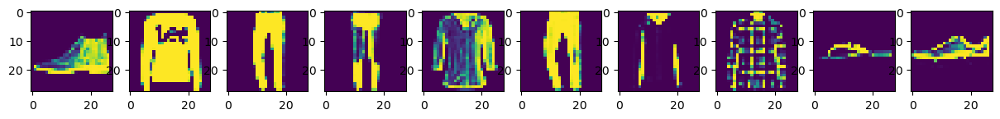

In [5]:
#Display contrast data


print("Contrast Data")
cn_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]
for i in range(len(cn_test)):
    noisy_testing = generate_contrast(images_testing,cn_test[i])
    
    display_images(noisy_testing)
  

Dropout Data


<Figure size 640x480 with 0 Axes>

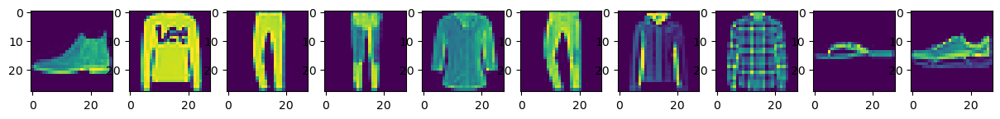

<Figure size 640x480 with 0 Axes>

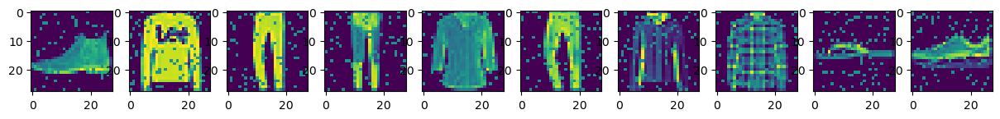

<Figure size 640x480 with 0 Axes>

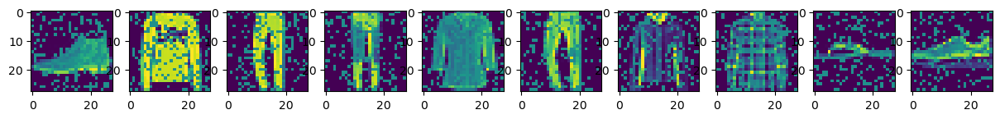

<Figure size 640x480 with 0 Axes>

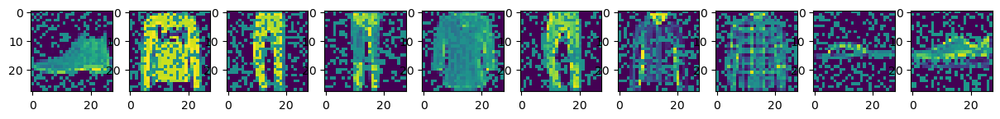

<Figure size 640x480 with 0 Axes>

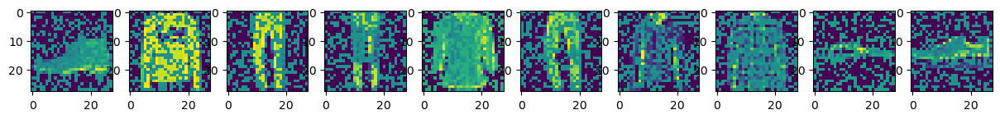

<Figure size 640x480 with 0 Axes>

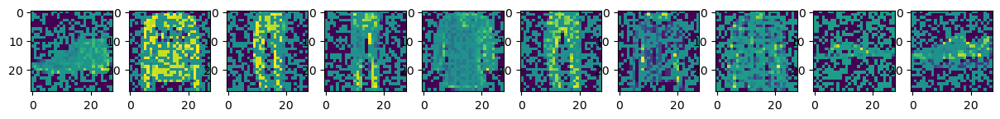

<Figure size 640x480 with 0 Axes>

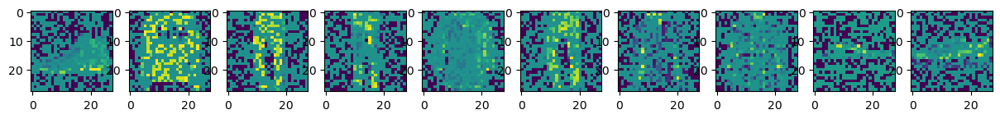

<Figure size 640x480 with 0 Axes>

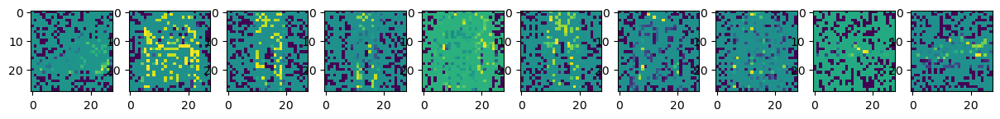

<Figure size 640x480 with 0 Axes>

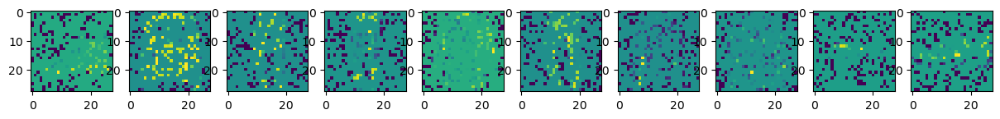

<Figure size 640x480 with 0 Axes>

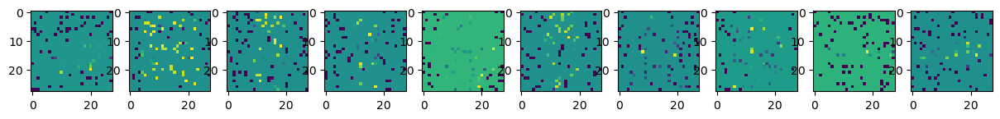

In [6]:
print("Dropout Data")
sd_test = np.arange(0,1,0.1)
for i in range(len(sd_test)):
    noisy_testing = generate_pixel_dropout(images_testing,sd_test[i])
    
    display_images(noisy_testing)

# Experiment 1a: Tiny Feedforward Network

In [73]:
#Train standard feedforward model

model_feedforward = []
model_feedforward_intermed = []

iterat = 2
for x in range(iterat):

    images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

    inputs = Input(shape=(784))
    layer = Dense(10,activation='relu')(inputs)


    outputs = Dense(10,activation='softmax')(layer)

    model = Model(inputs=inputs,outputs=outputs)

    model_intermed = Model(inputs=inputs,outputs=layer)

    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
    es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
    model.fit(images_training_flat,labels_training,batch_size=100,verbose = 0, epochs=500,validation_split=0.33,callbacks=[es])

    model_feedforward.append(model)
    model_feedforward_intermed.append(model_intermed)
 

Epoch 00048: early stopping
Epoch 00045: early stopping


<ipython-input-72-b1035d97e0b0>:106: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-72-b1035d97e0b0>:107: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

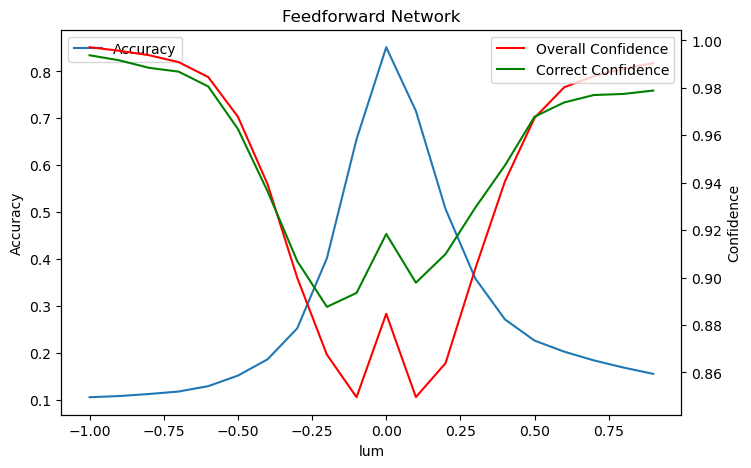

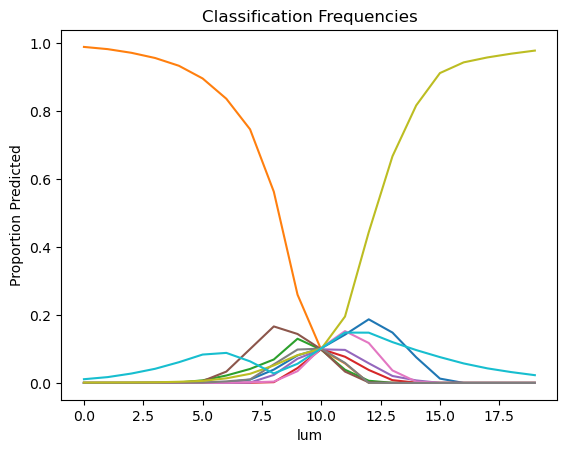

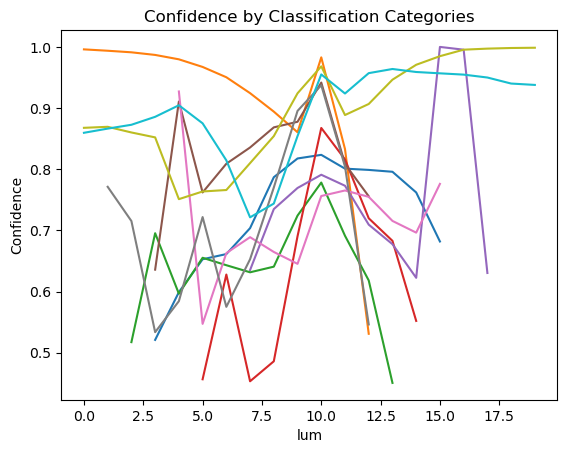

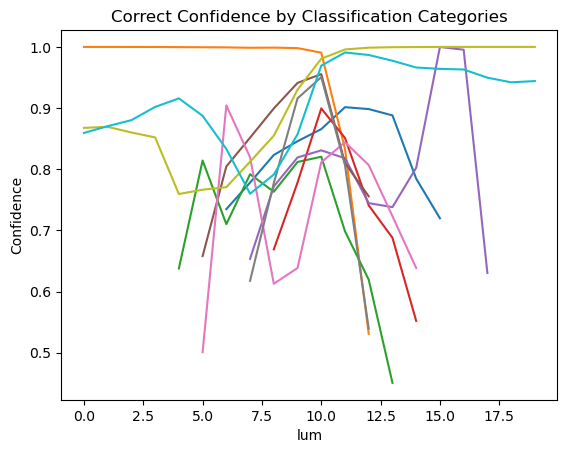

<Figure size 640x480 with 0 Axes>

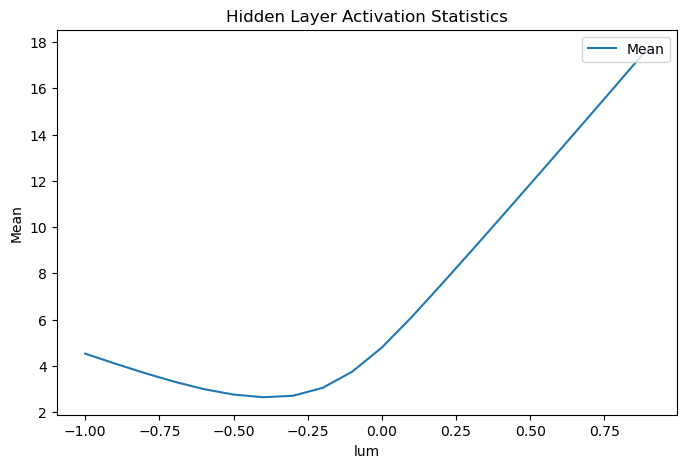

In [75]:
# Vary lum


sd_test = np.arange(-1,1,.1)



for x in range(iterat):

    all_conf_array = []
    correct_conf_array = []
    acc_array = []

    conf_cat_all_array = np.empty((10,0))
    conf_cat_correct_array = np.empty((10,0))
    freq_all = np.empty((10,0))

    activation_mean = []




    for i in range(len(sd_test)):
        images_testing_noise = generate_lum(images_testing,sd_test[i])
        images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
        labels_testing_predicted = model_feedforward[x].predict(images_testing_noise_flat)

        all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
        acc = compute_accuracy(labels_testing,labels_testing_predicted)

        all_conf_array.append(all_conf)
        correct_conf_array.append(correct_conf)   
        acc_array.append(acc)

        freq = compute_frequencies(labels_testing_predicted)

        freq_all = np.hstack((freq_all,freq))

        conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)



        conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
        conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))


        hidden_activation = model_feedforward_intermed[x].predict(images_testing_noise_flat)

        activation_mean.append(np.mean(hidden_activation))
        
     

    
    if x==0:
        all_conf_array_iter = np.array(all_conf_array)/iterat
        correct_conf_array_iter = np.array(correct_conf_array)/iterat
        acc_array_iter = np.array(acc_array)/iterat      
        activation_mean_iter = np.array(activation_mean)/iterat
    else:
        all_conf_array_iter = np.array(all_conf_array)/iterat + all_conf_array_iter
        correct_conf_array_iter = np.array(correct_conf_array)/iterat + correct_conf_array_iter        
        acc_array_iter = np.array(acc_array)/iterat + acc_array_iter         
        activation_mean_iter = np.array(activation_mean)/iterat + activation_mean_iter           
        
all_conf_array = all_conf_array_iter
correct_conf_array = correct_conf_array_iter 
acc_array = acc_array_iter 
activation_mean = activation_mean_iter

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("lum")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("lum")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("lum")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("lum")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("lum")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<Figure size 640x480 with 0 Axes>

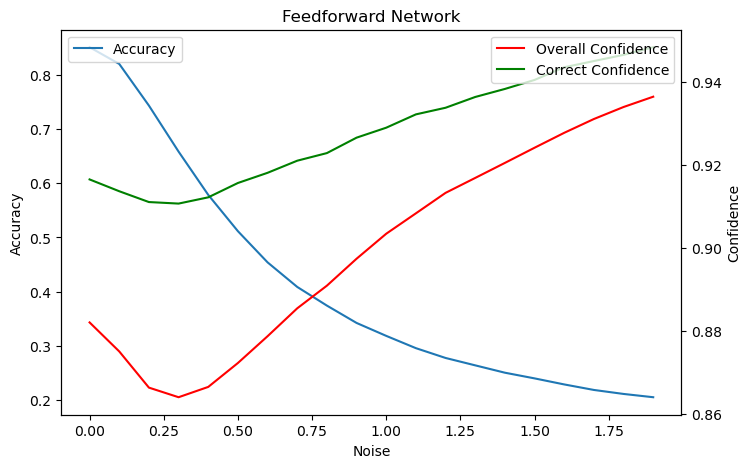

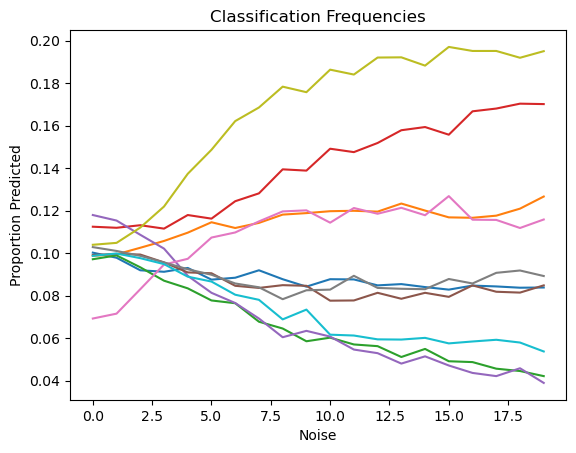

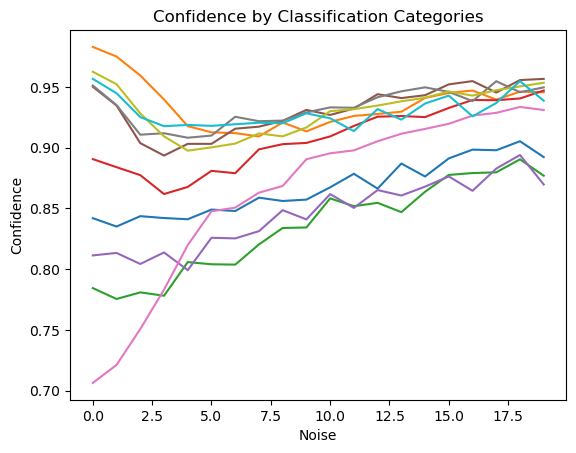

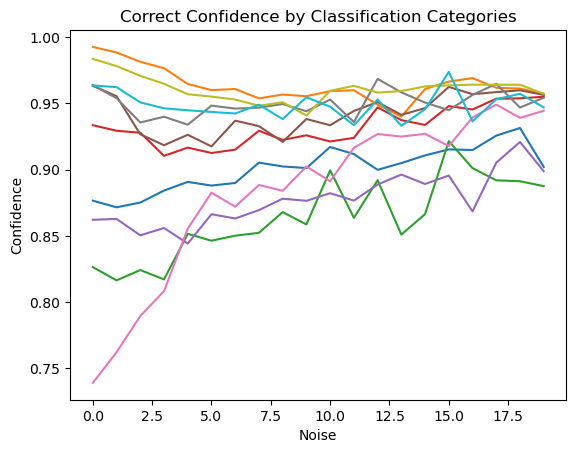

<Figure size 640x480 with 0 Axes>

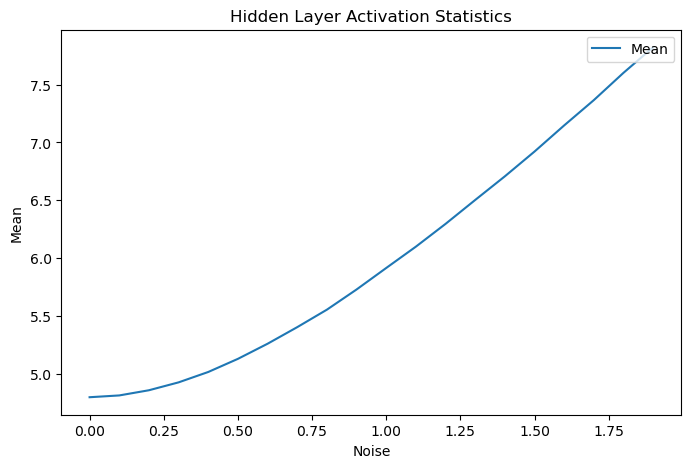

In [8]:
# Vary noise


sd_test = np.arange(0,2,.1)



for x in range(iterat):

    all_conf_array = []
    correct_conf_array = []
    acc_array = []

    conf_cat_all_array = np.empty((10,0))
    conf_cat_correct_array = np.empty((10,0))
    freq_all = np.empty((10,0))

    activation_mean = []




    for i in range(len(sd_test)):
        images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
        images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
        labels_testing_predicted = model_feedforward[x].predict(images_testing_noise_flat)

        all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
        acc = compute_accuracy(labels_testing,labels_testing_predicted)

        all_conf_array.append(all_conf)
        correct_conf_array.append(correct_conf)   
        acc_array.append(acc)

        freq = compute_frequencies(labels_testing_predicted)

        freq_all = np.hstack((freq_all,freq))

        conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)



        conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
        conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))


        hidden_activation = model_feedforward_intermed[x].predict(images_testing_noise_flat)

        activation_mean.append(np.mean(hidden_activation))
        
     

    
    if x==0:
        all_conf_array_iter = np.array(all_conf_array)/iterat
        correct_conf_array_iter = np.array(correct_conf_array)/iterat
        acc_array_iter = np.array(acc_array)/iterat      
        activation_mean_iter = np.array(activation_mean)/iterat
    else:
        all_conf_array_iter = np.array(all_conf_array)/iterat + all_conf_array_iter
        correct_conf_array_iter = np.array(correct_conf_array)/iterat + correct_conf_array_iter        
        acc_array_iter = np.array(acc_array)/iterat + acc_array_iter         
        activation_mean_iter = np.array(activation_mean)/iterat + activation_mean_iter           
        
all_conf_array = all_conf_array_iter
correct_conf_array = correct_conf_array_iter 
acc_array = acc_array_iter 
activation_mean = activation_mean_iter

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Noise")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<Figure size 640x480 with 0 Axes>

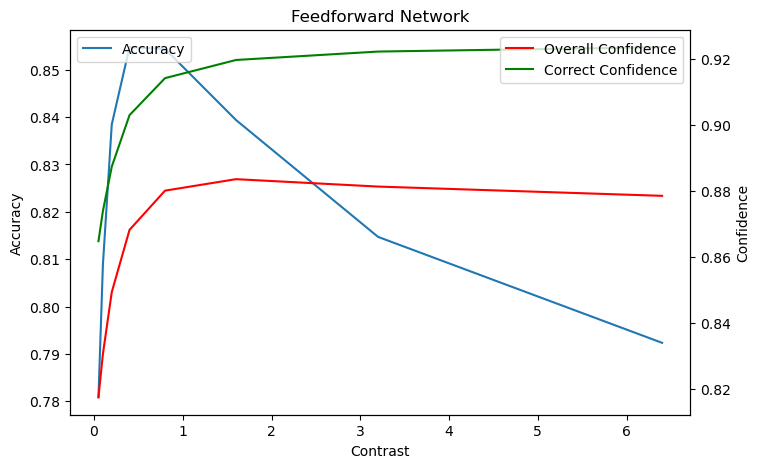

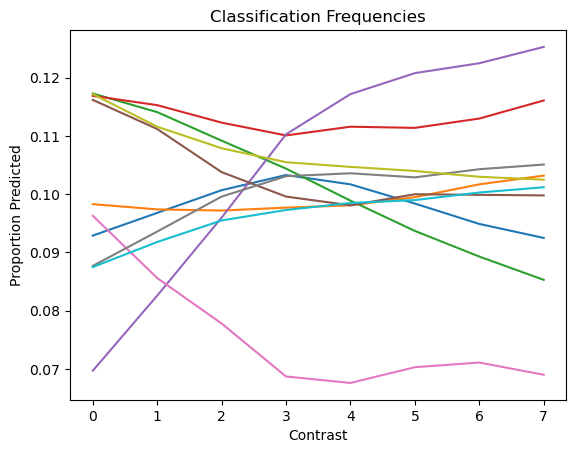

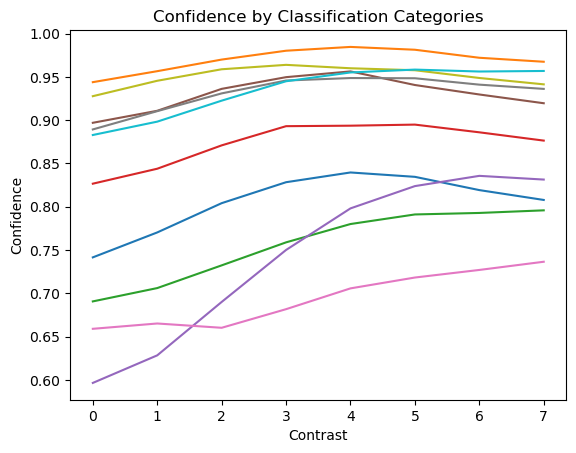

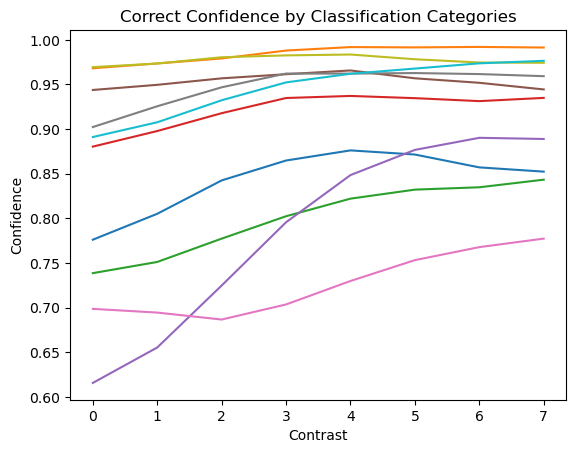

<Figure size 640x480 with 0 Axes>

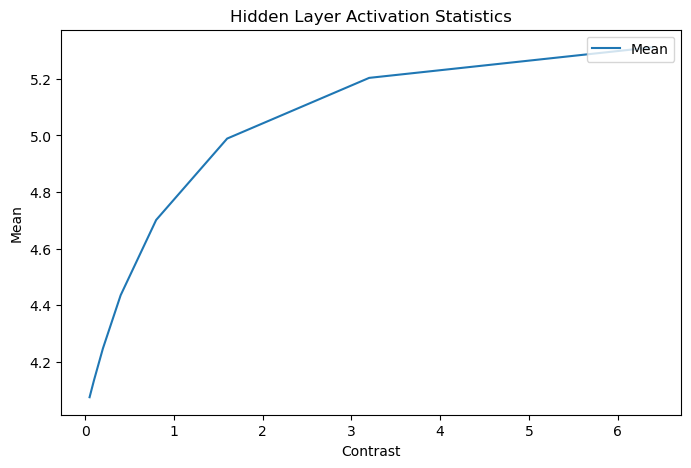

In [9]:
# Vary contrast


cn_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

for x in range(iterat):


    all_conf_array = []
    correct_conf_array = []
    acc_array = []

    conf_cat_all_array = np.empty((10,0))
    conf_cat_correct_array = np.empty((10,0))
    freq_all = np.empty((10,0))

    activation_mean = []

    for i in range(len(cn_test)):
        images_testing_noise = generate_contrast(images_testing,cn_test[i])
        images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
        labels_testing_predicted = model_feedforward[x].predict(images_testing_noise_flat)

        all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
        acc = compute_accuracy(labels_testing,labels_testing_predicted)

        all_conf_array.append(all_conf)
        correct_conf_array.append(correct_conf)   
        acc_array.append(acc)

        freq = compute_frequencies(labels_testing_predicted)

        freq_all = np.hstack((freq_all,freq))

        conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)



        conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
        conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))


        hidden_activation = model_feedforward_intermed[x].predict(images_testing_noise_flat)

        activation_mean.append(np.mean(hidden_activation))


    if x==0:
        all_conf_array_iter = np.array(all_conf_array)/iterat
        correct_conf_array_iter = np.array(correct_conf_array)/iterat
        acc_array_iter = np.array(acc_array)/iterat      
        activation_mean_iter = np.array(activation_mean)/iterat
    else:
        all_conf_array_iter = np.array(all_conf_array)/iterat + all_conf_array_iter
        correct_conf_array_iter = np.array(correct_conf_array)/iterat + correct_conf_array_iter        
        acc_array_iter = np.array(acc_array)/iterat + acc_array_iter         
        activation_mean_iter = np.array(activation_mean)/iterat + activation_mean_iter           
        
all_conf_array = all_conf_array_iter
correct_conf_array = correct_conf_array_iter 
acc_array = acc_array_iter 
activation_mean = activation_mean_iter    
    
   
    
plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Contrast")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cn_test,acc_array, label = "Accuracy")
conf_ax.plot(cn_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cn_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Contrast")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(cn_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<ipython-input-3-2497c16af76f>:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-3-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

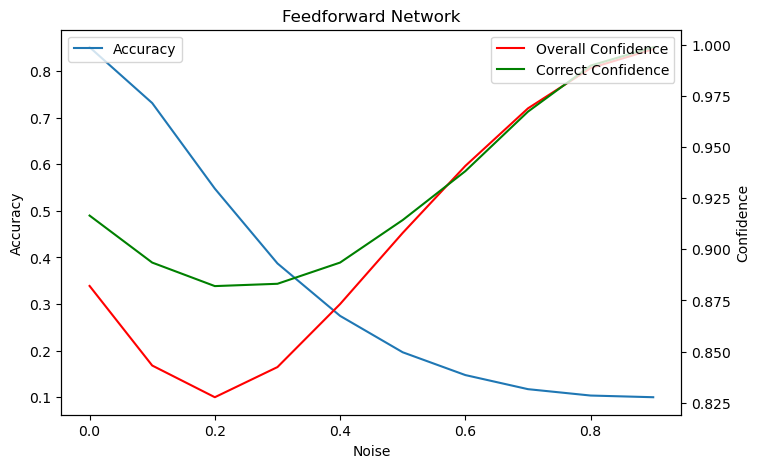

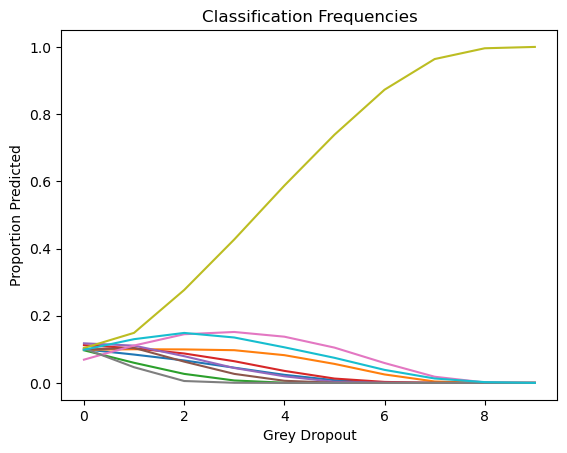

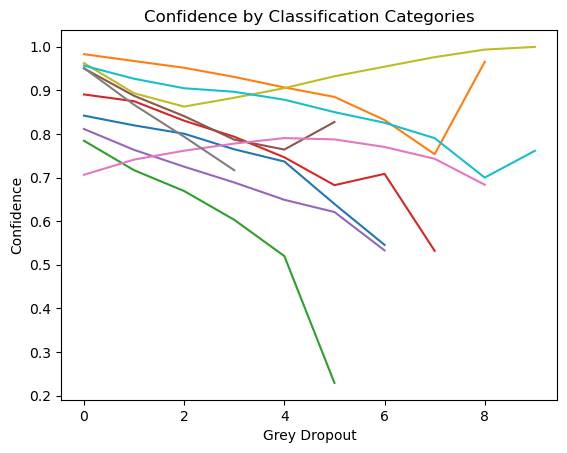

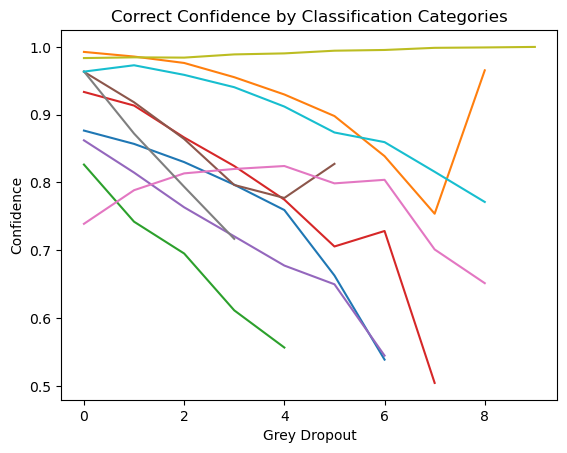

<Figure size 640x480 with 0 Axes>

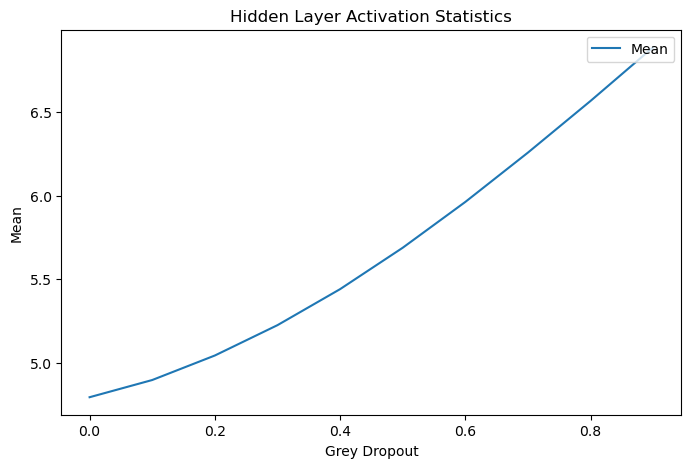

In [10]:
# Vary grey dropout


sd_test = np.arange(0,1,.1)

for x in range(iterat):

    all_conf_array = []
    correct_conf_array = []
    acc_array = []

    conf_cat_all_array = np.empty((10,0))
    conf_cat_correct_array = np.empty((10,0))
    freq_all = np.empty((10,0))

    activation_mean = []

    for i in range(len(sd_test)):
        images_testing_noise = generate_pixel_dropout(images_testing,sd_test[i],0.5)
        images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
        labels_testing_predicted = model_feedforward[x].predict(images_testing_noise_flat)

        all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
        acc = compute_accuracy(labels_testing,labels_testing_predicted)

        all_conf_array.append(all_conf)
        correct_conf_array.append(correct_conf)   
        acc_array.append(acc)

        freq = compute_frequencies(labels_testing_predicted)

        freq_all = np.hstack((freq_all,freq))

        conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)



        conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
        conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))


        hidden_activation = model_feedforward_intermed[x].predict(images_testing_noise_flat)

        activation_mean.append(np.mean(hidden_activation))


    
    if x==0:
        all_conf_array_iter = np.array(all_conf_array)/iterat
        correct_conf_array_iter = np.array(correct_conf_array)/iterat
        acc_array_iter = np.array(acc_array)/iterat      
        activation_mean_iter = np.array(activation_mean)/iterat
    else:
        all_conf_array_iter = np.array(all_conf_array)/iterat + all_conf_array_iter
        correct_conf_array_iter = np.array(correct_conf_array)/iterat + correct_conf_array_iter        
        acc_array_iter = np.array(acc_array)/iterat + acc_array_iter         
        activation_mean_iter = np.array(activation_mean)/iterat + activation_mean_iter           
        
all_conf_array = all_conf_array_iter
correct_conf_array = correct_conf_array_iter 
acc_array = acc_array_iter 
activation_mean = activation_mean_iter    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Grey Dropout")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<ipython-input-3-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

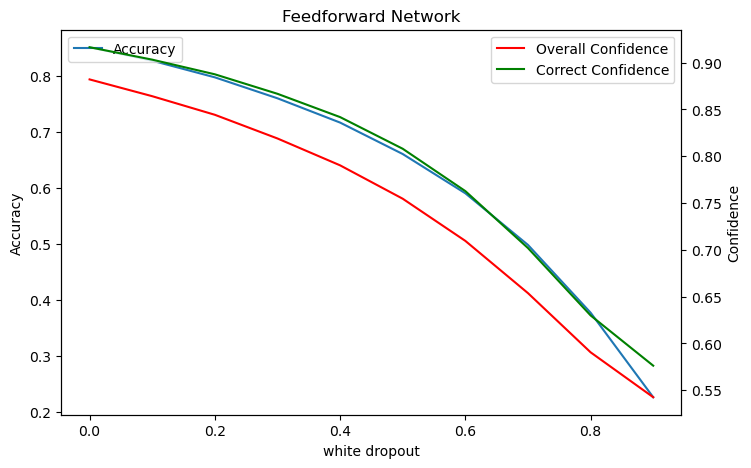

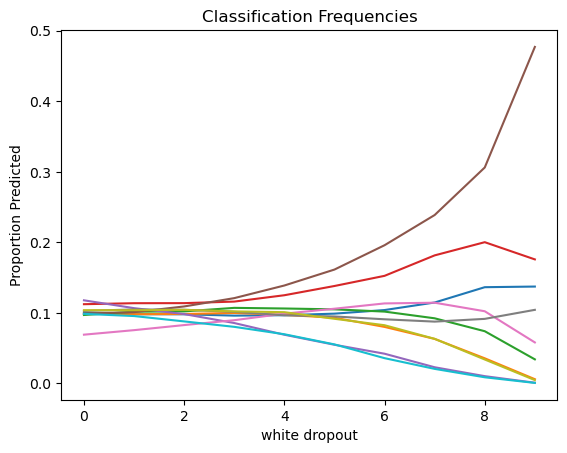

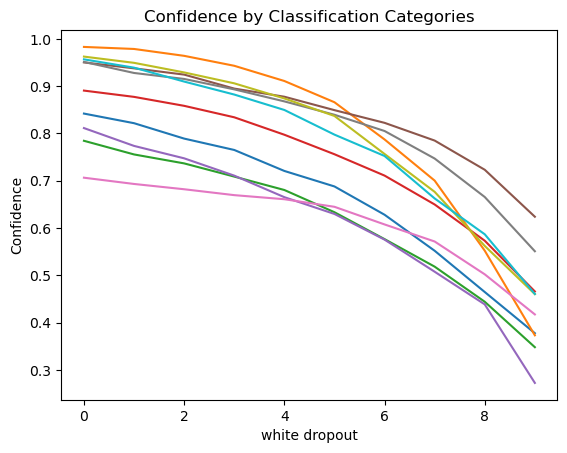

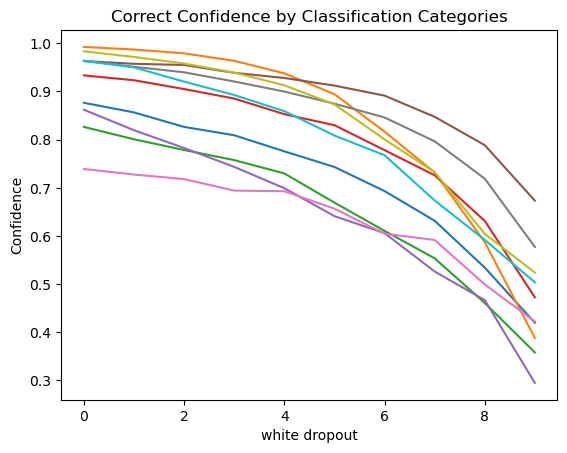

<Figure size 640x480 with 0 Axes>

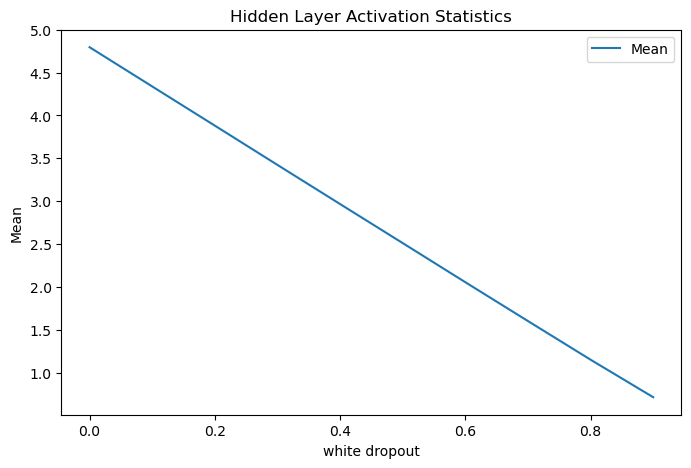

In [11]:
# Vary white dropout


sd_test = np.arange(0,1,.1)

for x in range(iterat):

    all_conf_array = []
    correct_conf_array = []
    acc_array = []

    conf_cat_all_array = np.empty((10,0))
    conf_cat_correct_array = np.empty((10,0))
    freq_all = np.empty((10,0))

    activation_mean = []

    for i in range(len(sd_test)):
        images_testing_noise = generate_pixel_dropout(images_testing,sd_test[i],0)
        images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
        labels_testing_predicted = model_feedforward[x].predict(images_testing_noise_flat)

        all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
        acc = compute_accuracy(labels_testing,labels_testing_predicted)

        all_conf_array.append(all_conf)
        correct_conf_array.append(correct_conf)   
        acc_array.append(acc)

        freq = compute_frequencies(labels_testing_predicted)

        freq_all = np.hstack((freq_all,freq))

        conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)



        conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
        conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))


        hidden_activation = model_feedforward_intermed[x].predict(images_testing_noise_flat)

        activation_mean.append(np.mean(hidden_activation))
    
    if x==0:
        all_conf_array_iter = np.array(all_conf_array)/iterat
        correct_conf_array_iter = np.array(correct_conf_array)/iterat
        acc_array_iter = np.array(acc_array)/iterat      
        activation_mean_iter = np.array(activation_mean)/iterat
    else:
        all_conf_array_iter = np.array(all_conf_array)/iterat + all_conf_array_iter
        correct_conf_array_iter = np.array(correct_conf_array)/iterat + correct_conf_array_iter        
        acc_array_iter = np.array(acc_array)/iterat + acc_array_iter         
        activation_mean_iter = np.array(activation_mean)/iterat + activation_mean_iter           
        
all_conf_array = all_conf_array_iter
correct_conf_array = correct_conf_array_iter 
acc_array = acc_array_iter 
activation_mean = activation_mean_iter    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("white dropout")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("white dropout")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("white dropout")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("white dropout")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("white dropout")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<ipython-input-3-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]
<ipython-input-3-2497c16af76f>:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]


<Figure size 640x480 with 0 Axes>

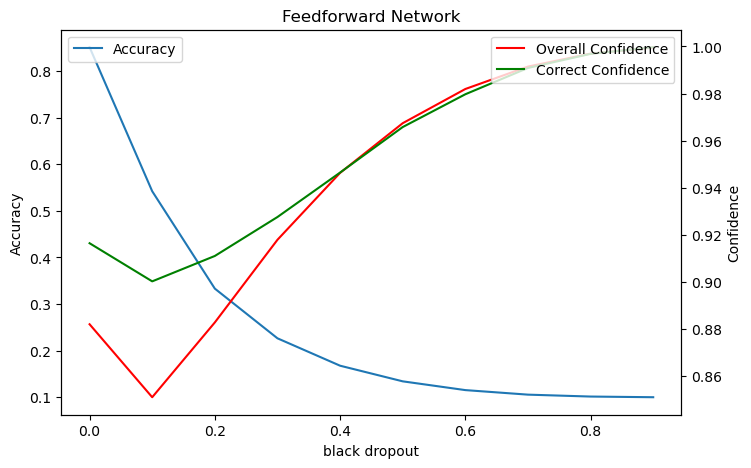

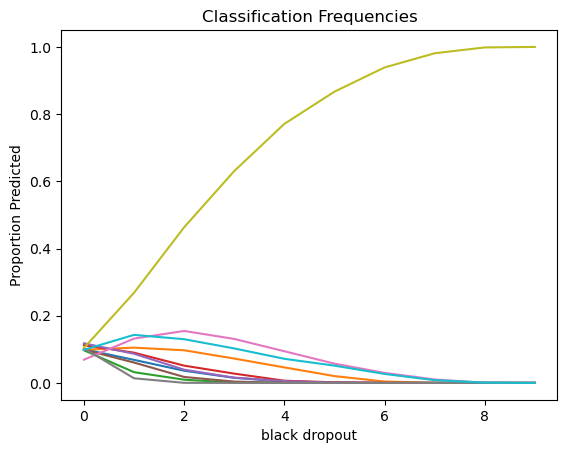

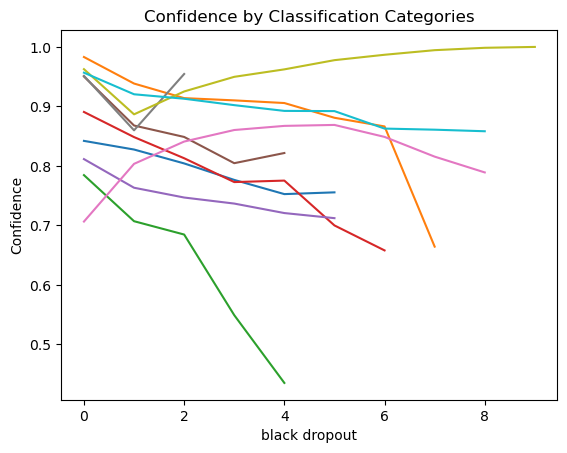

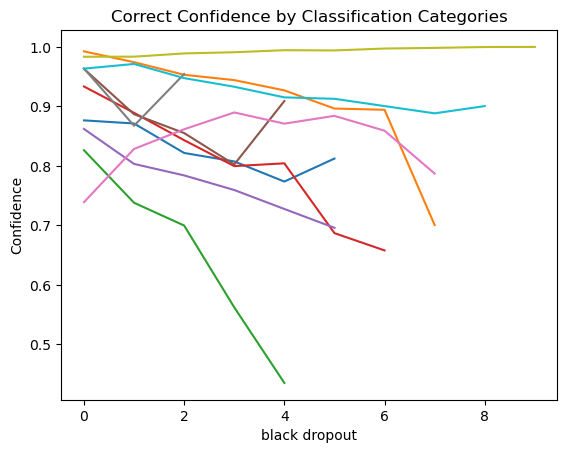

<Figure size 640x480 with 0 Axes>

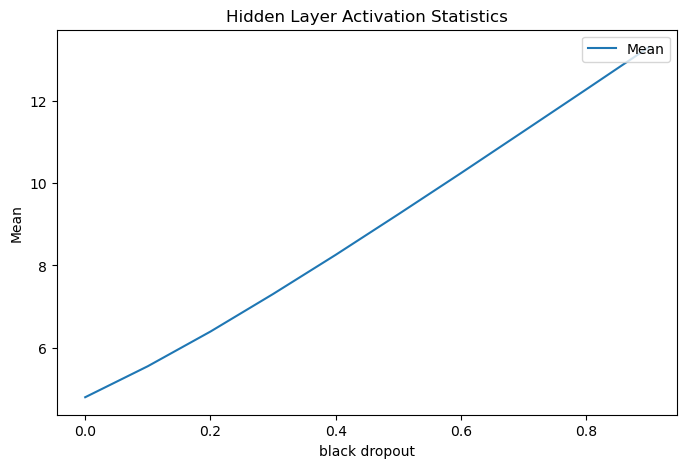

In [12]:
# Vary black dropout


sd_test = np.arange(0,1,.1)

for x in range(iterat):

    all_conf_array = []
    correct_conf_array = []
    acc_array = []

    conf_cat_all_array = np.empty((10,0))
    conf_cat_correct_array = np.empty((10,0))
    freq_all = np.empty((10,0))

    activation_mean = []

    for i in range(len(sd_test)):
        images_testing_noise = generate_pixel_dropout(images_testing,sd_test[i],1)
        images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
        labels_testing_predicted = model_feedforward[x].predict(images_testing_noise_flat)

        all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
        acc = compute_accuracy(labels_testing,labels_testing_predicted)

        all_conf_array.append(all_conf)
        correct_conf_array.append(correct_conf)   
        acc_array.append(acc)

        freq = compute_frequencies(labels_testing_predicted)

        freq_all = np.hstack((freq_all,freq))

        conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)



        conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
        conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))


        hidden_activation = model_feedforward_intermed[x].predict(images_testing_noise_flat)

        activation_mean.append(np.mean(hidden_activation))

    
    if x==0:
        all_conf_array_iter = np.array(all_conf_array)/iterat
        correct_conf_array_iter = np.array(correct_conf_array)/iterat
        acc_array_iter = np.array(acc_array)/iterat      
        activation_mean_iter = np.array(activation_mean)/iterat
    else:
        all_conf_array_iter = np.array(all_conf_array)/iterat + all_conf_array_iter
        correct_conf_array_iter = np.array(correct_conf_array)/iterat + correct_conf_array_iter        
        acc_array_iter = np.array(acc_array)/iterat + acc_array_iter         
        activation_mean_iter = np.array(activation_mean)/iterat + activation_mean_iter           
        
all_conf_array = all_conf_array_iter
correct_conf_array = correct_conf_array_iter 
acc_array = acc_array_iter 
activation_mean = activation_mean_iter    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("black dropout")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("black dropout")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("black dropout")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("black dropout")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("black dropout")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

# Experiment 1b: Tiny Feedforward Network with Hidden Layer normalization

In [76]:
#Train standard feedforward model

model_feedforward = []
model_feedforward_intermed = []


for x in range(iterat):


    images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

    inputs = Input(shape=(784))
    layer = Dense(10,activation='relu')(inputs)

    layer = LayerNormalization()(layer)
    outputs = Dense(10,activation='softmax')(layer)

    model = Model(inputs=inputs,outputs=outputs)

    model_intermed = Model(inputs=inputs,outputs=layer)

    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
    es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
    model.fit(images_training_flat,labels_training,batch_size=100,verbose = 0, epochs=500,validation_split=0.33,callbacks=[es])

    
    model_feedforward.append(model)
    model_feedforward_intermed.append(model_intermed)

Epoch 00029: early stopping
Epoch 00043: early stopping


<ipython-input-72-b1035d97e0b0>:106: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-72-b1035d97e0b0>:107: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

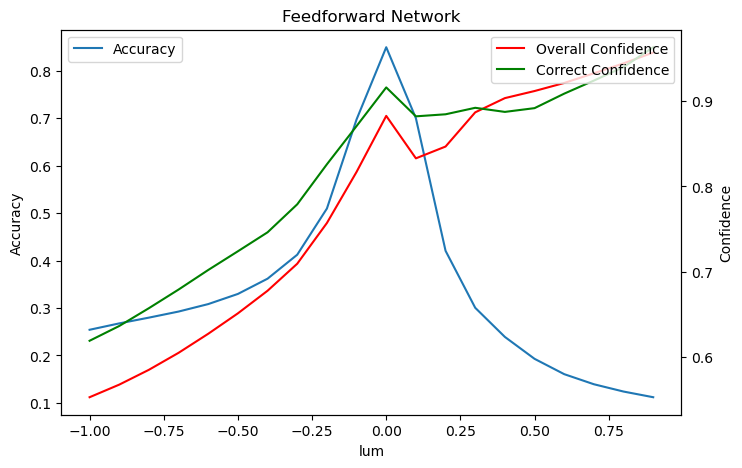

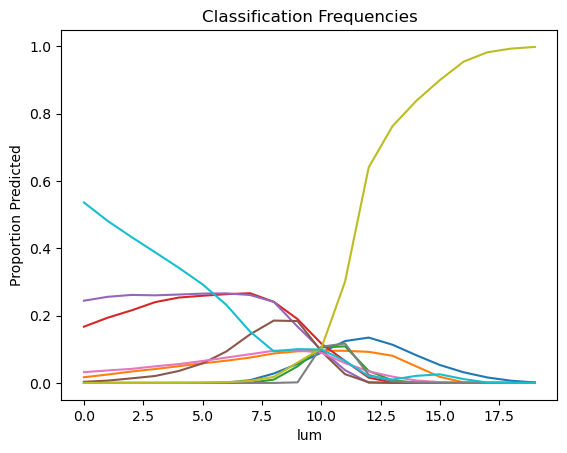

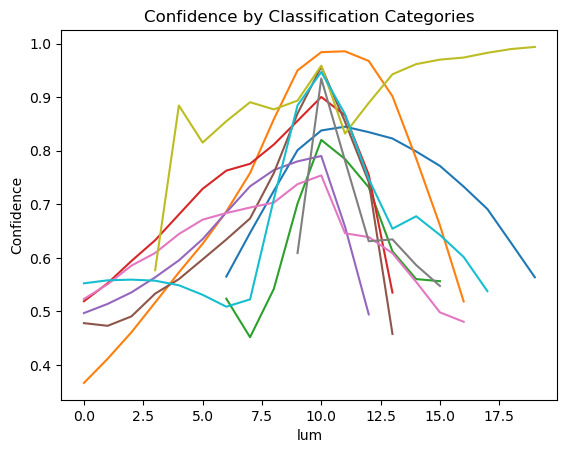

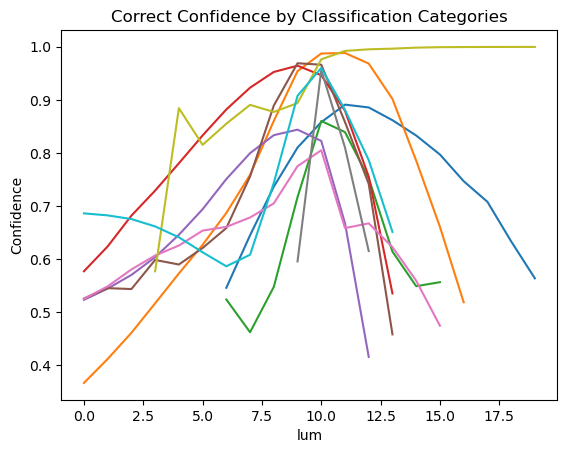

<Figure size 640x480 with 0 Axes>

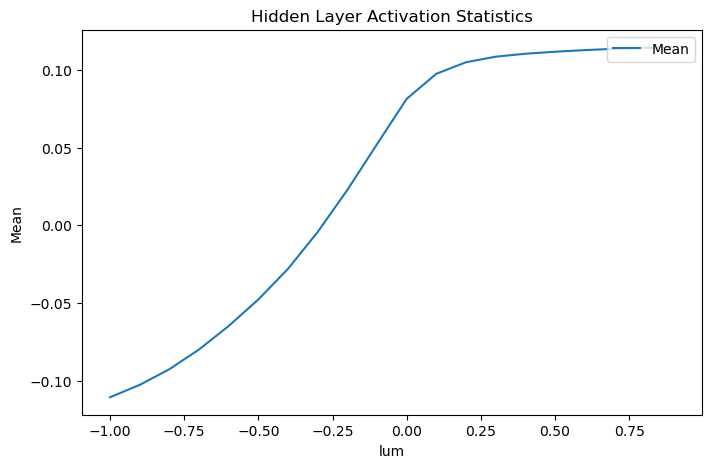

In [77]:
# Vary lum


sd_test = np.arange(-1,1,.1)



for x in range(iterat):

    all_conf_array = []
    correct_conf_array = []
    acc_array = []

    conf_cat_all_array = np.empty((10,0))
    conf_cat_correct_array = np.empty((10,0))
    freq_all = np.empty((10,0))

    activation_mean = []




    for i in range(len(sd_test)):
        images_testing_noise = generate_lum(images_testing,sd_test[i])
        images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
        labels_testing_predicted = model_feedforward[x].predict(images_testing_noise_flat)

        all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
        acc = compute_accuracy(labels_testing,labels_testing_predicted)

        all_conf_array.append(all_conf)
        correct_conf_array.append(correct_conf)   
        acc_array.append(acc)

        freq = compute_frequencies(labels_testing_predicted)

        freq_all = np.hstack((freq_all,freq))

        conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)



        conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
        conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))


        hidden_activation = model_feedforward_intermed[x].predict(images_testing_noise_flat)

        activation_mean.append(np.mean(hidden_activation))
        
     

    
    if x==0:
        all_conf_array_iter = np.array(all_conf_array)/iterat
        correct_conf_array_iter = np.array(correct_conf_array)/iterat
        acc_array_iter = np.array(acc_array)/iterat      
        activation_mean_iter = np.array(activation_mean)/iterat
    else:
        all_conf_array_iter = np.array(all_conf_array)/iterat + all_conf_array_iter
        correct_conf_array_iter = np.array(correct_conf_array)/iterat + correct_conf_array_iter        
        acc_array_iter = np.array(acc_array)/iterat + acc_array_iter         
        activation_mean_iter = np.array(activation_mean)/iterat + activation_mean_iter           
        
all_conf_array = all_conf_array_iter
correct_conf_array = correct_conf_array_iter 
acc_array = acc_array_iter 
activation_mean = activation_mean_iter

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("lum")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("lum")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("lum")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("lum")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("lum")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<Figure size 640x480 with 0 Axes>

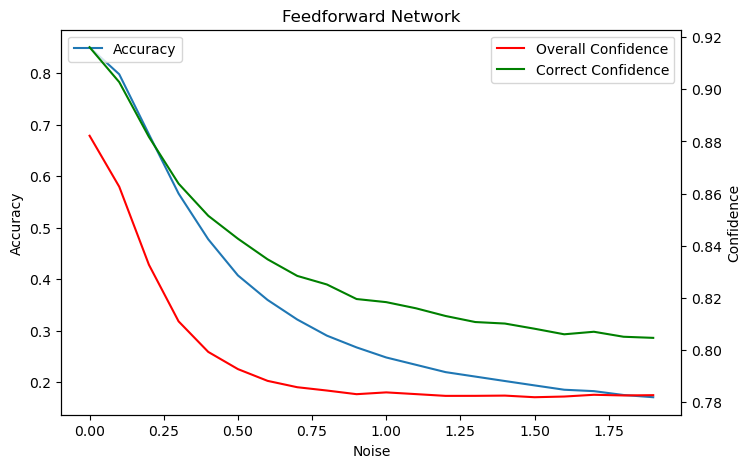

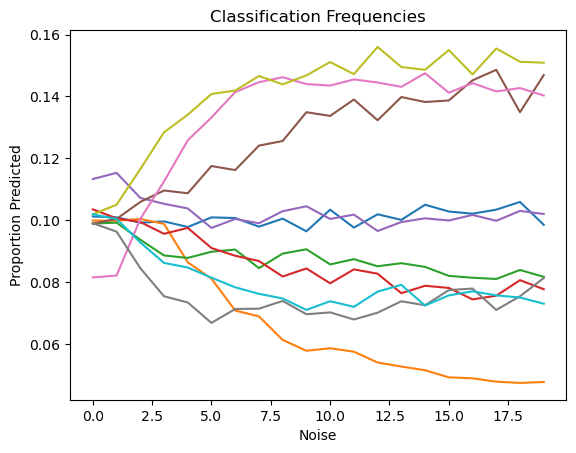

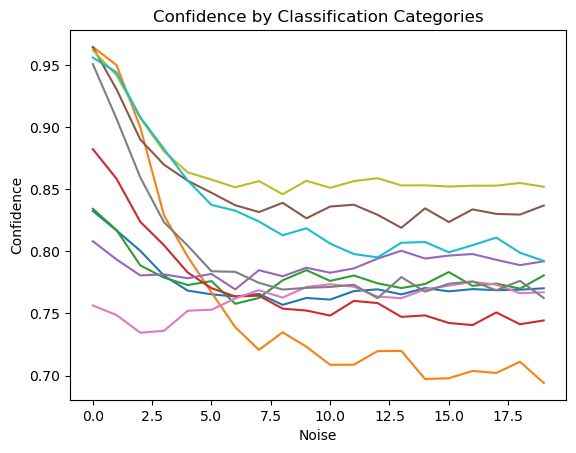

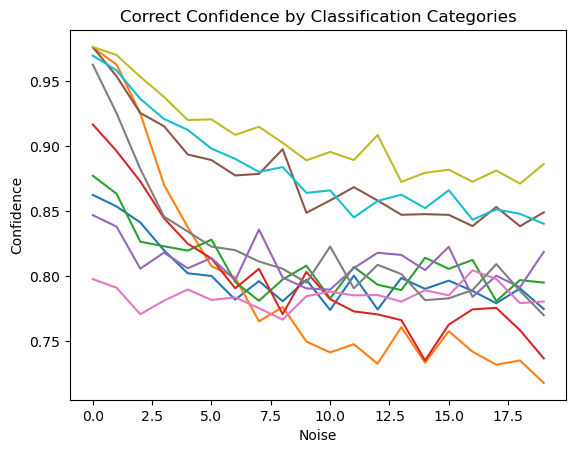

<Figure size 640x480 with 0 Axes>

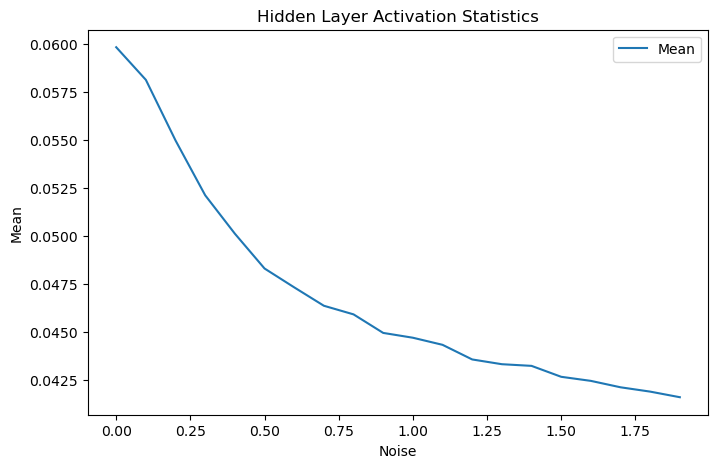

In [14]:
# Vary noise


sd_test = np.arange(0,2,.1)



for x in range(iterat):

    all_conf_array = []
    correct_conf_array = []
    acc_array = []

    conf_cat_all_array = np.empty((10,0))
    conf_cat_correct_array = np.empty((10,0))
    freq_all = np.empty((10,0))

    activation_mean = []




    for i in range(len(sd_test)):
        images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
        images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
        labels_testing_predicted = model_feedforward[x].predict(images_testing_noise_flat)

        all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
        acc = compute_accuracy(labels_testing,labels_testing_predicted)

        all_conf_array.append(all_conf)
        correct_conf_array.append(correct_conf)   
        acc_array.append(acc)

        freq = compute_frequencies(labels_testing_predicted)

        freq_all = np.hstack((freq_all,freq))

        conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)



        conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
        conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))


        hidden_activation = model_feedforward_intermed[x].predict(images_testing_noise_flat)

        activation_mean.append(np.mean(hidden_activation))
        
     

    
    if x==0:
        all_conf_array_iter = np.array(all_conf_array)/iterat
        correct_conf_array_iter = np.array(correct_conf_array)/iterat
        acc_array_iter = np.array(acc_array)/iterat      
        activation_mean_iter = np.array(activation_mean)/iterat
    else:
        all_conf_array_iter = np.array(all_conf_array)/iterat + all_conf_array_iter
        correct_conf_array_iter = np.array(correct_conf_array)/iterat + correct_conf_array_iter        
        acc_array_iter = np.array(acc_array)/iterat + acc_array_iter         
        activation_mean_iter = np.array(activation_mean)/iterat + activation_mean_iter           
        
all_conf_array = all_conf_array_iter
correct_conf_array = correct_conf_array_iter 
acc_array = acc_array_iter 
activation_mean = activation_mean_iter

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Noise")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<Figure size 640x480 with 0 Axes>

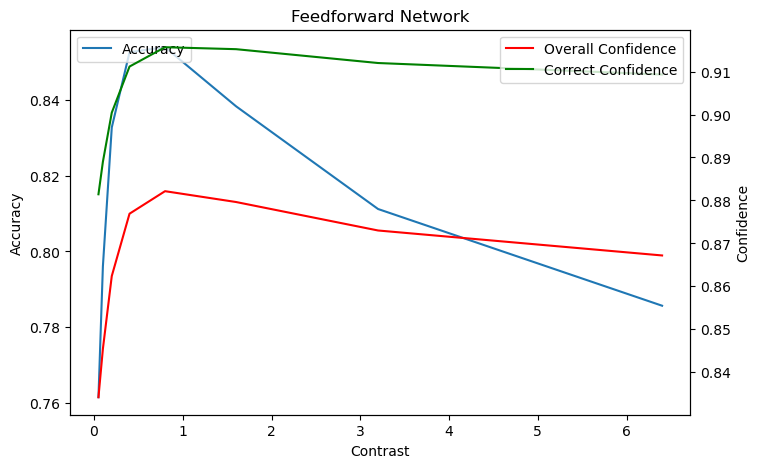

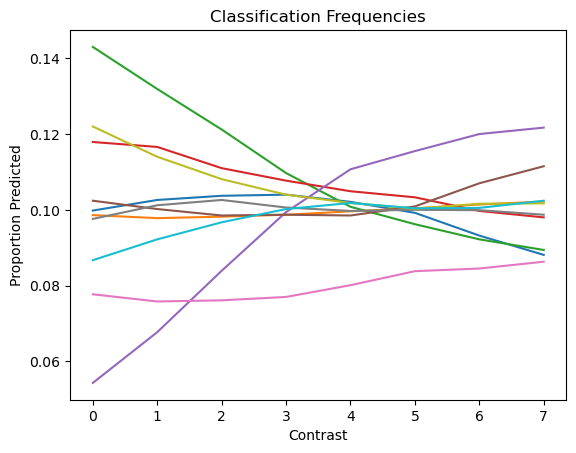

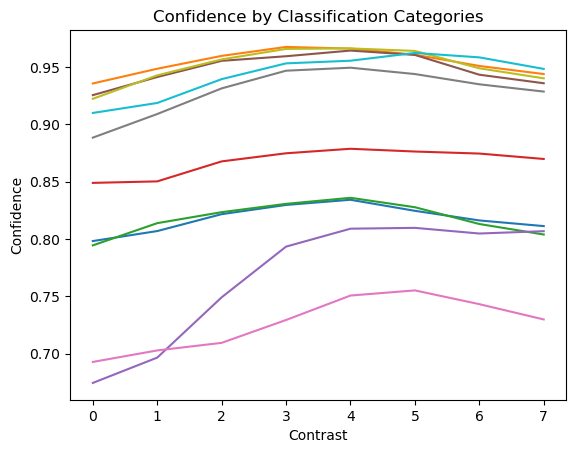

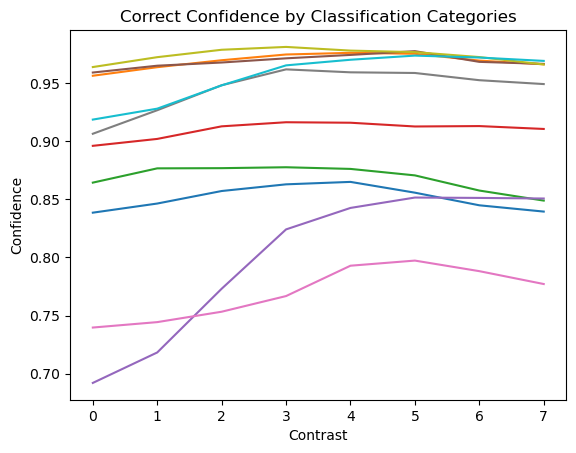

<Figure size 640x480 with 0 Axes>

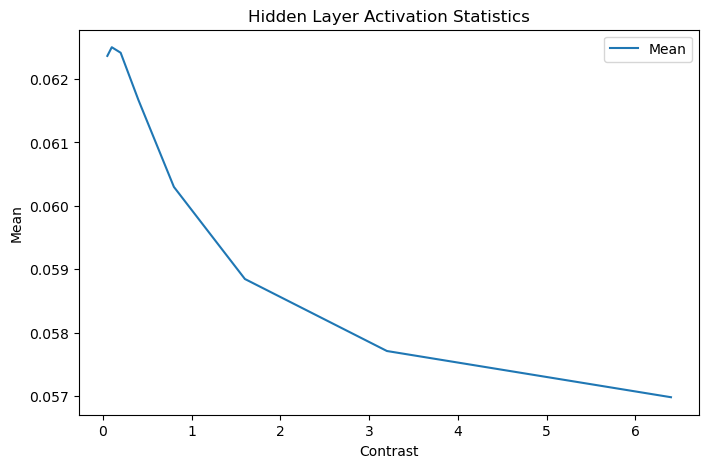

In [15]:
# Vary contrast


cn_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

for x in range(iterat):


    all_conf_array = []
    correct_conf_array = []
    acc_array = []

    conf_cat_all_array = np.empty((10,0))
    conf_cat_correct_array = np.empty((10,0))
    freq_all = np.empty((10,0))

    activation_mean = []

    for i in range(len(cn_test)):
        images_testing_noise = generate_contrast(images_testing,cn_test[i])
        images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
        labels_testing_predicted = model_feedforward[x].predict(images_testing_noise_flat)

        all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
        acc = compute_accuracy(labels_testing,labels_testing_predicted)

        all_conf_array.append(all_conf)
        correct_conf_array.append(correct_conf)   
        acc_array.append(acc)

        freq = compute_frequencies(labels_testing_predicted)

        freq_all = np.hstack((freq_all,freq))

        conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)



        conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
        conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))


        hidden_activation = model_feedforward_intermed[x].predict(images_testing_noise_flat)

        activation_mean.append(np.mean(hidden_activation))


    if x==0:
        all_conf_array_iter = np.array(all_conf_array)/iterat
        correct_conf_array_iter = np.array(correct_conf_array)/iterat
        acc_array_iter = np.array(acc_array)/iterat      
        activation_mean_iter = np.array(activation_mean)/iterat
    else:
        all_conf_array_iter = np.array(all_conf_array)/iterat + all_conf_array_iter
        correct_conf_array_iter = np.array(correct_conf_array)/iterat + correct_conf_array_iter        
        acc_array_iter = np.array(acc_array)/iterat + acc_array_iter         
        activation_mean_iter = np.array(activation_mean)/iterat + activation_mean_iter           
        
all_conf_array = all_conf_array_iter
correct_conf_array = correct_conf_array_iter 
acc_array = acc_array_iter 
activation_mean = activation_mean_iter    
    
   
    
plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Contrast")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cn_test,acc_array, label = "Accuracy")
conf_ax.plot(cn_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cn_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Contrast")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(cn_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<ipython-input-3-2497c16af76f>:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-3-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

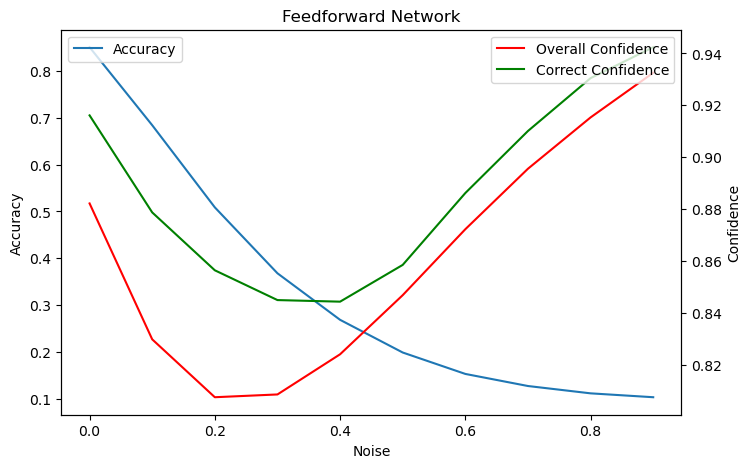

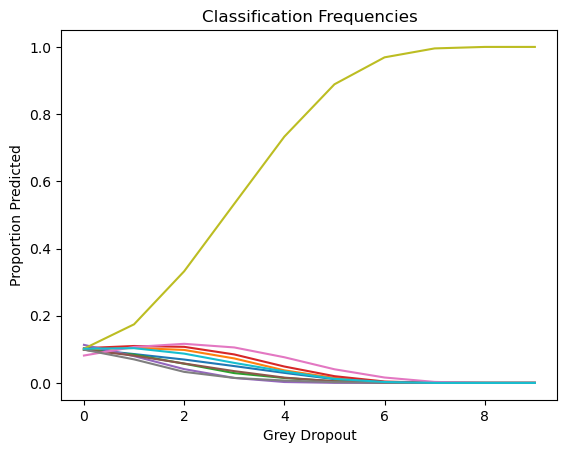

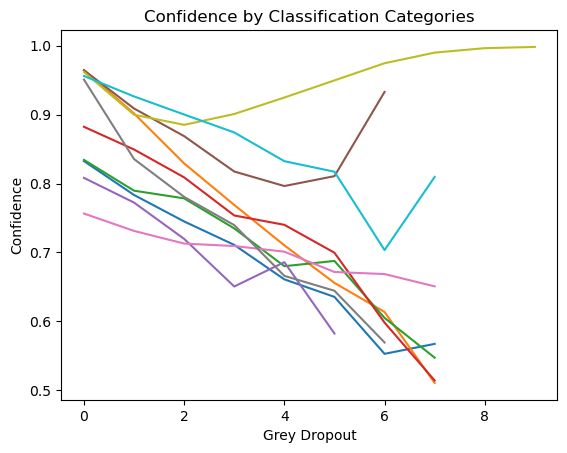

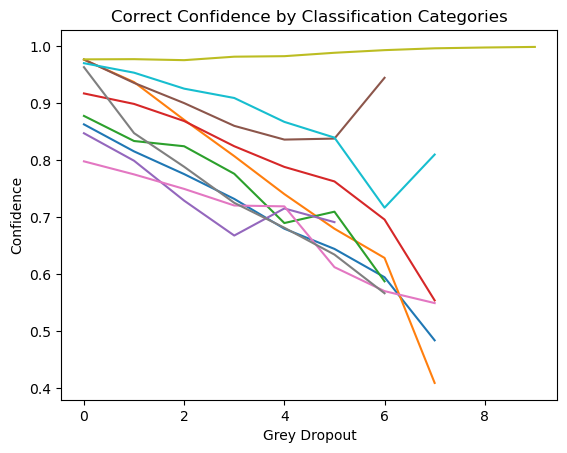

<Figure size 640x480 with 0 Axes>

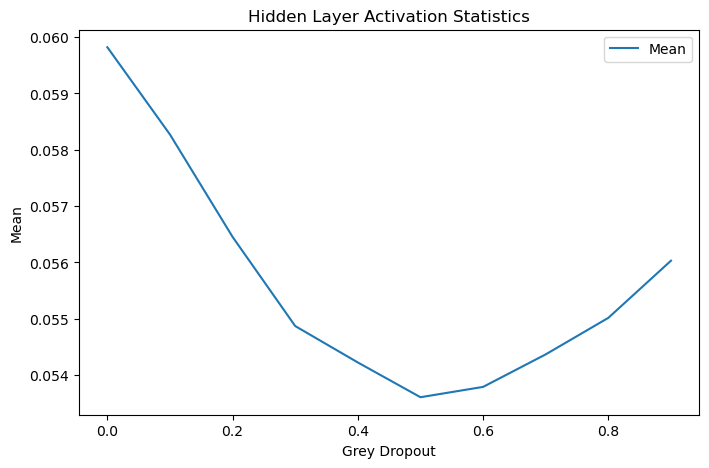

In [16]:
# Vary grey dropout


sd_test = np.arange(0,1,.1)

for x in range(iterat):

    all_conf_array = []
    correct_conf_array = []
    acc_array = []

    conf_cat_all_array = np.empty((10,0))
    conf_cat_correct_array = np.empty((10,0))
    freq_all = np.empty((10,0))

    activation_mean = []

    for i in range(len(sd_test)):
        images_testing_noise = generate_pixel_dropout(images_testing,sd_test[i],0.5)
        images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
        labels_testing_predicted = model_feedforward[x].predict(images_testing_noise_flat)

        all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
        acc = compute_accuracy(labels_testing,labels_testing_predicted)

        all_conf_array.append(all_conf)
        correct_conf_array.append(correct_conf)   
        acc_array.append(acc)

        freq = compute_frequencies(labels_testing_predicted)

        freq_all = np.hstack((freq_all,freq))

        conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)



        conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
        conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))


        hidden_activation = model_feedforward_intermed[x].predict(images_testing_noise_flat)

        activation_mean.append(np.mean(hidden_activation))
    
    
    
    if x==0:
        all_conf_array_iter = np.array(all_conf_array)/iterat
        correct_conf_array_iter = np.array(correct_conf_array)/iterat
        acc_array_iter = np.array(acc_array)/iterat      
        activation_mean_iter = np.array(activation_mean)/iterat
    else:
        all_conf_array_iter = np.array(all_conf_array)/iterat + all_conf_array_iter
        correct_conf_array_iter = np.array(correct_conf_array)/iterat + correct_conf_array_iter        
        acc_array_iter = np.array(acc_array)/iterat + acc_array_iter         
        activation_mean_iter = np.array(activation_mean)/iterat + activation_mean_iter           
        
all_conf_array = all_conf_array_iter
correct_conf_array = correct_conf_array_iter 
acc_array = acc_array_iter 
activation_mean = activation_mean_iter    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Grey Dropout")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<Figure size 640x480 with 0 Axes>

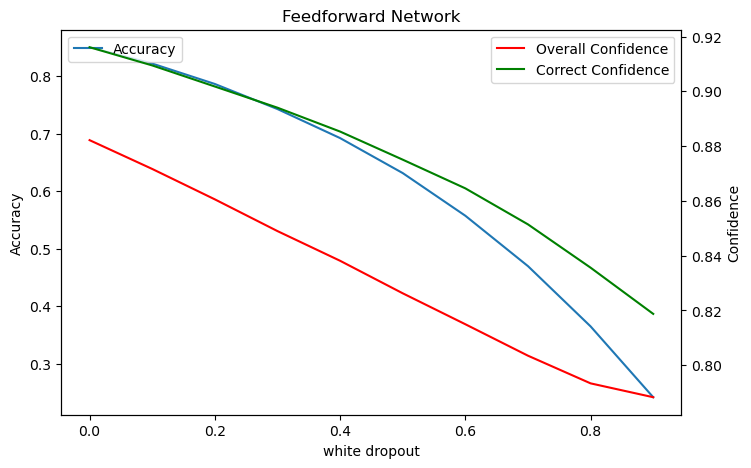

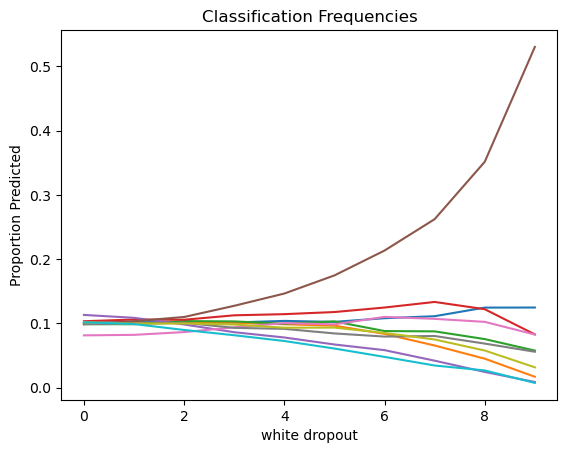

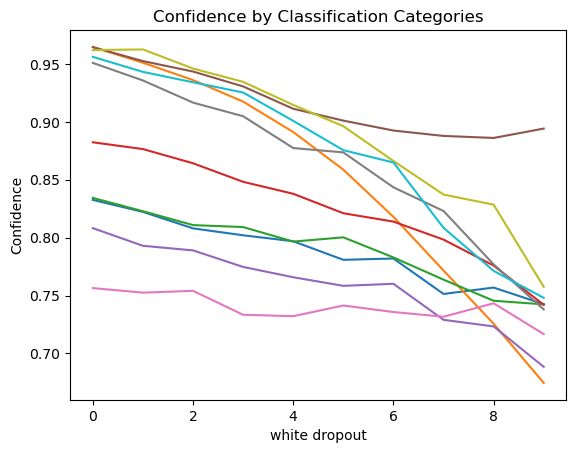

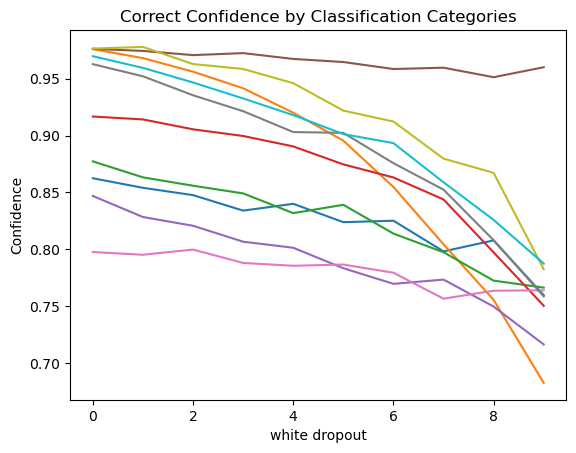

<Figure size 640x480 with 0 Axes>

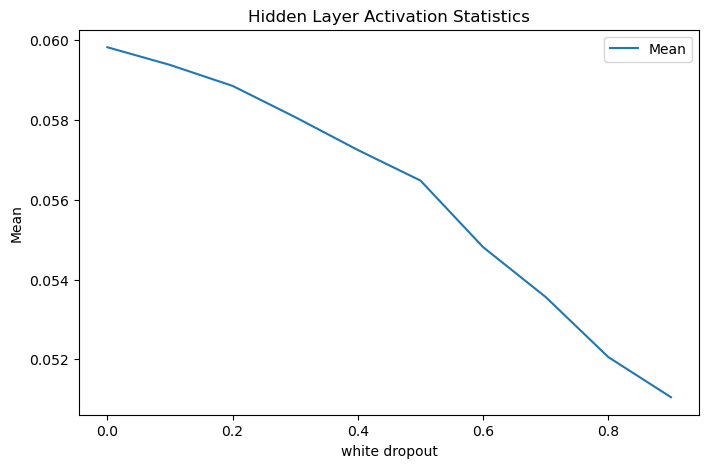

In [17]:
# Vary white dropout


sd_test = np.arange(0,1,.1)

for x in range(iterat):

    all_conf_array = []
    correct_conf_array = []
    acc_array = []

    conf_cat_all_array = np.empty((10,0))
    conf_cat_correct_array = np.empty((10,0))
    freq_all = np.empty((10,0))

    activation_mean = []

    for i in range(len(sd_test)):
        images_testing_noise = generate_pixel_dropout(images_testing,sd_test[i],0)
        images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
        labels_testing_predicted = model_feedforward[x].predict(images_testing_noise_flat)

        all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
        acc = compute_accuracy(labels_testing,labels_testing_predicted)

        all_conf_array.append(all_conf)
        correct_conf_array.append(correct_conf)   
        acc_array.append(acc)

        freq = compute_frequencies(labels_testing_predicted)

        freq_all = np.hstack((freq_all,freq))

        conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)



        conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
        conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))


        hidden_activation = model_feedforward_intermed[x].predict(images_testing_noise_flat)

        activation_mean.append(np.mean(hidden_activation))
    
    if x==0:
        all_conf_array_iter = np.array(all_conf_array)/iterat
        correct_conf_array_iter = np.array(correct_conf_array)/iterat
        acc_array_iter = np.array(acc_array)/iterat      
        activation_mean_iter = np.array(activation_mean)/iterat
    else:
        all_conf_array_iter = np.array(all_conf_array)/iterat + all_conf_array_iter
        correct_conf_array_iter = np.array(correct_conf_array)/iterat + correct_conf_array_iter        
        acc_array_iter = np.array(acc_array)/iterat + acc_array_iter         
        activation_mean_iter = np.array(activation_mean)/iterat + activation_mean_iter           
        
all_conf_array = all_conf_array_iter
correct_conf_array = correct_conf_array_iter 
acc_array = acc_array_iter 
activation_mean = activation_mean_iter    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("white dropout")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("white dropout")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("white dropout")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("white dropout")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("white dropout")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<ipython-input-3-2497c16af76f>:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-3-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

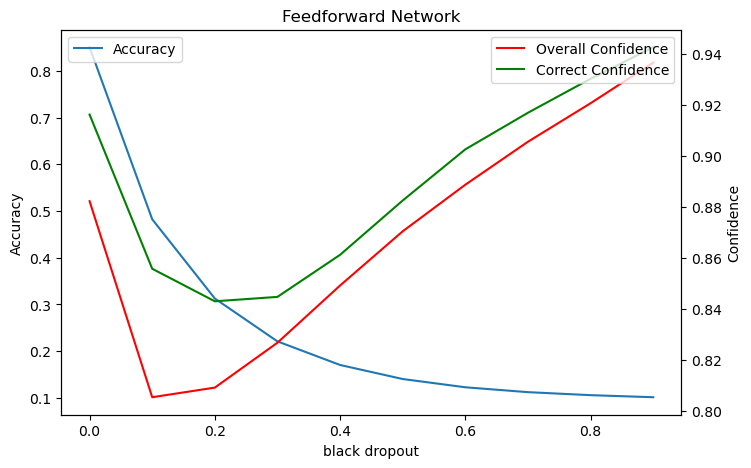

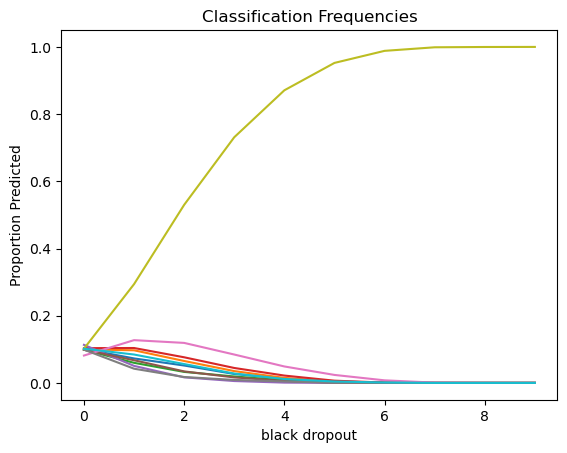

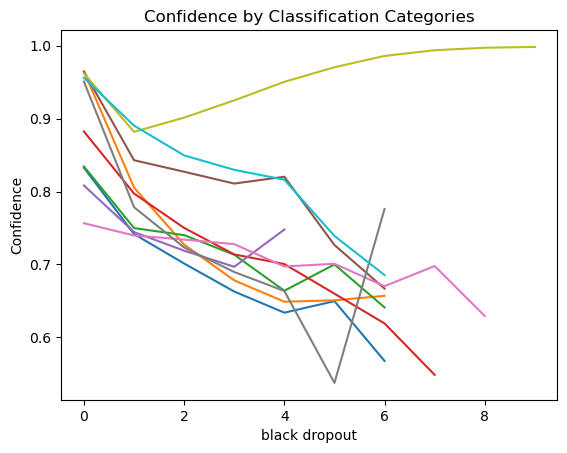

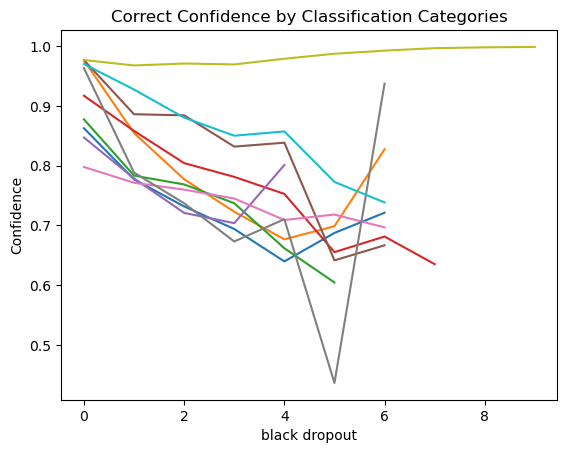

<Figure size 640x480 with 0 Axes>

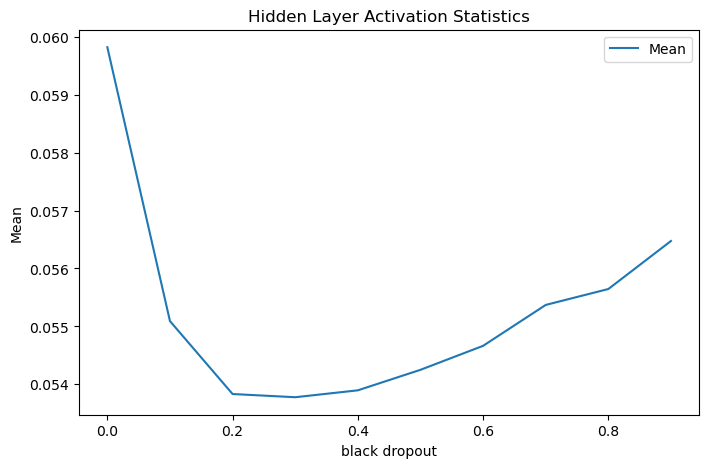

In [18]:
# Vary black dropout


sd_test = np.arange(0,1,.1)

for x in range(iterat):

    all_conf_array = []
    correct_conf_array = []
    acc_array = []

    conf_cat_all_array = np.empty((10,0))
    conf_cat_correct_array = np.empty((10,0))
    freq_all = np.empty((10,0))

    activation_mean = []

    for i in range(len(sd_test)):
        images_testing_noise = generate_pixel_dropout(images_testing,sd_test[i],1)
        images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
        labels_testing_predicted = model_feedforward[x].predict(images_testing_noise_flat)

        all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
        acc = compute_accuracy(labels_testing,labels_testing_predicted)

        all_conf_array.append(all_conf)
        correct_conf_array.append(correct_conf)   
        acc_array.append(acc)

        freq = compute_frequencies(labels_testing_predicted)

        freq_all = np.hstack((freq_all,freq))

        conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)



        conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
        conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))


        hidden_activation = model_feedforward_intermed[x].predict(images_testing_noise_flat)

        activation_mean.append(np.mean(hidden_activation))

    
    if x==0:
        all_conf_array_iter = np.array(all_conf_array)/iterat
        correct_conf_array_iter = np.array(correct_conf_array)/iterat
        acc_array_iter = np.array(acc_array)/iterat      
        activation_mean_iter = np.array(activation_mean)/iterat
    else:
        all_conf_array_iter = np.array(all_conf_array)/iterat + all_conf_array_iter
        correct_conf_array_iter = np.array(correct_conf_array)/iterat + correct_conf_array_iter        
        acc_array_iter = np.array(acc_array)/iterat + acc_array_iter         
        activation_mean_iter = np.array(activation_mean)/iterat + activation_mean_iter           
        
all_conf_array = all_conf_array_iter
correct_conf_array = correct_conf_array_iter 
acc_array = acc_array_iter 
activation_mean = activation_mean_iter    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("black dropout")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("black dropout")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("black dropout")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("black dropout")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("black dropout")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

# Experiment 1c: Tiny Feedforward Network with First Layer normalization

In [80]:
#Train standard feedforward model

model_feedforward = []
model_feedforward_intermed = []

iterat = 5

for x in range(iterat):

    images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

    inputs = Input(shape=(784))

    layer = LayerNormalization()(inputs)

    layer = Dense(10,activation='relu')(layer)


    outputs = Dense(10,activation='softmax')(layer)


    model = Model(inputs=inputs,outputs=outputs)

    model_intermed = Model(inputs=inputs,outputs=layer)

    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
    es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
    model.fit(images_training_flat,labels_training,batch_size=100,verbose = 0, epochs=500,validation_split=0.33,callbacks=[es])

    
    model_feedforward_intermed.append(model_intermed)
    model_feedforward.append(model)

Epoch 00028: early stopping
Epoch 00034: early stopping
Epoch 00022: early stopping
Epoch 00030: early stopping
Epoch 00026: early stopping


<Figure size 640x480 with 0 Axes>

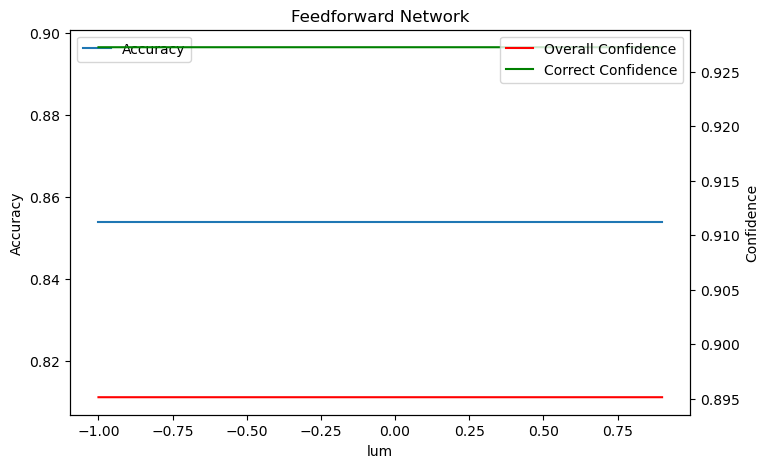

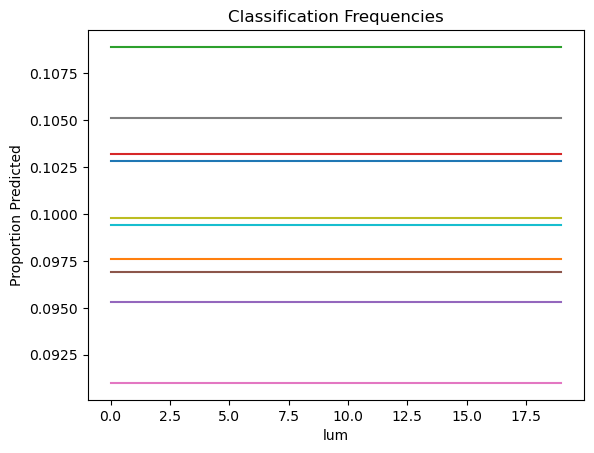

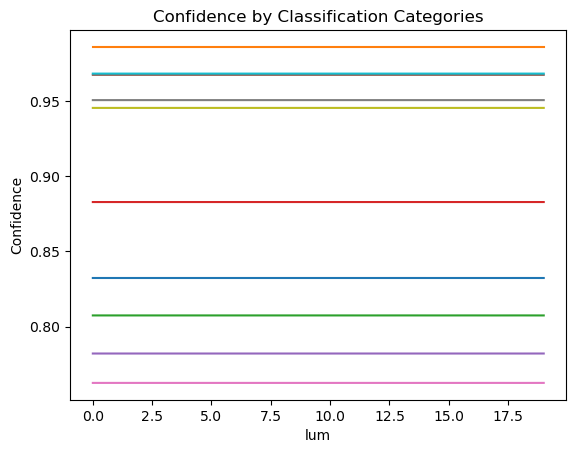

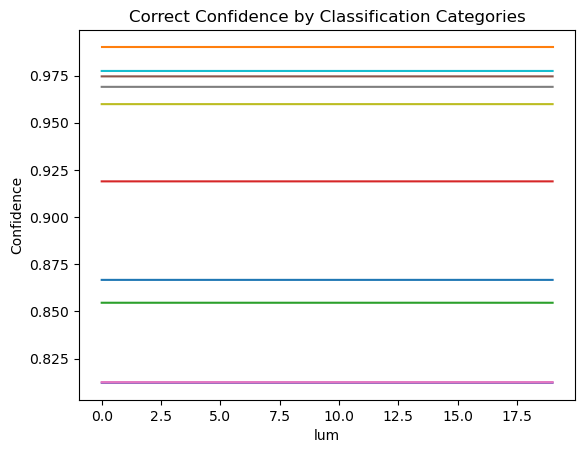

<Figure size 640x480 with 0 Axes>

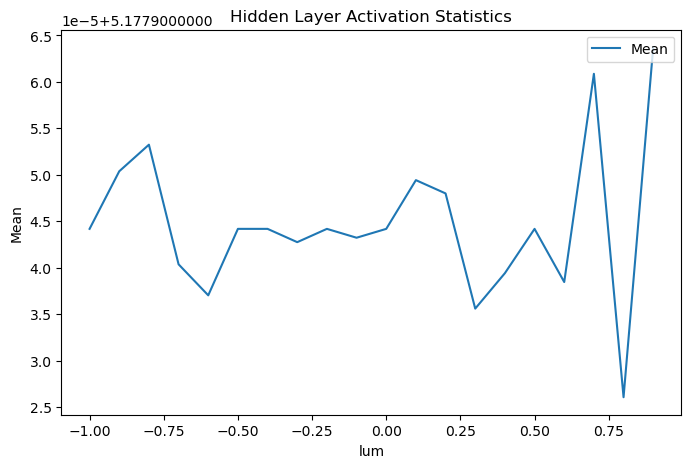

In [81]:
# Vary lum


sd_test = np.arange(-1,1,.1)



for x in range(iterat):

    all_conf_array = []
    correct_conf_array = []
    acc_array = []

    conf_cat_all_array = np.empty((10,0))
    conf_cat_correct_array = np.empty((10,0))
    freq_all = np.empty((10,0))

    activation_mean = []




    for i in range(len(sd_test)):
        images_testing_noise = generate_lum(images_testing,sd_test[i])
        images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
        labels_testing_predicted = model_feedforward[x].predict(images_testing_noise_flat)

        all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
        acc = compute_accuracy(labels_testing,labels_testing_predicted)

        all_conf_array.append(all_conf)
        correct_conf_array.append(correct_conf)   
        acc_array.append(acc)

        freq = compute_frequencies(labels_testing_predicted)

        freq_all = np.hstack((freq_all,freq))

        conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)



        conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
        conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))


        hidden_activation = model_feedforward_intermed[x].predict(images_testing_noise_flat)

        activation_mean.append(np.mean(hidden_activation))
        
     

    
    if x==0:
        all_conf_array_iter = np.array(all_conf_array)/iterat
        correct_conf_array_iter = np.array(correct_conf_array)/iterat
        acc_array_iter = np.array(acc_array)/iterat      
        activation_mean_iter = np.array(activation_mean)/iterat
    else:
        all_conf_array_iter = np.array(all_conf_array)/iterat + all_conf_array_iter
        correct_conf_array_iter = np.array(correct_conf_array)/iterat + correct_conf_array_iter        
        acc_array_iter = np.array(acc_array)/iterat + acc_array_iter         
        activation_mean_iter = np.array(activation_mean)/iterat + activation_mean_iter           
        
all_conf_array = all_conf_array_iter
correct_conf_array = correct_conf_array_iter 
acc_array = acc_array_iter 
activation_mean = activation_mean_iter

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("lum")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("lum")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("lum")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("lum")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("lum")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<ipython-input-3-2497c16af76f>:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-3-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

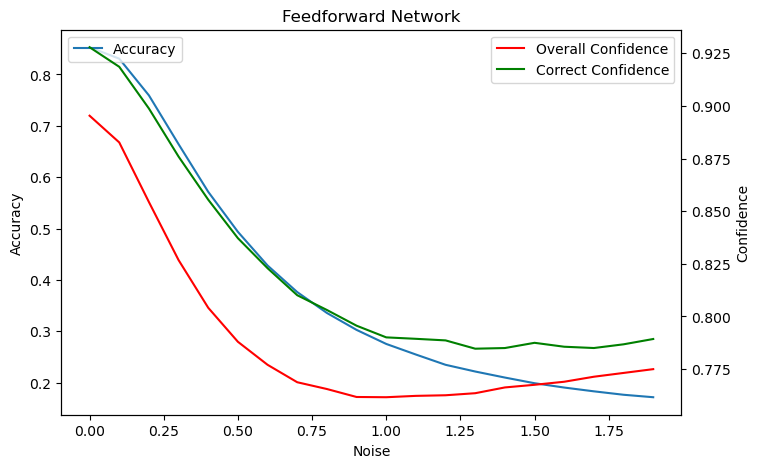

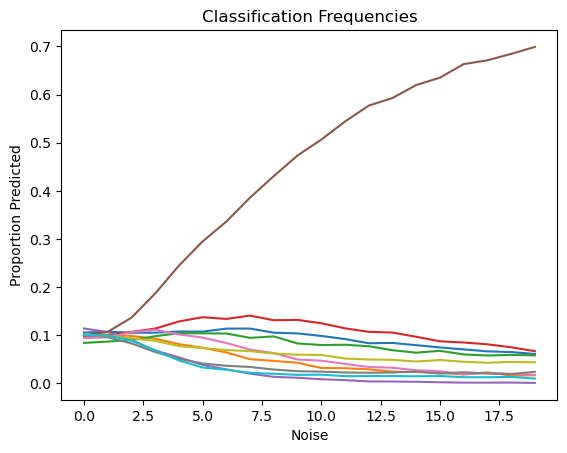

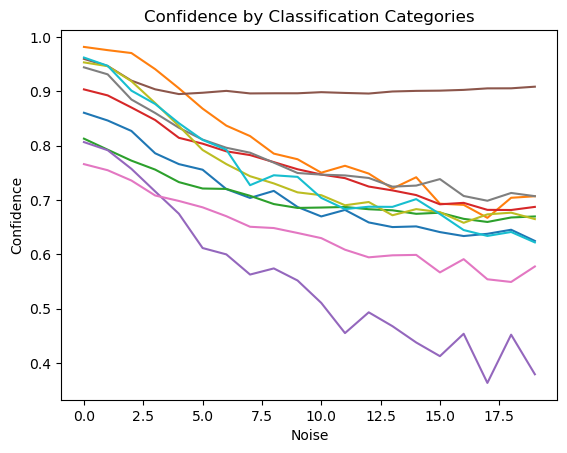

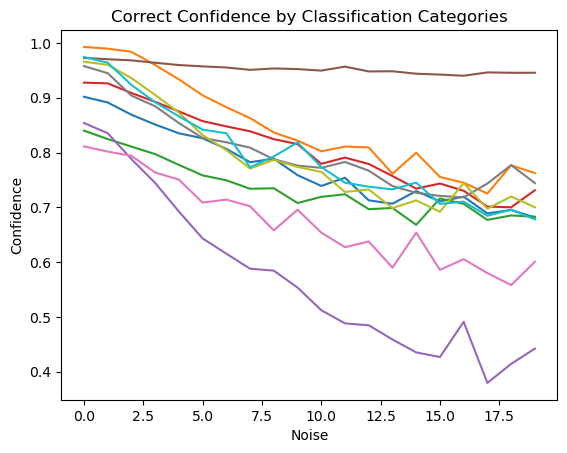

<Figure size 640x480 with 0 Axes>

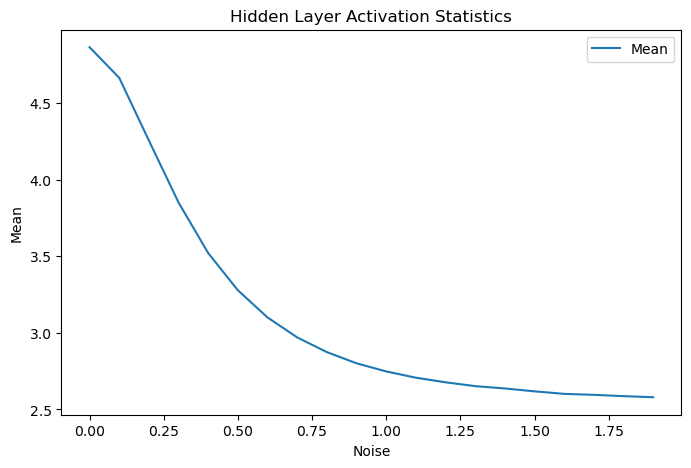

In [20]:
# Vary noise


sd_test = np.arange(0,2,.1)



for x in range(iterat):

    all_conf_array = []
    correct_conf_array = []
    acc_array = []

    conf_cat_all_array = np.empty((10,0))
    conf_cat_correct_array = np.empty((10,0))
    freq_all = np.empty((10,0))

    activation_mean = []




    for i in range(len(sd_test)):
        images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
        images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
        labels_testing_predicted = model_feedforward[x].predict(images_testing_noise_flat)

        all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
        acc = compute_accuracy(labels_testing,labels_testing_predicted)

        all_conf_array.append(all_conf)
        correct_conf_array.append(correct_conf)   
        acc_array.append(acc)

        freq = compute_frequencies(labels_testing_predicted)

        freq_all = np.hstack((freq_all,freq))

        conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)



        conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
        conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))


        hidden_activation = model_feedforward_intermed[x].predict(images_testing_noise_flat)

        activation_mean.append(np.mean(hidden_activation))
        
     

    
    if x==0:
        all_conf_array_iter = np.array(all_conf_array)/iterat
        correct_conf_array_iter = np.array(correct_conf_array)/iterat
        acc_array_iter = np.array(acc_array)/iterat      
        activation_mean_iter = np.array(activation_mean)/iterat
    else:
        all_conf_array_iter = np.array(all_conf_array)/iterat + all_conf_array_iter
        correct_conf_array_iter = np.array(correct_conf_array)/iterat + correct_conf_array_iter        
        acc_array_iter = np.array(acc_array)/iterat + acc_array_iter         
        activation_mean_iter = np.array(activation_mean)/iterat + activation_mean_iter           
        
all_conf_array = all_conf_array_iter
correct_conf_array = correct_conf_array_iter 
acc_array = acc_array_iter 
activation_mean = activation_mean_iter

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Noise")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<Figure size 640x480 with 0 Axes>

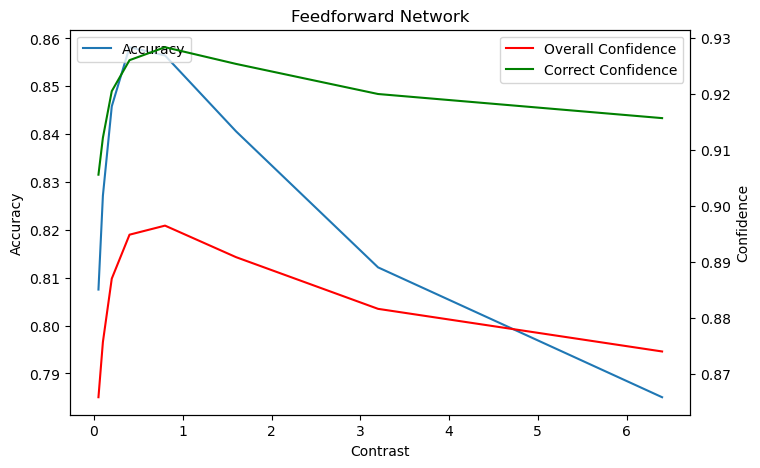

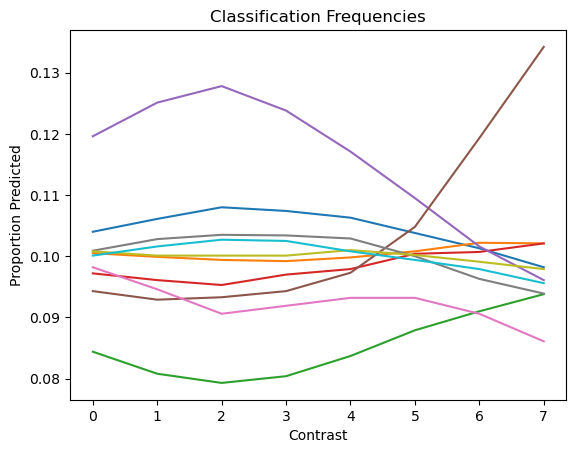

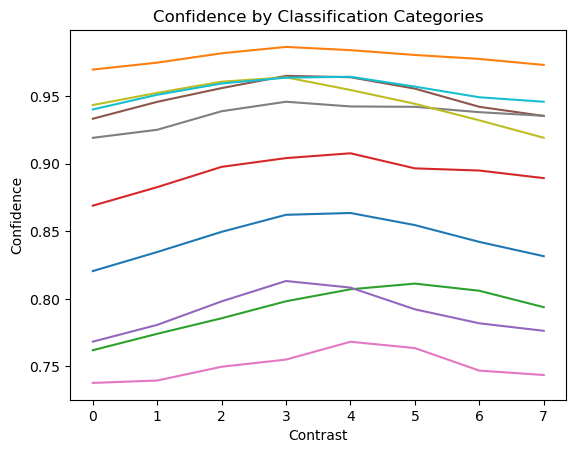

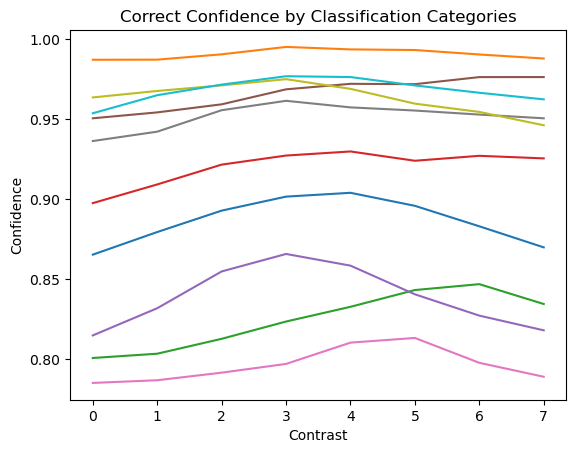

<Figure size 640x480 with 0 Axes>

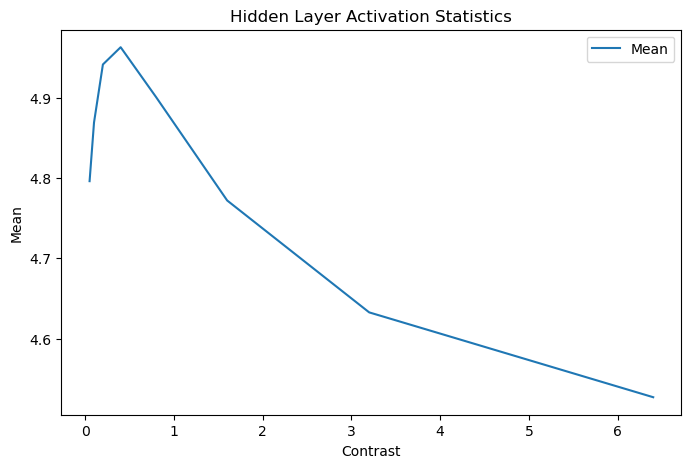

In [21]:
# Vary contrast


cn_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

for x in range(iterat):


    all_conf_array = []
    correct_conf_array = []
    acc_array = []

    conf_cat_all_array = np.empty((10,0))
    conf_cat_correct_array = np.empty((10,0))
    freq_all = np.empty((10,0))

    activation_mean = []

    for i in range(len(cn_test)):
        images_testing_noise = generate_contrast(images_testing,cn_test[i])
        images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
        labels_testing_predicted = model_feedforward[x].predict(images_testing_noise_flat)

        all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
        acc = compute_accuracy(labels_testing,labels_testing_predicted)

        all_conf_array.append(all_conf)
        correct_conf_array.append(correct_conf)   
        acc_array.append(acc)

        freq = compute_frequencies(labels_testing_predicted)

        freq_all = np.hstack((freq_all,freq))

        conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)



        conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
        conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))


        hidden_activation = model_feedforward_intermed[x].predict(images_testing_noise_flat)

        activation_mean.append(np.mean(hidden_activation))


    if x==0:
        all_conf_array_iter = np.array(all_conf_array)/iterat
        correct_conf_array_iter = np.array(correct_conf_array)/iterat
        acc_array_iter = np.array(acc_array)/iterat      
        activation_mean_iter = np.array(activation_mean)/iterat
    else:
        all_conf_array_iter = np.array(all_conf_array)/iterat + all_conf_array_iter
        correct_conf_array_iter = np.array(correct_conf_array)/iterat + correct_conf_array_iter        
        acc_array_iter = np.array(acc_array)/iterat + acc_array_iter         
        activation_mean_iter = np.array(activation_mean)/iterat + activation_mean_iter           
        
all_conf_array = all_conf_array_iter
correct_conf_array = correct_conf_array_iter 
acc_array = acc_array_iter 
activation_mean = activation_mean_iter    
    
   
    
plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Contrast")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cn_test,acc_array, label = "Accuracy")
conf_ax.plot(cn_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cn_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Contrast")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(cn_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<Figure size 640x480 with 0 Axes>

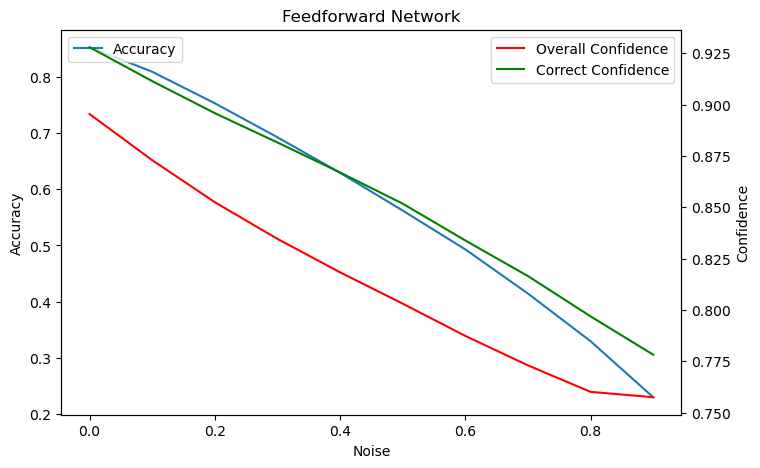

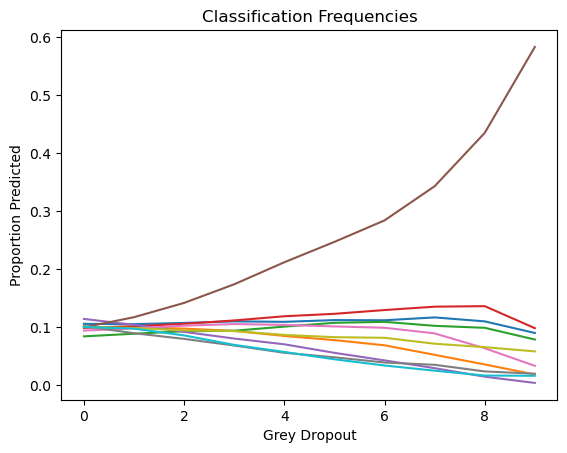

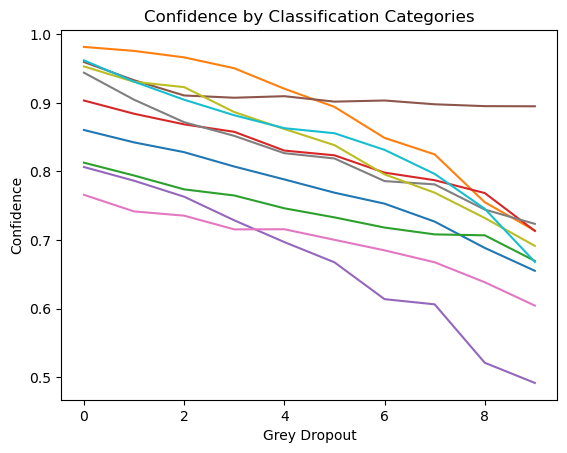

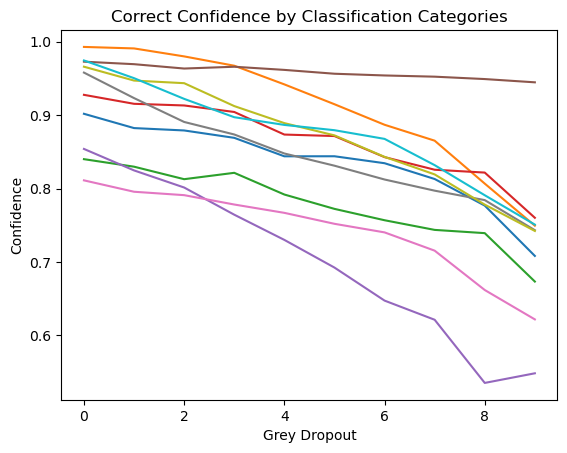

<Figure size 640x480 with 0 Axes>

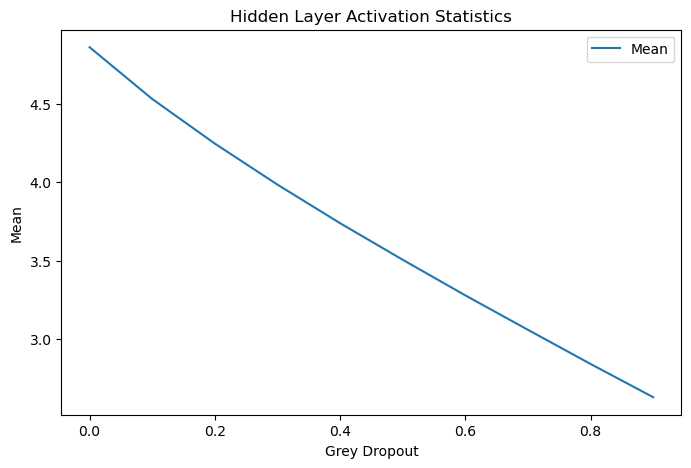

In [22]:
# Vary grey dropout


sd_test = np.arange(0,1,.1)

for x in range(iterat):

    all_conf_array = []
    correct_conf_array = []
    acc_array = []

    conf_cat_all_array = np.empty((10,0))
    conf_cat_correct_array = np.empty((10,0))
    freq_all = np.empty((10,0))

    activation_mean = []

    for i in range(len(sd_test)):
        images_testing_noise = generate_pixel_dropout(images_testing,sd_test[i],0.5)
        images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
        labels_testing_predicted = model_feedforward[x].predict(images_testing_noise_flat)

        all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
        acc = compute_accuracy(labels_testing,labels_testing_predicted)

        all_conf_array.append(all_conf)
        correct_conf_array.append(correct_conf)   
        acc_array.append(acc)

        freq = compute_frequencies(labels_testing_predicted)

        freq_all = np.hstack((freq_all,freq))

        conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)



        conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
        conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))


        hidden_activation = model_feedforward_intermed[x].predict(images_testing_noise_flat)

        activation_mean.append(np.mean(hidden_activation))

    
    
    if x==0:
        all_conf_array_iter = np.array(all_conf_array)/iterat
        correct_conf_array_iter = np.array(correct_conf_array)/iterat
        acc_array_iter = np.array(acc_array)/iterat      
        activation_mean_iter = np.array(activation_mean)/iterat
    else:
        all_conf_array_iter = np.array(all_conf_array)/iterat + all_conf_array_iter
        correct_conf_array_iter = np.array(correct_conf_array)/iterat + correct_conf_array_iter        
        acc_array_iter = np.array(acc_array)/iterat + acc_array_iter         
        activation_mean_iter = np.array(activation_mean)/iterat + activation_mean_iter           
        
all_conf_array = all_conf_array_iter
correct_conf_array = correct_conf_array_iter 
acc_array = acc_array_iter 
activation_mean = activation_mean_iter    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Grey Dropout")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<Figure size 640x480 with 0 Axes>

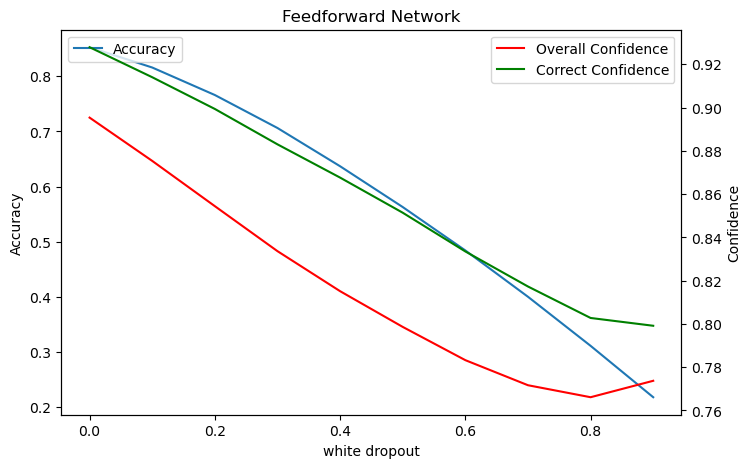

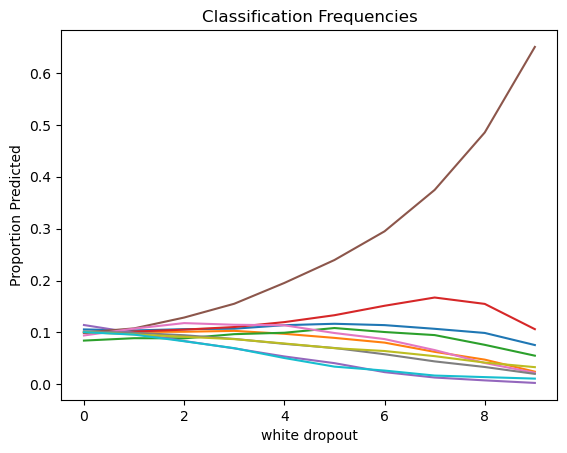

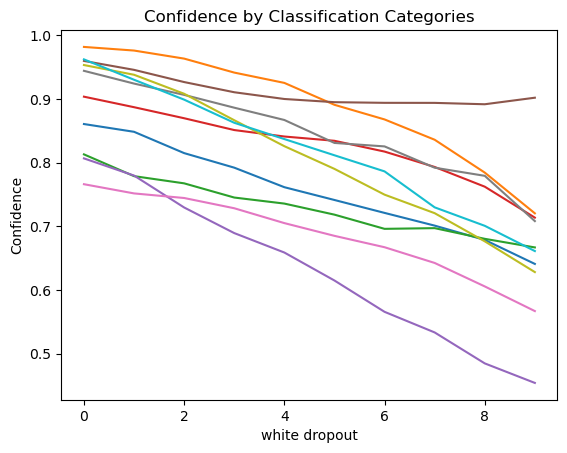

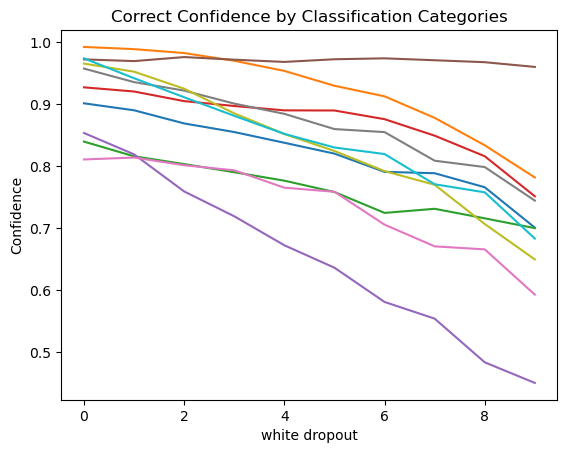

<Figure size 640x480 with 0 Axes>

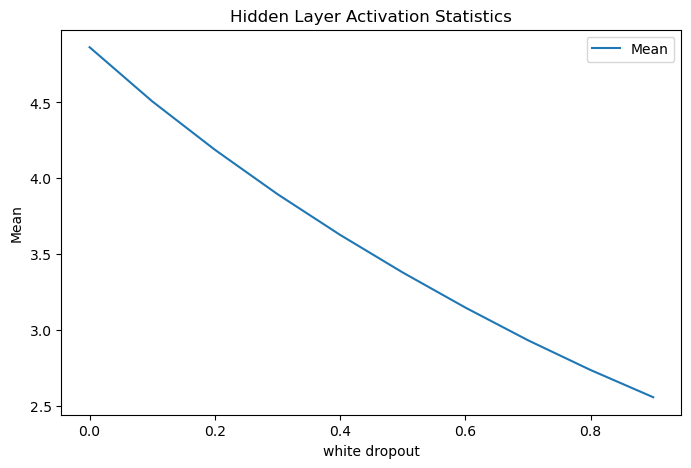

In [23]:
# Vary white dropout


sd_test = np.arange(0,1,.1)

for x in range(iterat):

    all_conf_array = []
    correct_conf_array = []
    acc_array = []

    conf_cat_all_array = np.empty((10,0))
    conf_cat_correct_array = np.empty((10,0))
    freq_all = np.empty((10,0))

    activation_mean = []

    for i in range(len(sd_test)):
        images_testing_noise = generate_pixel_dropout(images_testing,sd_test[i],0)
        images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
        labels_testing_predicted = model_feedforward[x].predict(images_testing_noise_flat)

        all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
        acc = compute_accuracy(labels_testing,labels_testing_predicted)

        all_conf_array.append(all_conf)
        correct_conf_array.append(correct_conf)   
        acc_array.append(acc)

        freq = compute_frequencies(labels_testing_predicted)

        freq_all = np.hstack((freq_all,freq))

        conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)



        conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
        conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))


        hidden_activation = model_feedforward_intermed[x].predict(images_testing_noise_flat)

        activation_mean.append(np.mean(hidden_activation))

    if x==0:
        all_conf_array_iter = np.array(all_conf_array)/iterat
        correct_conf_array_iter = np.array(correct_conf_array)/iterat
        acc_array_iter = np.array(acc_array)/iterat      
        activation_mean_iter = np.array(activation_mean)/iterat
    else:
        all_conf_array_iter = np.array(all_conf_array)/iterat + all_conf_array_iter
        correct_conf_array_iter = np.array(correct_conf_array)/iterat + correct_conf_array_iter        
        acc_array_iter = np.array(acc_array)/iterat + acc_array_iter         
        activation_mean_iter = np.array(activation_mean)/iterat + activation_mean_iter           
        
all_conf_array = all_conf_array_iter
correct_conf_array = correct_conf_array_iter 
acc_array = acc_array_iter 
activation_mean = activation_mean_iter    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("white dropout")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("white dropout")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("white dropout")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("white dropout")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("white dropout")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<Figure size 640x480 with 0 Axes>

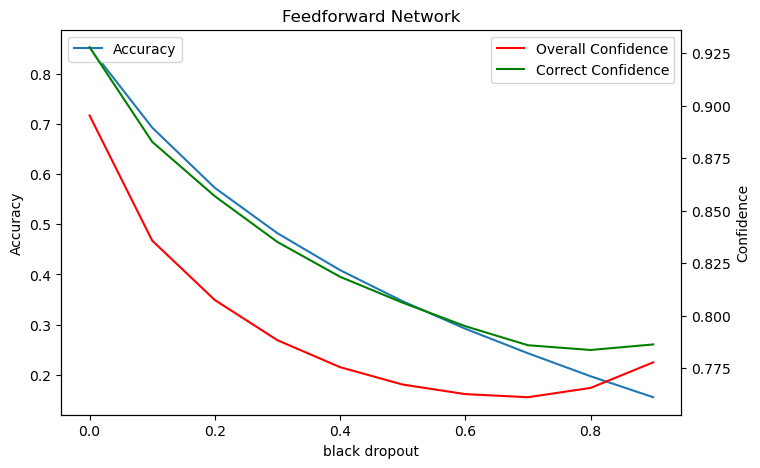

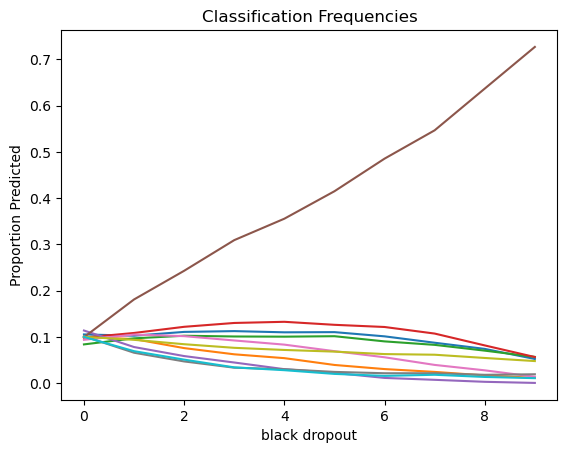

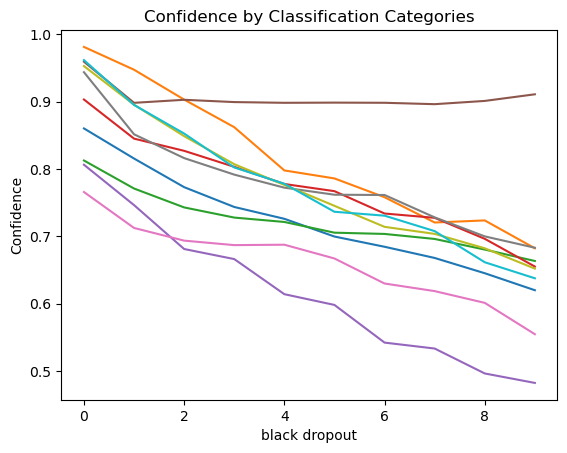

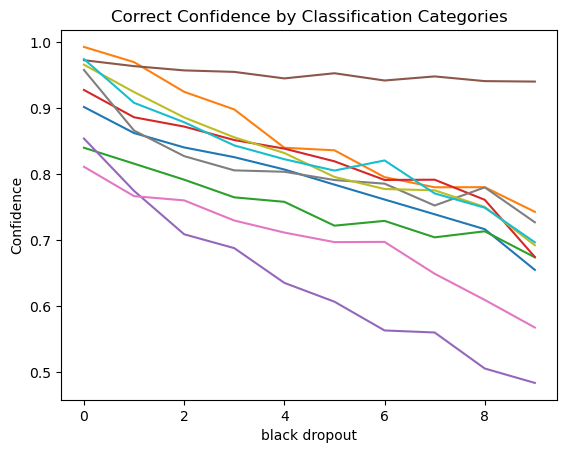

<Figure size 640x480 with 0 Axes>

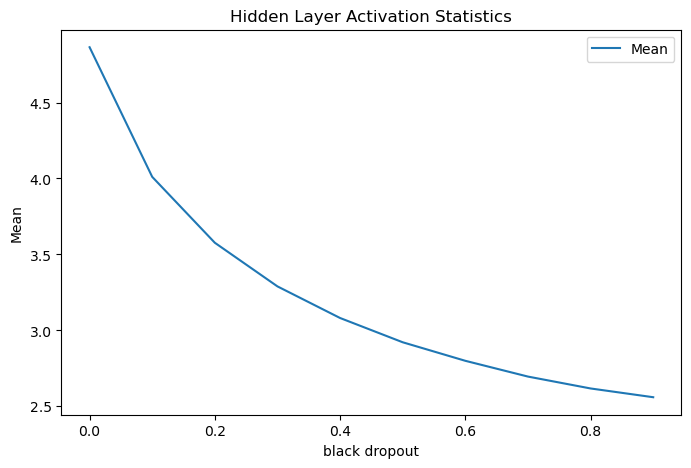

In [24]:
# Vary black dropout


sd_test = np.arange(0,1,.1)

for x in range(iterat):

    all_conf_array = []
    correct_conf_array = []
    acc_array = []

    conf_cat_all_array = np.empty((10,0))
    conf_cat_correct_array = np.empty((10,0))
    freq_all = np.empty((10,0))

    activation_mean = []

    for i in range(len(sd_test)):
        images_testing_noise = generate_pixel_dropout(images_testing,sd_test[i],1)
        images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
        labels_testing_predicted = model_feedforward[x].predict(images_testing_noise_flat)

        all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
        acc = compute_accuracy(labels_testing,labels_testing_predicted)

        all_conf_array.append(all_conf)
        correct_conf_array.append(correct_conf)   
        acc_array.append(acc)

        freq = compute_frequencies(labels_testing_predicted)

        freq_all = np.hstack((freq_all,freq))

        conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)



        conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
        conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))


        hidden_activation = model_feedforward_intermed[x].predict(images_testing_noise_flat)

        activation_mean.append(np.mean(hidden_activation))

    
    if x==0:
        all_conf_array_iter = np.array(all_conf_array)/iterat
        correct_conf_array_iter = np.array(correct_conf_array)/iterat
        acc_array_iter = np.array(acc_array)/iterat      
        activation_mean_iter = np.array(activation_mean)/iterat
    else:
        all_conf_array_iter = np.array(all_conf_array)/iterat + all_conf_array_iter
        correct_conf_array_iter = np.array(correct_conf_array)/iterat + correct_conf_array_iter        
        acc_array_iter = np.array(acc_array)/iterat + acc_array_iter         
        activation_mean_iter = np.array(activation_mean)/iterat + activation_mean_iter           
        
all_conf_array = all_conf_array_iter
correct_conf_array = correct_conf_array_iter 
acc_array = acc_array_iter 
activation_mean = activation_mean_iter    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("black dropout")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("black dropout")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("black dropout")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("black dropout")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("black dropout")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

# Experiment 1d: Tiny Feedforward Network with Dropout

In [86]:
#Train standard feedforward model

model_feedforward = []
model_feedforward_intermed = []

iterat = 2

for x in range(iterat):

    images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

    inputs = Input(shape=(784))

    drop = Dropout(0.3)(inputs)

    layer = Dense(10,activation='relu')(drop)


    outputs = Dense(10,activation='softmax')(layer)


    model = Model(inputs=inputs,outputs=outputs)

    model_intermed = Model(inputs=inputs,outputs=layer)

    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
    es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
    model.fit(images_training_flat,labels_training,batch_size=100,verbose = 0, epochs=500,validation_split=0.33,callbacks=[es])

    
    model_feedforward_intermed.append(model_intermed)
    model_feedforward.append(model)

Epoch 00091: early stopping
Epoch 00061: early stopping


<ipython-input-72-b1035d97e0b0>:106: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-72-b1035d97e0b0>:107: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

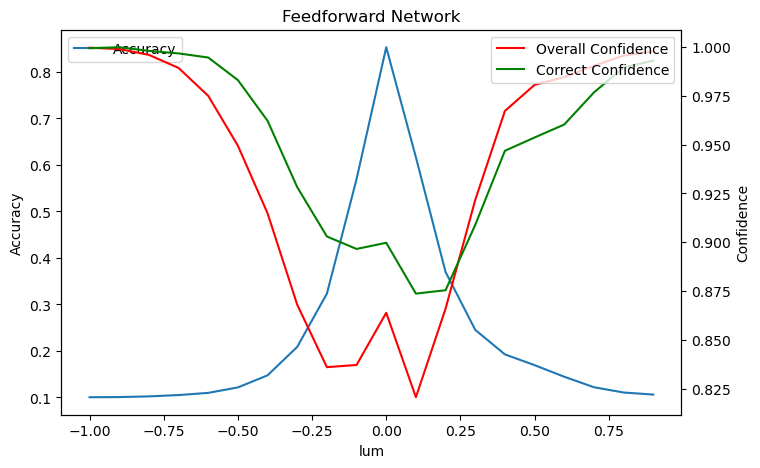

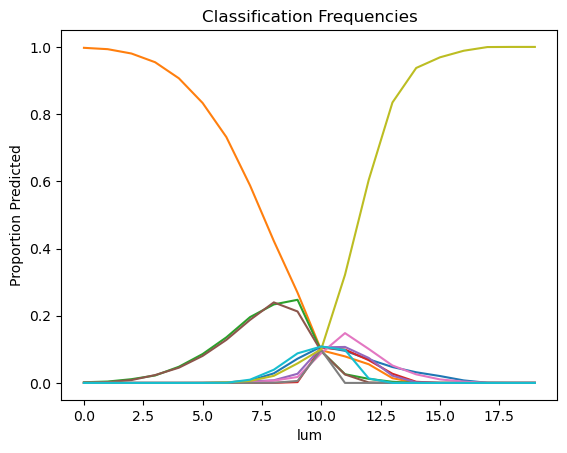

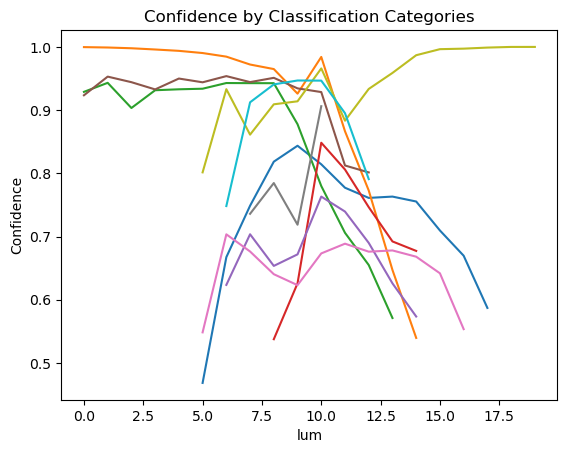

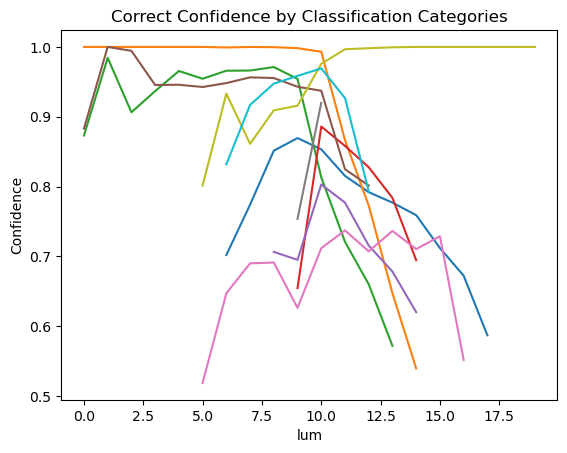

<Figure size 640x480 with 0 Axes>

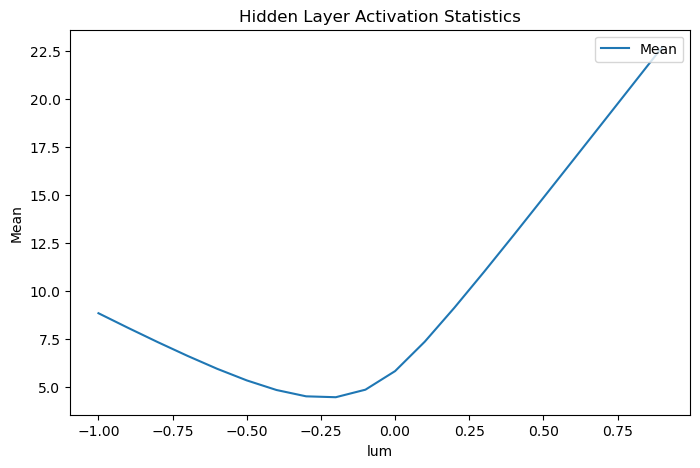

In [87]:
# Vary lum


sd_test = np.arange(-1,1,.1)



for x in range(iterat):

    all_conf_array = []
    correct_conf_array = []
    acc_array = []

    conf_cat_all_array = np.empty((10,0))
    conf_cat_correct_array = np.empty((10,0))
    freq_all = np.empty((10,0))

    activation_mean = []




    for i in range(len(sd_test)):
        images_testing_noise = generate_lum(images_testing,sd_test[i])
        images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
        labels_testing_predicted = model_feedforward[x].predict(images_testing_noise_flat)

        all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
        acc = compute_accuracy(labels_testing,labels_testing_predicted)

        all_conf_array.append(all_conf)
        correct_conf_array.append(correct_conf)   
        acc_array.append(acc)

        freq = compute_frequencies(labels_testing_predicted)

        freq_all = np.hstack((freq_all,freq))

        conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)



        conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
        conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))


        hidden_activation = model_feedforward_intermed[x].predict(images_testing_noise_flat)

        activation_mean.append(np.mean(hidden_activation))
        
     

    
    if x==0:
        all_conf_array_iter = np.array(all_conf_array)/iterat
        correct_conf_array_iter = np.array(correct_conf_array)/iterat
        acc_array_iter = np.array(acc_array)/iterat      
        activation_mean_iter = np.array(activation_mean)/iterat
    else:
        all_conf_array_iter = np.array(all_conf_array)/iterat + all_conf_array_iter
        correct_conf_array_iter = np.array(correct_conf_array)/iterat + correct_conf_array_iter        
        acc_array_iter = np.array(acc_array)/iterat + acc_array_iter         
        activation_mean_iter = np.array(activation_mean)/iterat + activation_mean_iter           
        
all_conf_array = all_conf_array_iter
correct_conf_array = correct_conf_array_iter 
acc_array = acc_array_iter 
activation_mean = activation_mean_iter

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("lum")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("lum")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("lum")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("lum")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("lum")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<Figure size 640x480 with 0 Axes>

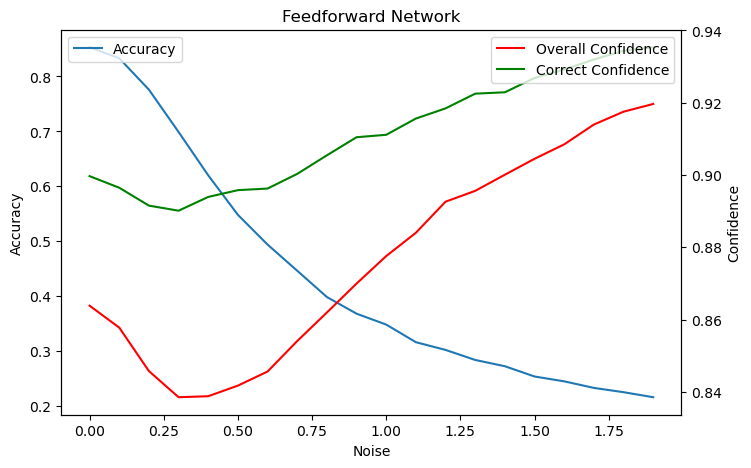

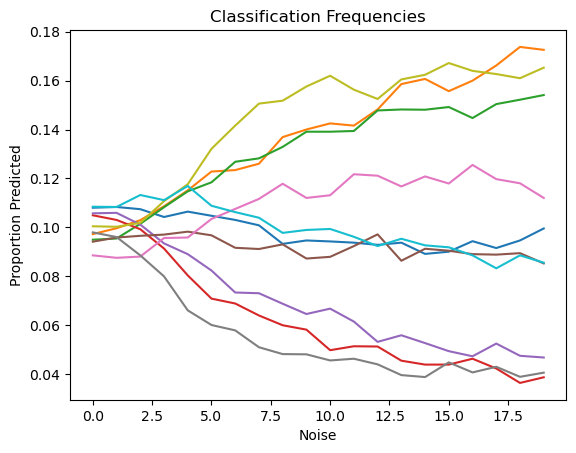

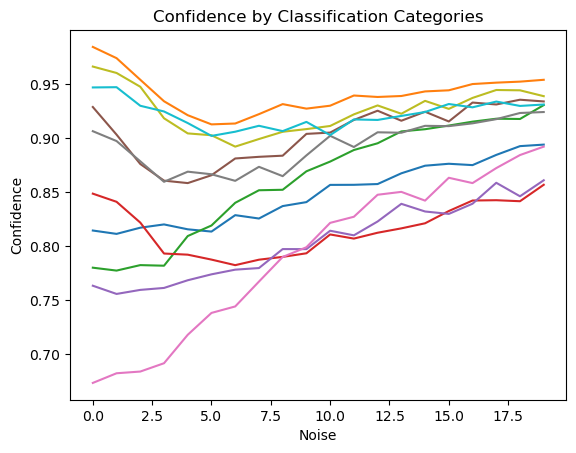

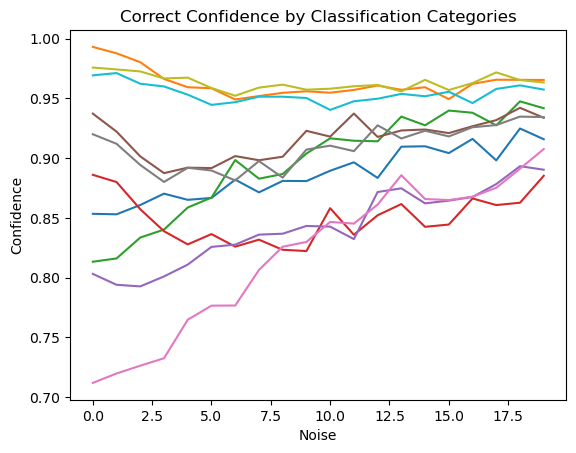

<Figure size 640x480 with 0 Axes>

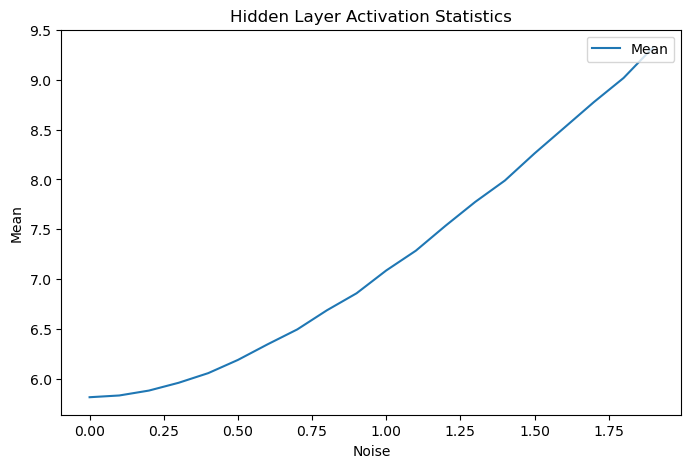

In [88]:
# Vary noise


sd_test = np.arange(0,2,.1)



for x in range(iterat):

    all_conf_array = []
    correct_conf_array = []
    acc_array = []

    conf_cat_all_array = np.empty((10,0))
    conf_cat_correct_array = np.empty((10,0))
    freq_all = np.empty((10,0))

    activation_mean = []




    for i in range(len(sd_test)):
        images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
        images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
        labels_testing_predicted = model_feedforward[x].predict(images_testing_noise_flat)

        all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
        acc = compute_accuracy(labels_testing,labels_testing_predicted)

        all_conf_array.append(all_conf)
        correct_conf_array.append(correct_conf)   
        acc_array.append(acc)

        freq = compute_frequencies(labels_testing_predicted)

        freq_all = np.hstack((freq_all,freq))

        conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)



        conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
        conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))


        hidden_activation = model_feedforward_intermed[x].predict(images_testing_noise_flat)

        activation_mean.append(np.mean(hidden_activation))
        
     

    
    if x==0:
        all_conf_array_iter = np.array(all_conf_array)/iterat
        correct_conf_array_iter = np.array(correct_conf_array)/iterat
        acc_array_iter = np.array(acc_array)/iterat      
        activation_mean_iter = np.array(activation_mean)/iterat
    else:
        all_conf_array_iter = np.array(all_conf_array)/iterat + all_conf_array_iter
        correct_conf_array_iter = np.array(correct_conf_array)/iterat + correct_conf_array_iter        
        acc_array_iter = np.array(acc_array)/iterat + acc_array_iter         
        activation_mean_iter = np.array(activation_mean)/iterat + activation_mean_iter           
        
all_conf_array = all_conf_array_iter
correct_conf_array = correct_conf_array_iter 
acc_array = acc_array_iter 
activation_mean = activation_mean_iter

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Noise")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<Figure size 640x480 with 0 Axes>

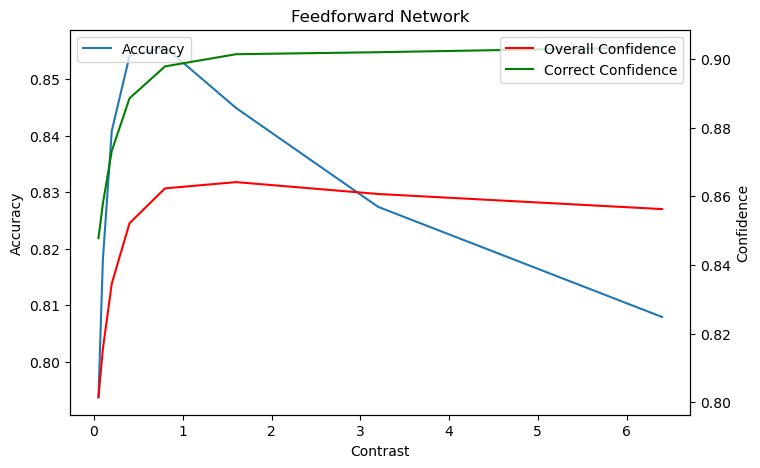

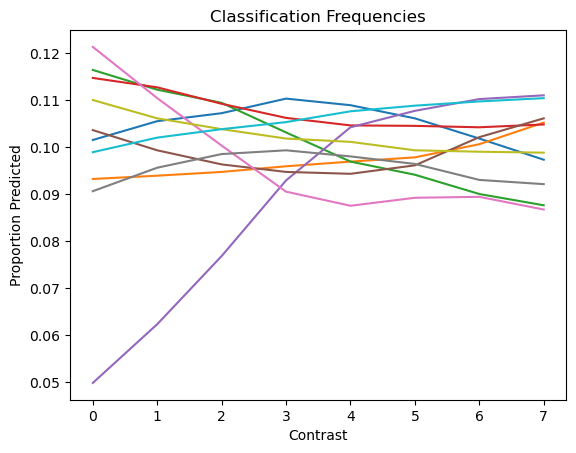

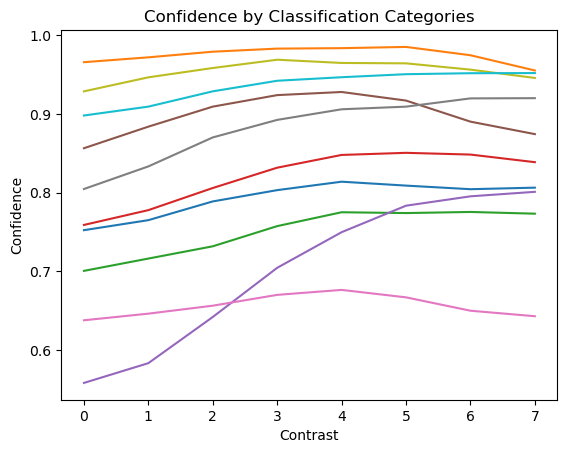

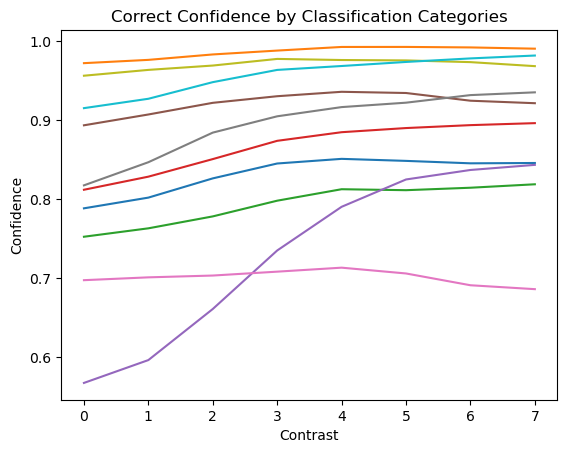

<Figure size 640x480 with 0 Axes>

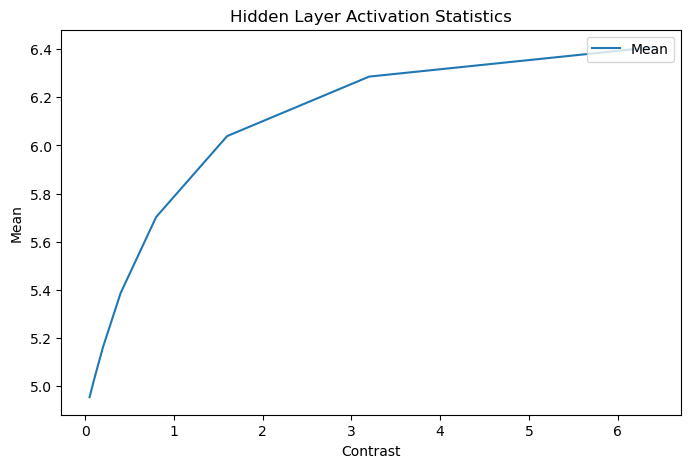

In [89]:
# Vary contrast


cn_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

for x in range(iterat):


    all_conf_array = []
    correct_conf_array = []
    acc_array = []

    conf_cat_all_array = np.empty((10,0))
    conf_cat_correct_array = np.empty((10,0))
    freq_all = np.empty((10,0))

    activation_mean = []

    for i in range(len(cn_test)):
        images_testing_noise = generate_contrast(images_testing,cn_test[i])
        images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
        labels_testing_predicted = model_feedforward[x].predict(images_testing_noise_flat)

        all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
        acc = compute_accuracy(labels_testing,labels_testing_predicted)

        all_conf_array.append(all_conf)
        correct_conf_array.append(correct_conf)   
        acc_array.append(acc)

        freq = compute_frequencies(labels_testing_predicted)

        freq_all = np.hstack((freq_all,freq))

        conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)



        conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
        conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))


        hidden_activation = model_feedforward_intermed[x].predict(images_testing_noise_flat)

        activation_mean.append(np.mean(hidden_activation))


    if x==0:
        all_conf_array_iter = np.array(all_conf_array)/iterat
        correct_conf_array_iter = np.array(correct_conf_array)/iterat
        acc_array_iter = np.array(acc_array)/iterat      
        activation_mean_iter = np.array(activation_mean)/iterat
    else:
        all_conf_array_iter = np.array(all_conf_array)/iterat + all_conf_array_iter
        correct_conf_array_iter = np.array(correct_conf_array)/iterat + correct_conf_array_iter        
        acc_array_iter = np.array(acc_array)/iterat + acc_array_iter         
        activation_mean_iter = np.array(activation_mean)/iterat + activation_mean_iter           
        
all_conf_array = all_conf_array_iter
correct_conf_array = correct_conf_array_iter 
acc_array = acc_array_iter 
activation_mean = activation_mean_iter    
    
   
    
plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Contrast")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cn_test,acc_array, label = "Accuracy")
conf_ax.plot(cn_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cn_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Contrast")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(cn_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<ipython-input-72-b1035d97e0b0>:107: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]
<ipython-input-72-b1035d97e0b0>:106: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]


<Figure size 640x480 with 0 Axes>

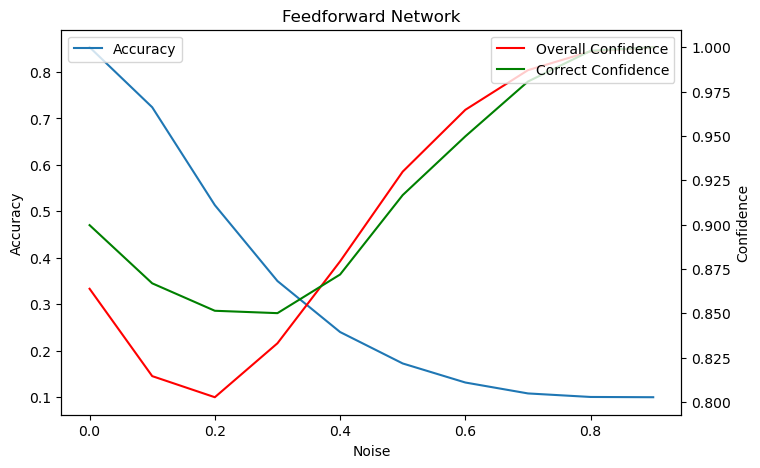

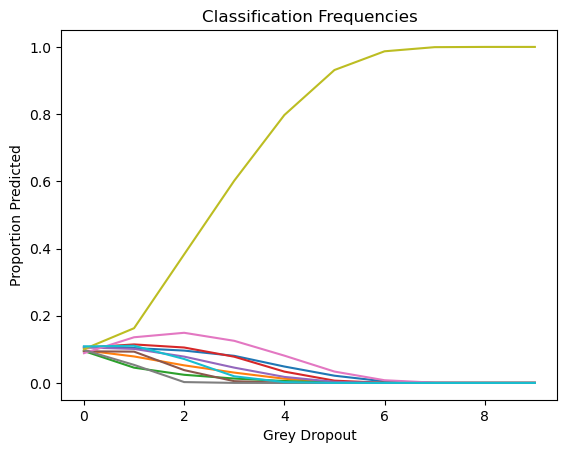

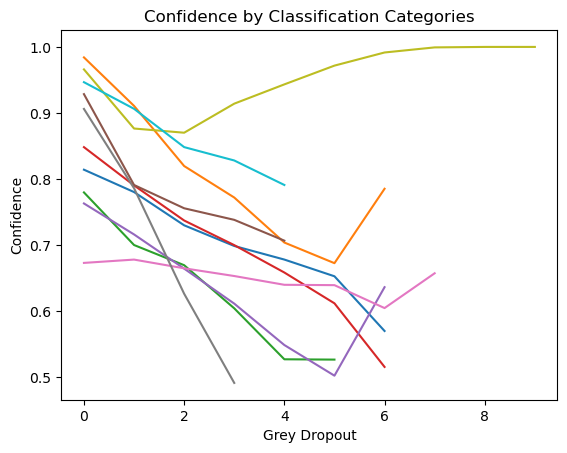

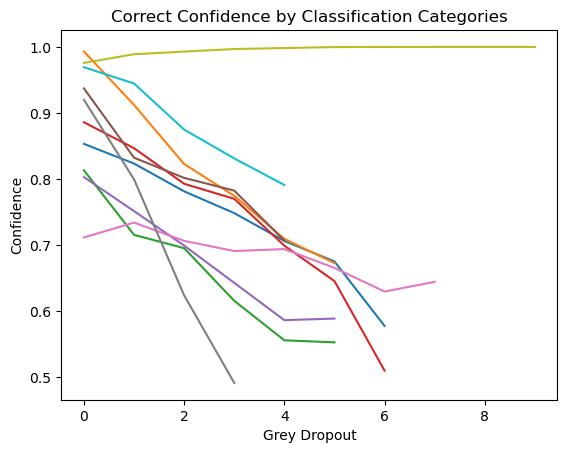

<Figure size 640x480 with 0 Axes>

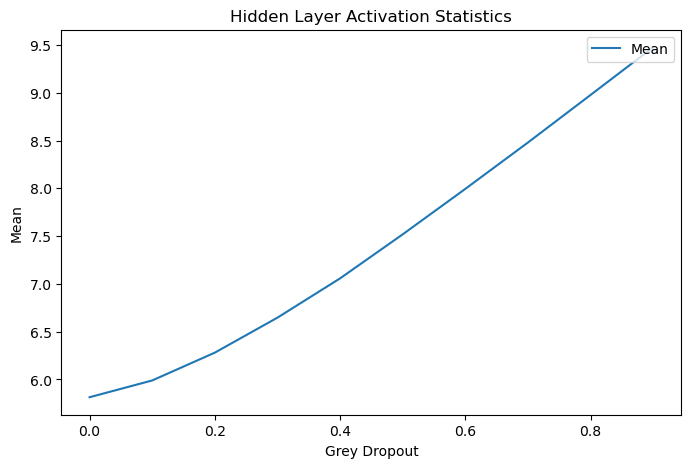

In [90]:
# Vary grey dropout


sd_test = np.arange(0,1,.1)

for x in range(iterat):

    all_conf_array = []
    correct_conf_array = []
    acc_array = []

    conf_cat_all_array = np.empty((10,0))
    conf_cat_correct_array = np.empty((10,0))
    freq_all = np.empty((10,0))

    activation_mean = []

    for i in range(len(sd_test)):
        images_testing_noise = generate_pixel_dropout(images_testing,sd_test[i],0.5)
        images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
        labels_testing_predicted = model_feedforward[x].predict(images_testing_noise_flat)

        all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
        acc = compute_accuracy(labels_testing,labels_testing_predicted)

        all_conf_array.append(all_conf)
        correct_conf_array.append(correct_conf)   
        acc_array.append(acc)

        freq = compute_frequencies(labels_testing_predicted)

        freq_all = np.hstack((freq_all,freq))

        conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)



        conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
        conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))


        hidden_activation = model_feedforward_intermed[x].predict(images_testing_noise_flat)

        activation_mean.append(np.mean(hidden_activation))

    
    
    if x==0:
        all_conf_array_iter = np.array(all_conf_array)/iterat
        correct_conf_array_iter = np.array(correct_conf_array)/iterat
        acc_array_iter = np.array(acc_array)/iterat      
        activation_mean_iter = np.array(activation_mean)/iterat
    else:
        all_conf_array_iter = np.array(all_conf_array)/iterat + all_conf_array_iter
        correct_conf_array_iter = np.array(correct_conf_array)/iterat + correct_conf_array_iter        
        acc_array_iter = np.array(acc_array)/iterat + acc_array_iter         
        activation_mean_iter = np.array(activation_mean)/iterat + activation_mean_iter           
        
all_conf_array = all_conf_array_iter
correct_conf_array = correct_conf_array_iter 
acc_array = acc_array_iter 
activation_mean = activation_mean_iter    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Grey Dropout")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<ipython-input-72-b1035d97e0b0>:106: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-72-b1035d97e0b0>:107: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

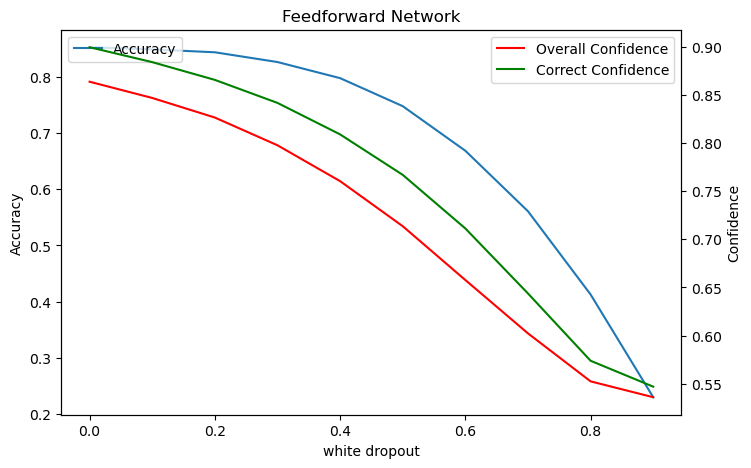

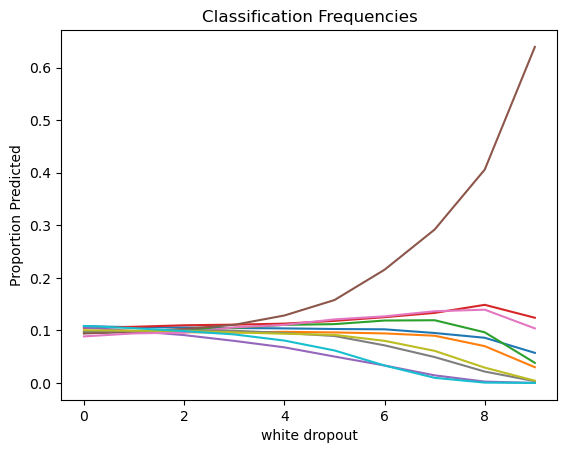

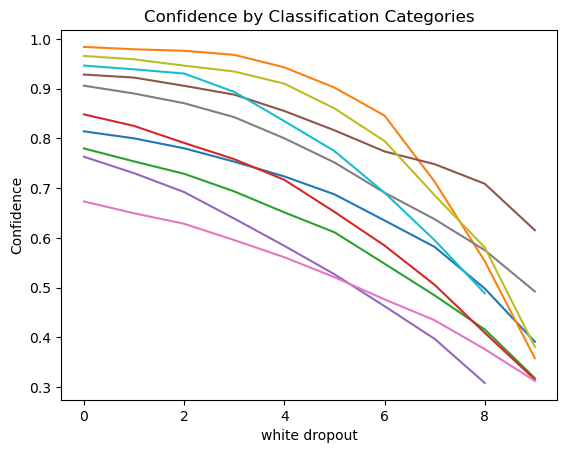

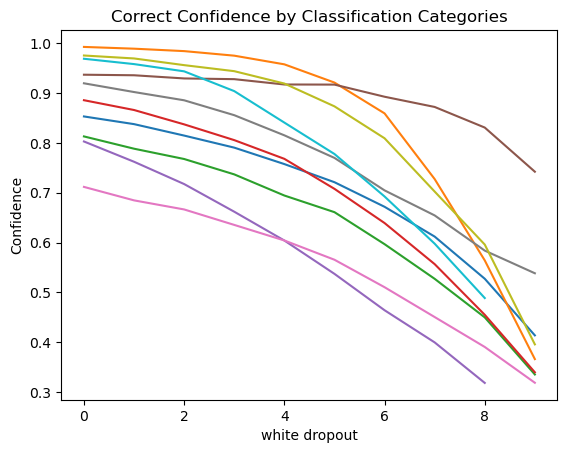

<Figure size 640x480 with 0 Axes>

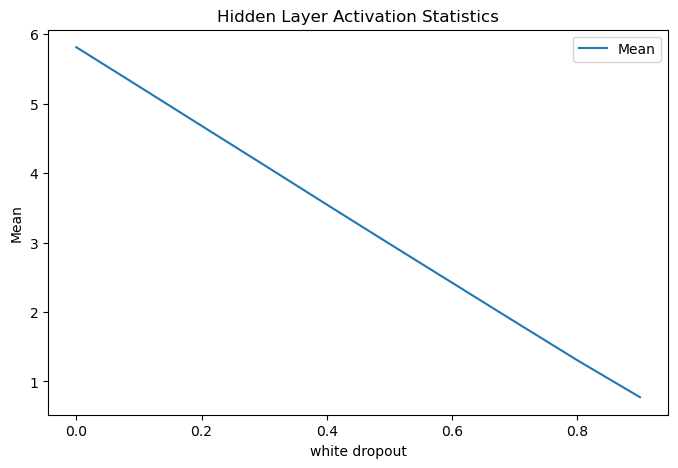

In [91]:
# Vary white dropout


sd_test = np.arange(0,1,.1)

for x in range(iterat):

    all_conf_array = []
    correct_conf_array = []
    acc_array = []

    conf_cat_all_array = np.empty((10,0))
    conf_cat_correct_array = np.empty((10,0))
    freq_all = np.empty((10,0))

    activation_mean = []

    for i in range(len(sd_test)):
        images_testing_noise = generate_pixel_dropout(images_testing,sd_test[i],0)
        images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
        labels_testing_predicted = model_feedforward[x].predict(images_testing_noise_flat)

        all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
        acc = compute_accuracy(labels_testing,labels_testing_predicted)

        all_conf_array.append(all_conf)
        correct_conf_array.append(correct_conf)   
        acc_array.append(acc)

        freq = compute_frequencies(labels_testing_predicted)

        freq_all = np.hstack((freq_all,freq))

        conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)



        conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
        conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))


        hidden_activation = model_feedforward_intermed[x].predict(images_testing_noise_flat)

        activation_mean.append(np.mean(hidden_activation))
    
    if x==0:
        all_conf_array_iter = np.array(all_conf_array)/iterat
        correct_conf_array_iter = np.array(correct_conf_array)/iterat
        acc_array_iter = np.array(acc_array)/iterat      
        activation_mean_iter = np.array(activation_mean)/iterat
    else:
        all_conf_array_iter = np.array(all_conf_array)/iterat + all_conf_array_iter
        correct_conf_array_iter = np.array(correct_conf_array)/iterat + correct_conf_array_iter        
        acc_array_iter = np.array(acc_array)/iterat + acc_array_iter         
        activation_mean_iter = np.array(activation_mean)/iterat + activation_mean_iter           
        
all_conf_array = all_conf_array_iter
correct_conf_array = correct_conf_array_iter 
acc_array = acc_array_iter 
activation_mean = activation_mean_iter    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("white dropout")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("white dropout")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("white dropout")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("white dropout")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("white dropout")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<ipython-input-72-b1035d97e0b0>:106: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-72-b1035d97e0b0>:107: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

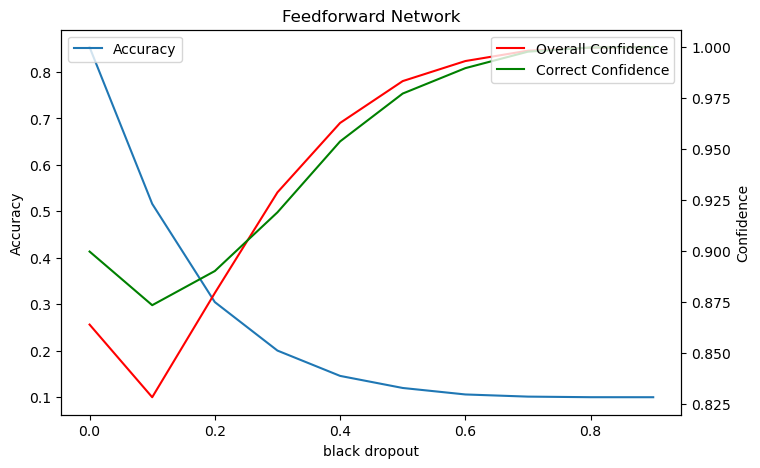

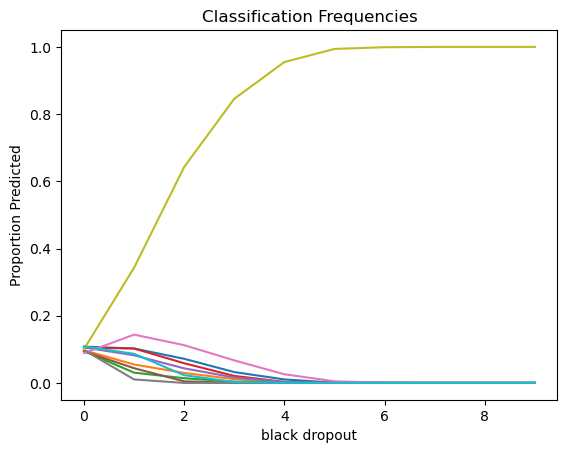

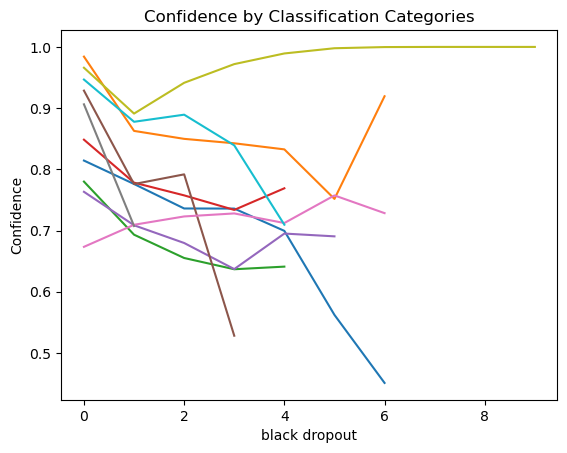

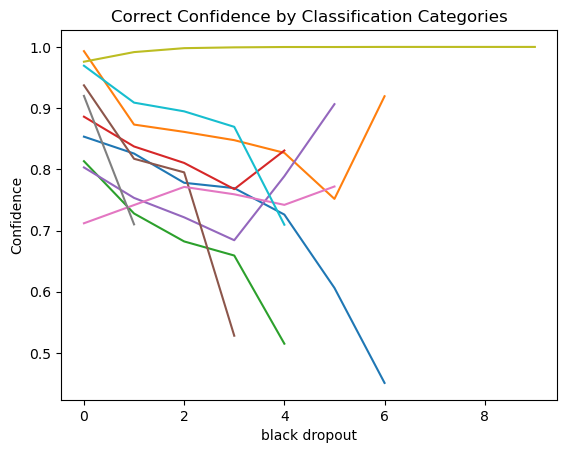

<Figure size 640x480 with 0 Axes>

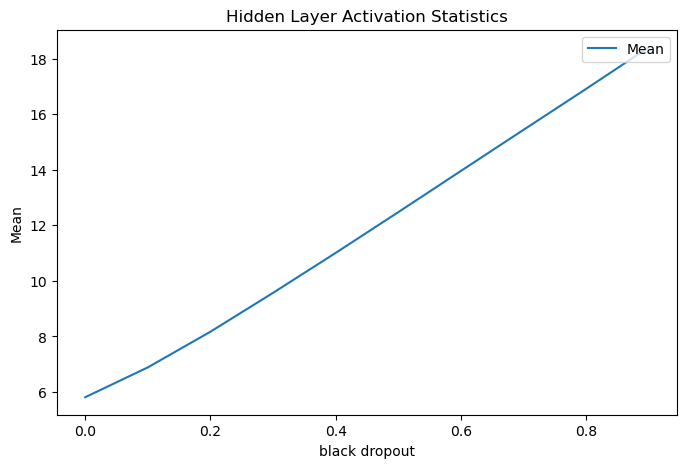

In [92]:
# Vary black dropout


sd_test = np.arange(0,1,.1)

for x in range(iterat):

    all_conf_array = []
    correct_conf_array = []
    acc_array = []

    conf_cat_all_array = np.empty((10,0))
    conf_cat_correct_array = np.empty((10,0))
    freq_all = np.empty((10,0))

    activation_mean = []

    for i in range(len(sd_test)):
        images_testing_noise = generate_pixel_dropout(images_testing,sd_test[i],1)
        images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
        labels_testing_predicted = model_feedforward[x].predict(images_testing_noise_flat)

        all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
        acc = compute_accuracy(labels_testing,labels_testing_predicted)

        all_conf_array.append(all_conf)
        correct_conf_array.append(correct_conf)   
        acc_array.append(acc)

        freq = compute_frequencies(labels_testing_predicted)

        freq_all = np.hstack((freq_all,freq))

        conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)



        conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
        conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))


        hidden_activation = model_feedforward_intermed[x].predict(images_testing_noise_flat)

        activation_mean.append(np.mean(hidden_activation))

    
    if x==0:
        all_conf_array_iter = np.array(all_conf_array)/iterat
        correct_conf_array_iter = np.array(correct_conf_array)/iterat
        acc_array_iter = np.array(acc_array)/iterat      
        activation_mean_iter = np.array(activation_mean)/iterat
    else:
        all_conf_array_iter = np.array(all_conf_array)/iterat + all_conf_array_iter
        correct_conf_array_iter = np.array(correct_conf_array)/iterat + correct_conf_array_iter        
        acc_array_iter = np.array(acc_array)/iterat + acc_array_iter         
        activation_mean_iter = np.array(activation_mean)/iterat + activation_mean_iter           
        
all_conf_array = all_conf_array_iter
correct_conf_array = correct_conf_array_iter 
acc_array = acc_array_iter 
activation_mean = activation_mean_iter    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("black dropout")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("black dropout")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("black dropout")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("black dropout")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("black dropout")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

# Experiment 1e: Tiny Feedforward Network with High Dropout

In [5]:
#Train standard feedforward model

model_feedforward = []
model_feedforward_intermed = []

iterat = 2

for x in range(iterat):

    images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

    inputs = Input(shape=(784))

    drop = Dropout(0.8)(inputs)

    layer = Dense(10,activation='relu')(drop)


    outputs = Dense(10,activation='softmax')(layer)


    model = Model(inputs=inputs,outputs=outputs)

    model_intermed = Model(inputs=inputs,outputs=layer)

    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
    es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
    model.fit(images_training_flat,labels_training,batch_size=100,verbose = 0, epochs=500,validation_split=0.33,callbacks=[es])

    
    model_feedforward_intermed.append(model_intermed)
    model_feedforward.append(model)

Epoch 70: early stopping
Epoch 62: early stopping


313/313 [==============================] - 0s 542us/step


<Figure size 432x288 with 0 Axes>

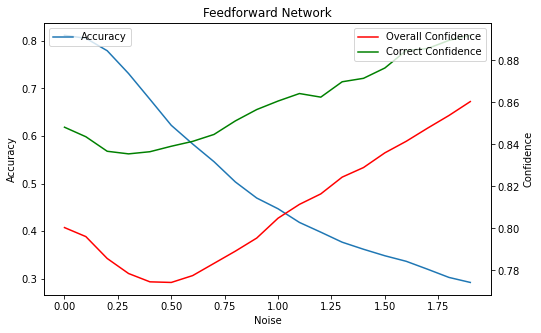

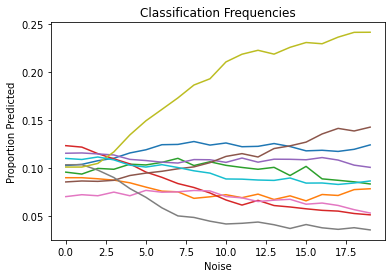

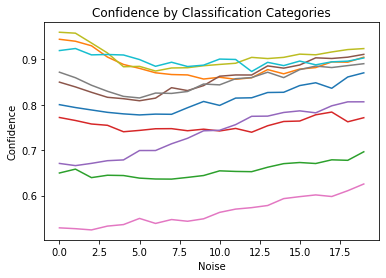

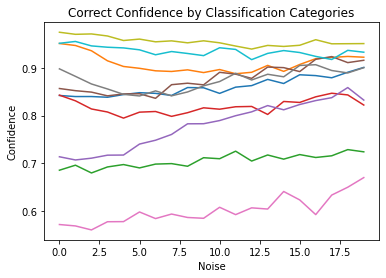

<Figure size 432x288 with 0 Axes>

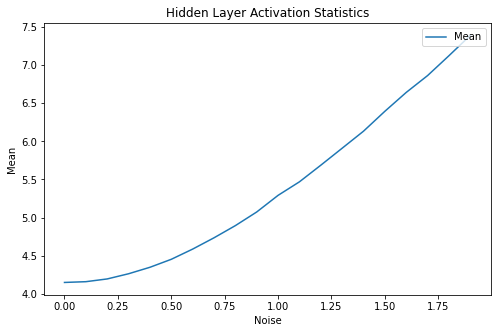

In [6]:
# Vary noise


sd_test = np.arange(0,2,.1)



for x in range(iterat):

    all_conf_array = []
    correct_conf_array = []
    acc_array = []

    conf_cat_all_array = np.empty((10,0))
    conf_cat_correct_array = np.empty((10,0))
    freq_all = np.empty((10,0))

    activation_mean = []




    for i in range(len(sd_test)):
        images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
        images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
        labels_testing_predicted = model_feedforward[x].predict(images_testing_noise_flat)

        all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
        acc = compute_accuracy(labels_testing,labels_testing_predicted)

        all_conf_array.append(all_conf)
        correct_conf_array.append(correct_conf)   
        acc_array.append(acc)

        freq = compute_frequencies(labels_testing_predicted)

        freq_all = np.hstack((freq_all,freq))

        conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)



        conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
        conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))


        hidden_activation = model_feedforward_intermed[x].predict(images_testing_noise_flat)

        activation_mean.append(np.mean(hidden_activation))
        
     

    
    if x==0:
        all_conf_array_iter = np.array(all_conf_array)/iterat
        correct_conf_array_iter = np.array(correct_conf_array)/iterat
        acc_array_iter = np.array(acc_array)/iterat      
        activation_mean_iter = np.array(activation_mean)/iterat
    else:
        all_conf_array_iter = np.array(all_conf_array)/iterat + all_conf_array_iter
        correct_conf_array_iter = np.array(correct_conf_array)/iterat + correct_conf_array_iter        
        acc_array_iter = np.array(acc_array)/iterat + acc_array_iter         
        activation_mean_iter = np.array(activation_mean)/iterat + activation_mean_iter           
        
all_conf_array = all_conf_array_iter
correct_conf_array = correct_conf_array_iter 
acc_array = acc_array_iter 
activation_mean = activation_mean_iter

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Noise")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

# Experiment 2a: Deep Feedforward Network

In [25]:
#Train deep feedforward model

images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

inputs = Input(shape=(784))
layer1 = Dense(10,activation='relu')(inputs)

layer2 = Dense(10,activation='relu')(layer1)
layer3 = Dense(10,activation='relu')(layer2)
layer4 = Dense(10,activation='relu')(layer3)

outputs = Dense(10,activation='softmax')(layer4)

model_deep = Model(inputs=inputs,outputs=outputs)

model_layer1 = Model(inputs=inputs,outputs=layer1)
model_layer2 = Model(inputs=inputs,outputs=layer2)
model_layer3 = Model(inputs=inputs,outputs=layer3)
model_layer4 = Model(inputs=inputs,outputs=layer4)

model_deep.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_deep.fit(images_training_flat,labels_training,batch_size=100,verbose=0,epochs=500,validation_split=0.33,callbacks=[es])


Epoch 00047: early stopping


<Figure size 640x480 with 0 Axes>

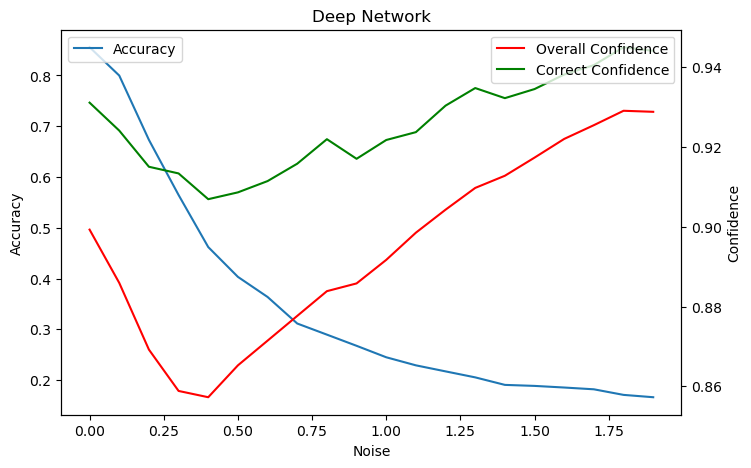

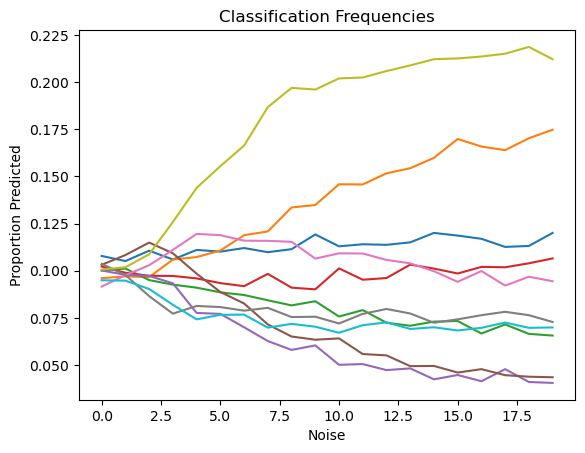

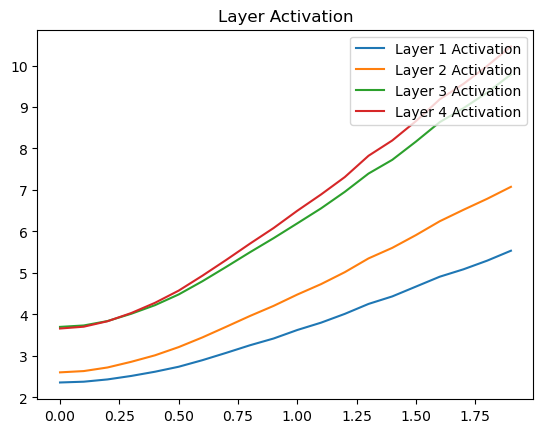

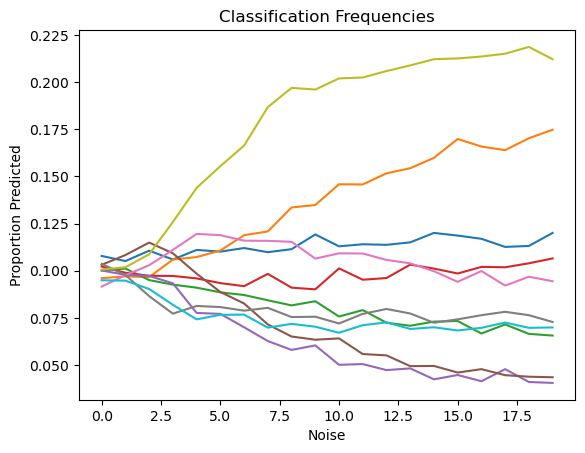

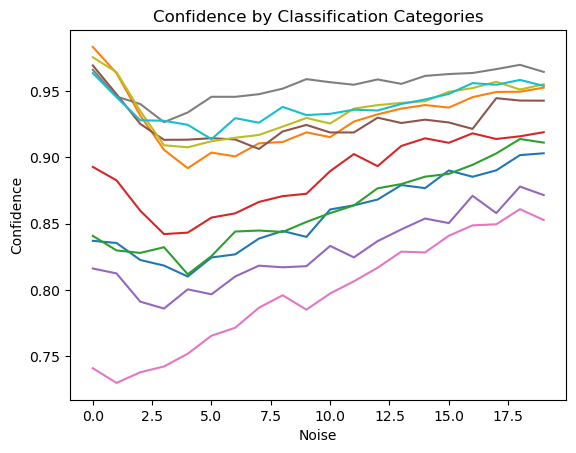

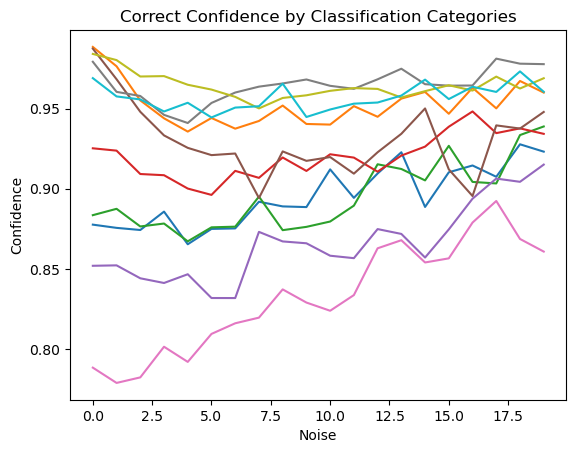

In [26]:
sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

layer1_activation = []
layer2_activation = []
layer3_activation = []
layer4_activation = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))



for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_deep.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    

    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    hidden_activation1 = model_layer1.predict(images_testing_noise_flat)
    hidden_activation2 = model_layer2.predict(images_testing_noise_flat)
    hidden_activation3 = model_layer3.predict(images_testing_noise_flat)
    hidden_activation4 = model_layer4.predict(images_testing_noise_flat)
    
    layer1_activation.append(np.mean(hidden_activation1))
    layer2_activation.append(np.mean(hidden_activation2))
    layer3_activation.append(np.mean(hidden_activation3))
    layer4_activation.append(np.mean(hidden_activation4))    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Deep Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

plt.figure(3)
plt.plot(sd_test,layer1_activation,label ="Layer 1 Activation")
plt.plot(sd_test,layer2_activation,label ="Layer 2 Activation")
plt.plot(sd_test,layer3_activation,label ="Layer 3 Activation")
plt.plot(sd_test,layer4_activation,label ="Layer 4 Activation")
plt.legend(loc= "upper right")
plt.title("Layer Activation")

plt.figure(4)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(6)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

<ipython-input-3-2497c16af76f>:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-3-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

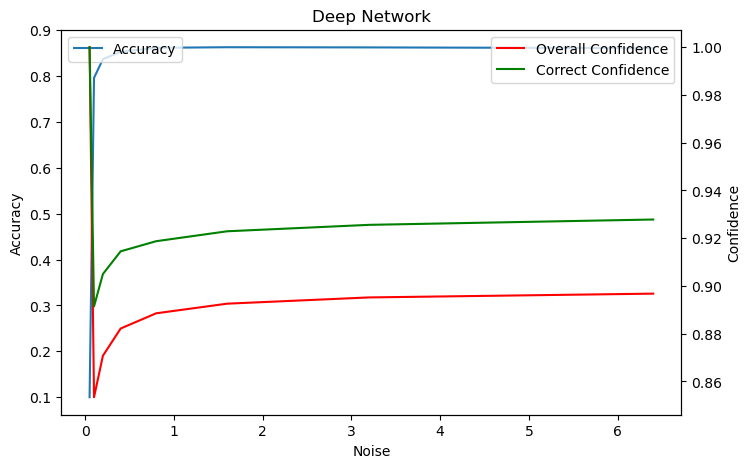

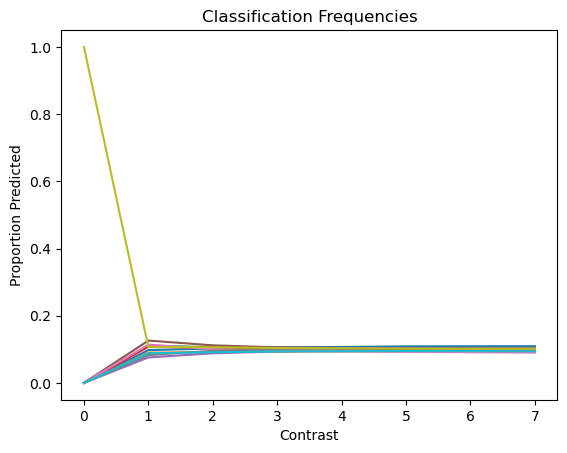

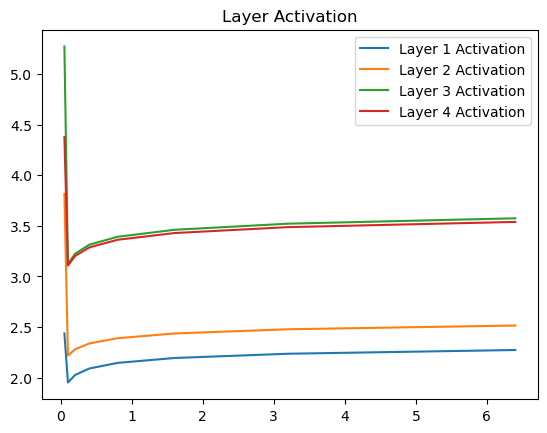

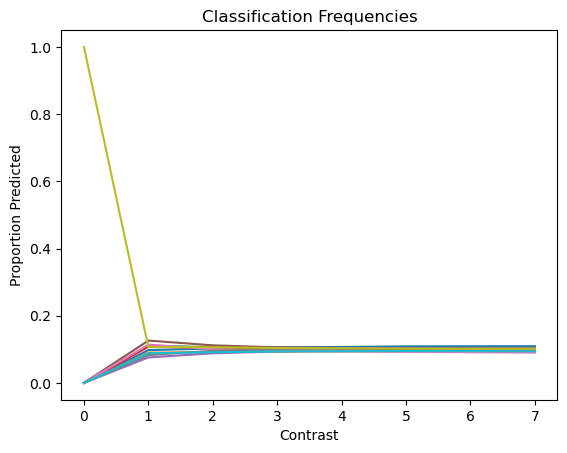

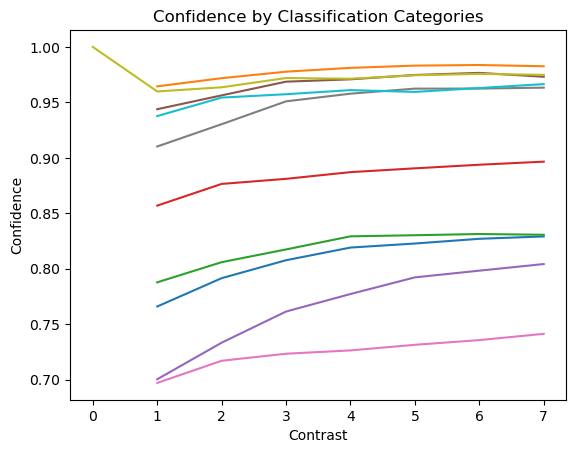

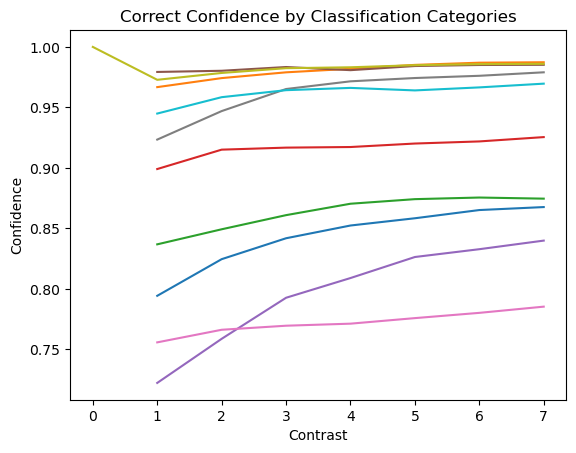

In [27]:
cd_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

layer1_activation = []
layer2_activation = []
layer3_activation = []
layer4_activation = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))



for i in range(len(cd_test)):
    images_testing_noise = generate_contrast(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_deep.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    

    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    hidden_activation1 = model_layer1.predict(images_testing_noise_flat)
    hidden_activation2 = model_layer2.predict(images_testing_noise_flat)
    hidden_activation3 = model_layer3.predict(images_testing_noise_flat)
    hidden_activation4 = model_layer4.predict(images_testing_noise_flat)
    
    layer1_activation.append(np.mean(hidden_activation1))
    layer2_activation.append(np.mean(hidden_activation2))
    layer3_activation.append(np.mean(hidden_activation3))
    layer4_activation.append(np.mean(hidden_activation4))    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cd_test,acc_array, label = "Accuracy")
conf_ax.plot(cd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Deep Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

plt.figure(3)
plt.plot(cd_test,layer1_activation,label ="Layer 1 Activation")
plt.plot(cd_test,layer2_activation,label ="Layer 2 Activation")
plt.plot(cd_test,layer3_activation,label ="Layer 3 Activation")
plt.plot(cd_test,layer4_activation,label ="Layer 4 Activation")
plt.legend(loc= "upper right")
plt.title("Layer Activation")

plt.figure(4)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(6)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

# Experiment 2b: Deep Feedforward Network- normalize 1st layer

In [28]:
#Train deep feedforward model

images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

inputs = Input(shape=(784))


layer1 = Dense(10,activation='relu')(inputs)

layer1 = LayerNormalization()(layer1)

layer2 = Dense(10,activation='relu')(layer1)
layer3 = Dense(10,activation='relu')(layer2)
layer4 = Dense(10,activation='relu')(layer3)

outputs = Dense(10,activation='softmax')(layer4)

model_deep = Model(inputs=inputs,outputs=outputs)

model_layer1 = Model(inputs=inputs,outputs=layer1)
model_layer2 = Model(inputs=inputs,outputs=layer2)
model_layer3 = Model(inputs=inputs,outputs=layer3)
model_layer4 = Model(inputs=inputs,outputs=layer4)

model_deep.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_deep.fit(images_training_flat,labels_training,batch_size=100,verbose=0,epochs=500,validation_split=0.33,callbacks=[es])


Epoch 00036: early stopping


<Figure size 640x480 with 0 Axes>

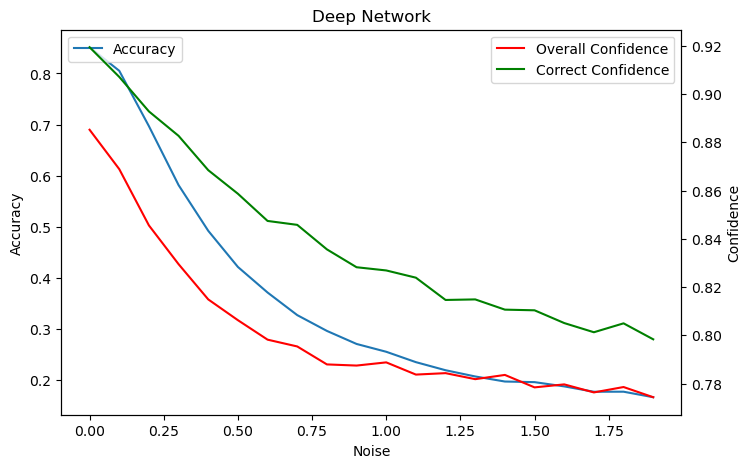

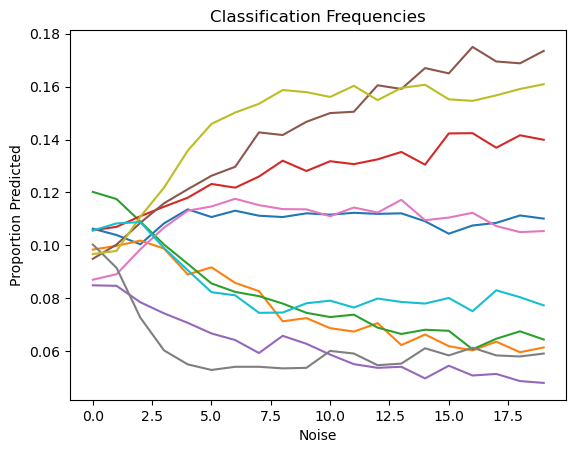

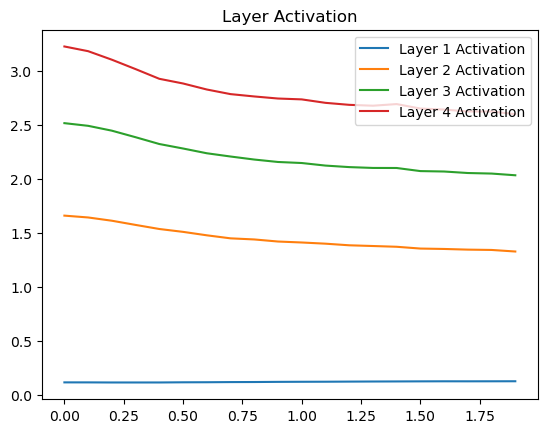

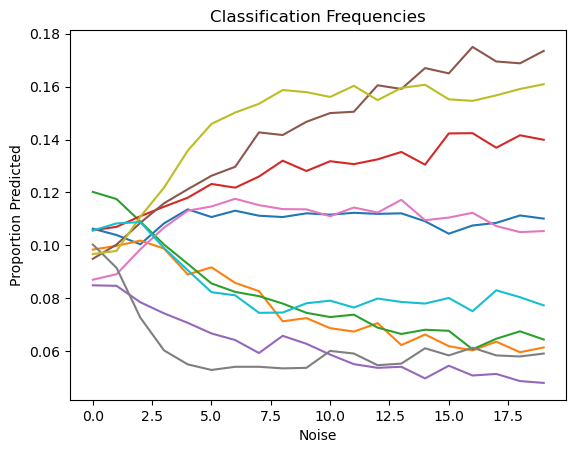

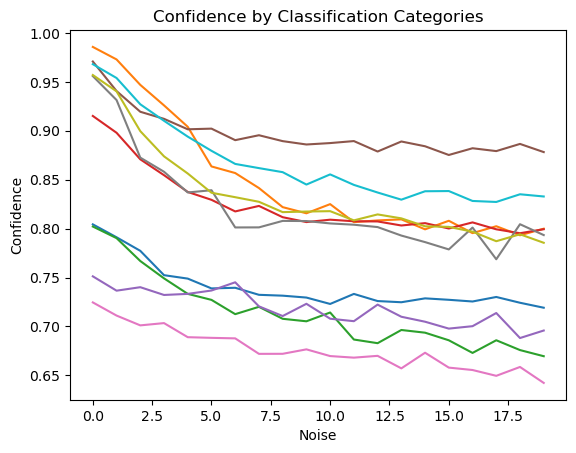

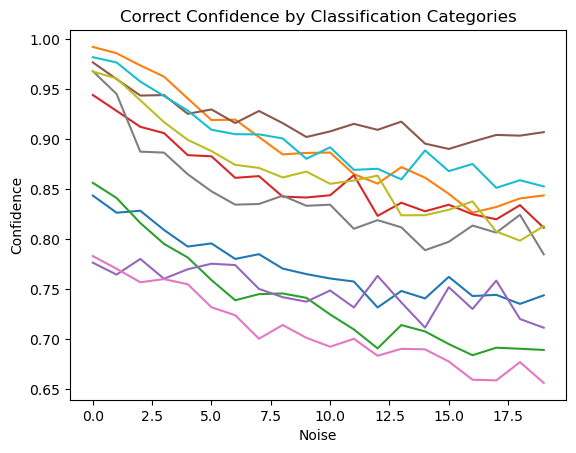

In [29]:
sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

layer1_activation = []
layer2_activation = []
layer3_activation = []
layer4_activation = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))



for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_deep.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    

    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    hidden_activation1 = model_layer1.predict(images_testing_noise_flat)
    hidden_activation2 = model_layer2.predict(images_testing_noise_flat)
    hidden_activation3 = model_layer3.predict(images_testing_noise_flat)
    hidden_activation4 = model_layer4.predict(images_testing_noise_flat)
    
    layer1_activation.append(np.mean(hidden_activation1))
    layer2_activation.append(np.mean(hidden_activation2))
    layer3_activation.append(np.mean(hidden_activation3))
    layer4_activation.append(np.mean(hidden_activation4))    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Deep Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

plt.figure(3)
plt.plot(sd_test,layer1_activation,label ="Layer 1 Activation")
plt.plot(sd_test,layer2_activation,label ="Layer 2 Activation")
plt.plot(sd_test,layer3_activation,label ="Layer 3 Activation")
plt.plot(sd_test,layer4_activation,label ="Layer 4 Activation")
plt.legend(loc= "upper right")
plt.title("Layer Activation")

plt.figure(4)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(6)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

<ipython-input-3-2497c16af76f>:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-3-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

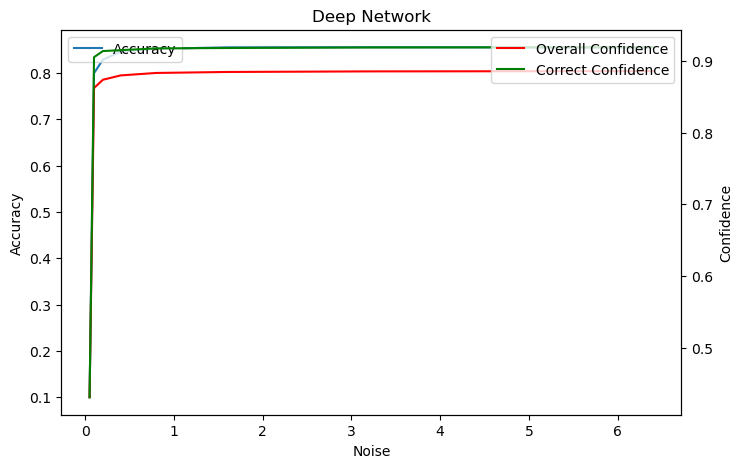

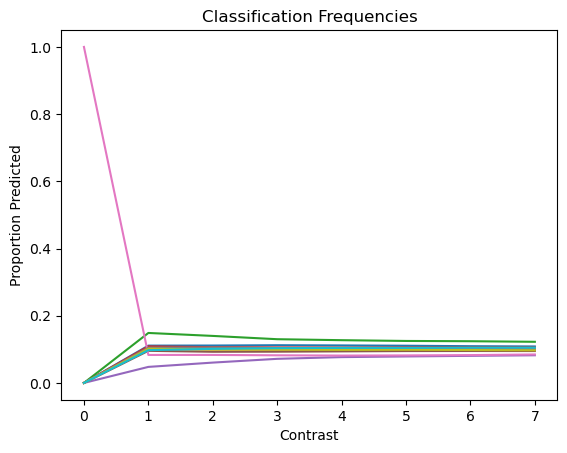

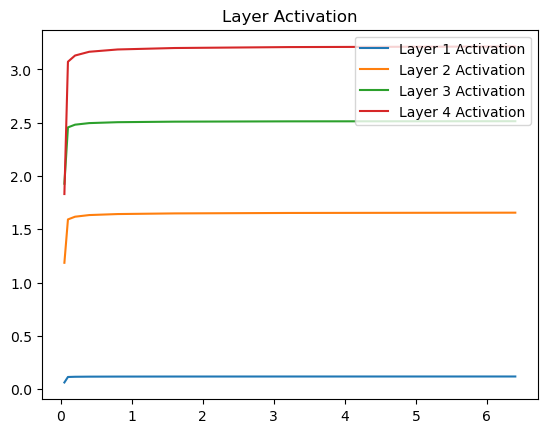

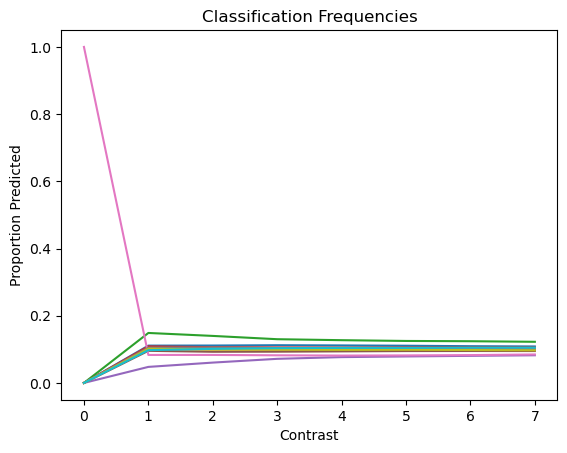

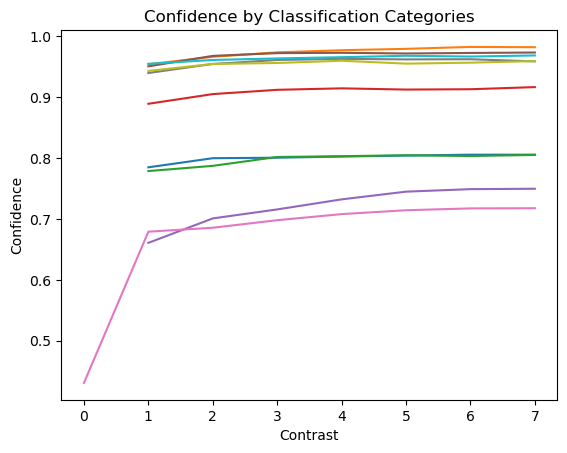

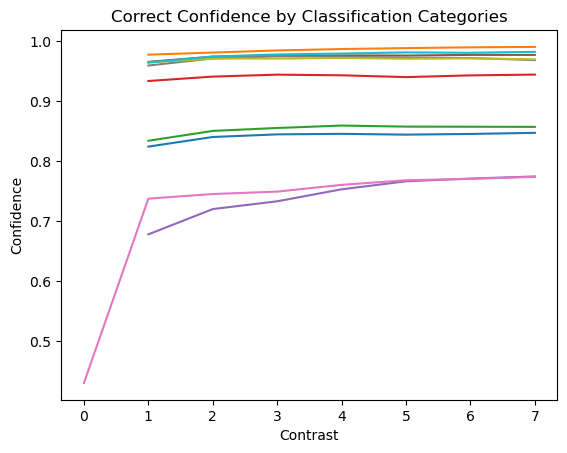

In [30]:
cd_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

layer1_activation = []
layer2_activation = []
layer3_activation = []
layer4_activation = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))



for i in range(len(cd_test)):
    images_testing_noise = generate_contrast(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_deep.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    

    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    hidden_activation1 = model_layer1.predict(images_testing_noise_flat)
    hidden_activation2 = model_layer2.predict(images_testing_noise_flat)
    hidden_activation3 = model_layer3.predict(images_testing_noise_flat)
    hidden_activation4 = model_layer4.predict(images_testing_noise_flat)
    
    layer1_activation.append(np.mean(hidden_activation1))
    layer2_activation.append(np.mean(hidden_activation2))
    layer3_activation.append(np.mean(hidden_activation3))
    layer4_activation.append(np.mean(hidden_activation4))    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cd_test,acc_array, label = "Accuracy")
conf_ax.plot(cd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Deep Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

plt.figure(3)
plt.plot(cd_test,layer1_activation,label ="Layer 1 Activation")
plt.plot(cd_test,layer2_activation,label ="Layer 2 Activation")
plt.plot(cd_test,layer3_activation,label ="Layer 3 Activation")
plt.plot(cd_test,layer4_activation,label ="Layer 4 Activation")
plt.legend(loc= "upper right")
plt.title("Layer Activation")

plt.figure(4)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(6)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

# Experiment 2c: Deep Feedforward Network- normalize 2nd layer

In [31]:
#Train deep feedforward model

images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

inputs = Input(shape=(784))

layer1 = Dense(10,activation='relu')(inputs)
layer2 = Dense(10,activation='relu')(layer1)

layer2 = LayerNormalization()(layer2)

layer3 = Dense(10,activation='relu')(layer2)
layer4 = Dense(10,activation='relu')(layer3)

outputs = Dense(10,activation='softmax')(layer4)

model_deep = Model(inputs=inputs,outputs=outputs)

model_layer1 = Model(inputs=inputs,outputs=layer1)
model_layer2 = Model(inputs=inputs,outputs=layer2)
model_layer3 = Model(inputs=inputs,outputs=layer3)
model_layer4 = Model(inputs=inputs,outputs=layer4)

model_deep.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_deep.fit(images_training_flat,labels_training,batch_size=100,verbose=0,epochs=500,validation_split=0.33,callbacks=[es])


Epoch 00045: early stopping


<Figure size 640x480 with 0 Axes>

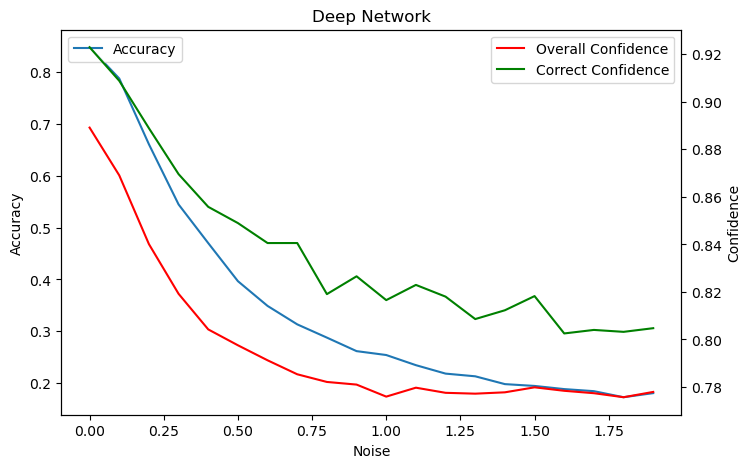

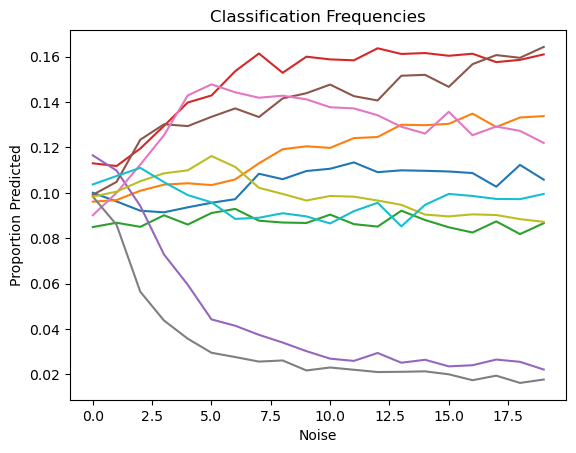

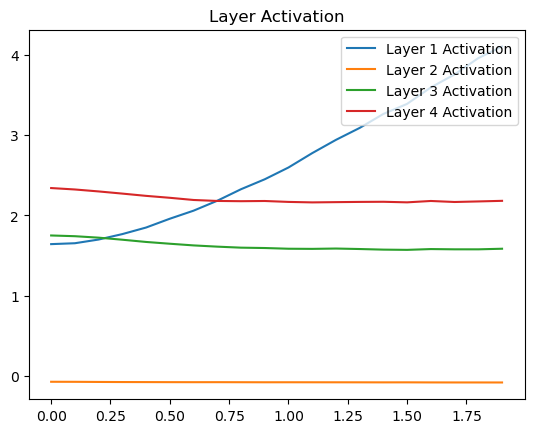

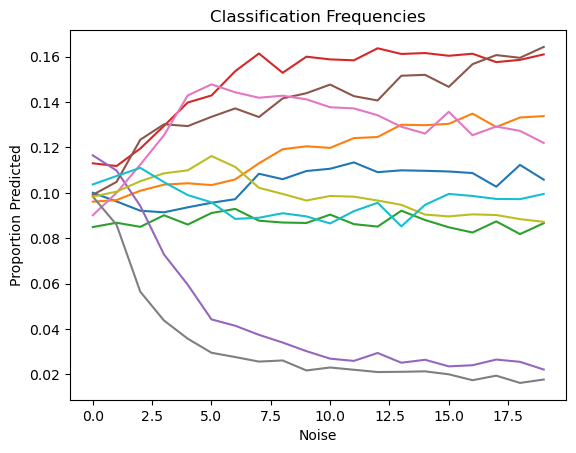

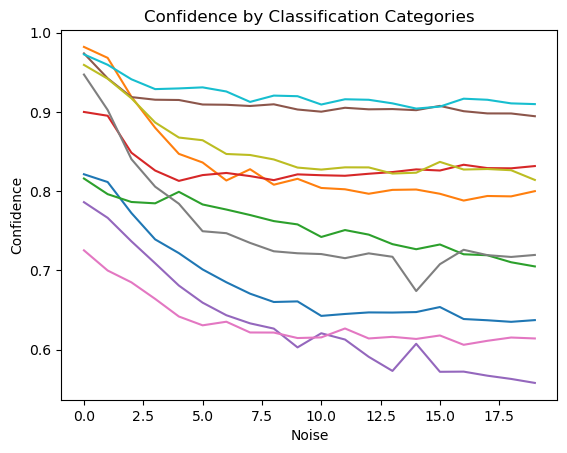

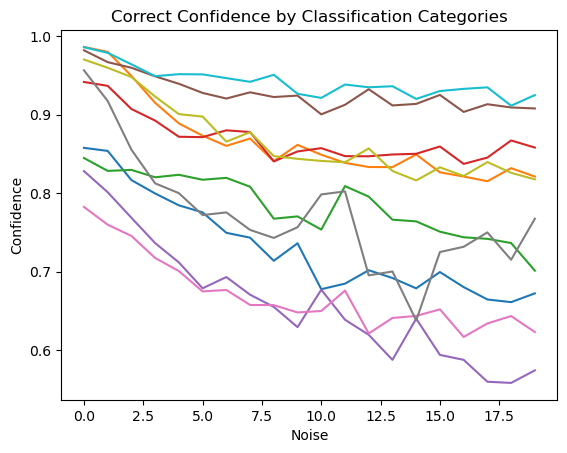

In [32]:
sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

layer1_activation = []
layer2_activation = []
layer3_activation = []
layer4_activation = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))



for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_deep.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    

    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    hidden_activation1 = model_layer1.predict(images_testing_noise_flat)
    hidden_activation2 = model_layer2.predict(images_testing_noise_flat)
    hidden_activation3 = model_layer3.predict(images_testing_noise_flat)
    hidden_activation4 = model_layer4.predict(images_testing_noise_flat)
    
    layer1_activation.append(np.mean(hidden_activation1))
    layer2_activation.append(np.mean(hidden_activation2))
    layer3_activation.append(np.mean(hidden_activation3))
    layer4_activation.append(np.mean(hidden_activation4))    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Deep Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

plt.figure(3)
plt.plot(sd_test,layer1_activation,label ="Layer 1 Activation")
plt.plot(sd_test,layer2_activation,label ="Layer 2 Activation")
plt.plot(sd_test,layer3_activation,label ="Layer 3 Activation")
plt.plot(sd_test,layer4_activation,label ="Layer 4 Activation")
plt.legend(loc= "upper right")
plt.title("Layer Activation")

plt.figure(4)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(6)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

<ipython-input-3-2497c16af76f>:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-3-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

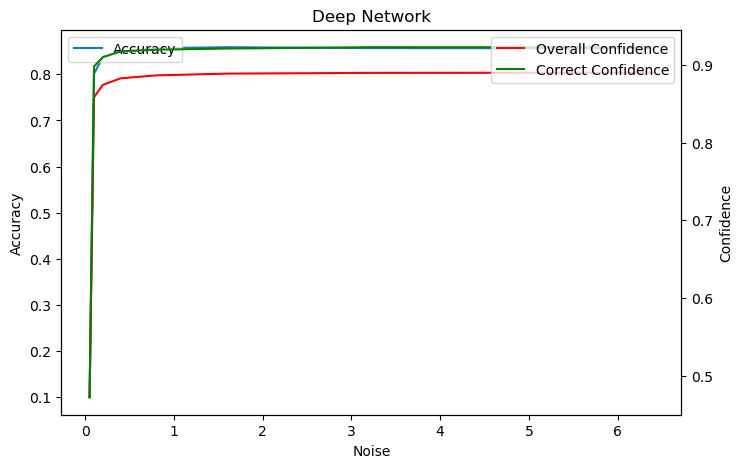

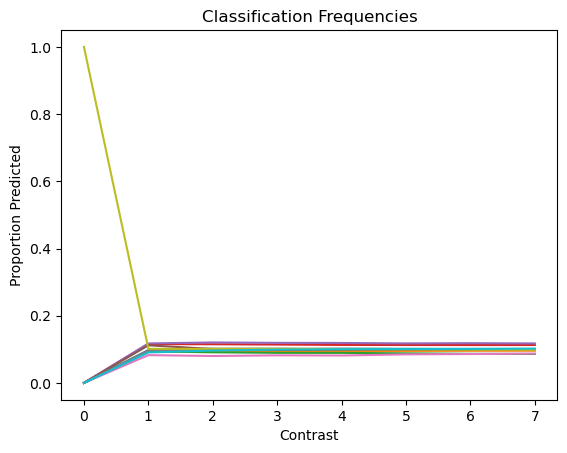

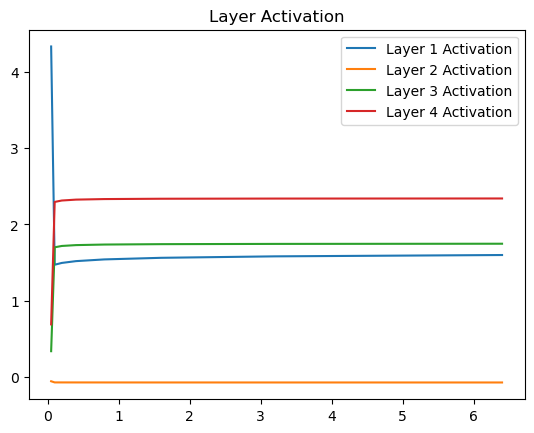

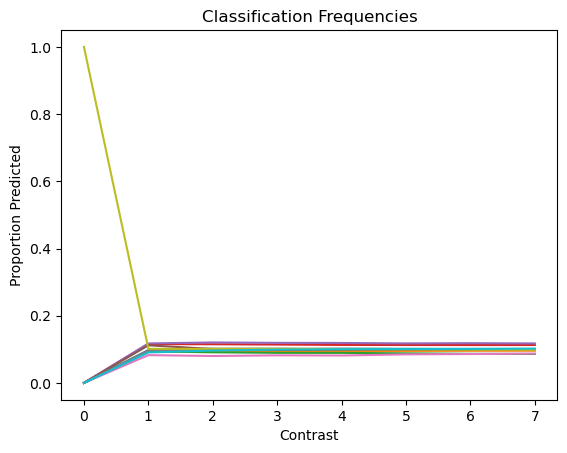

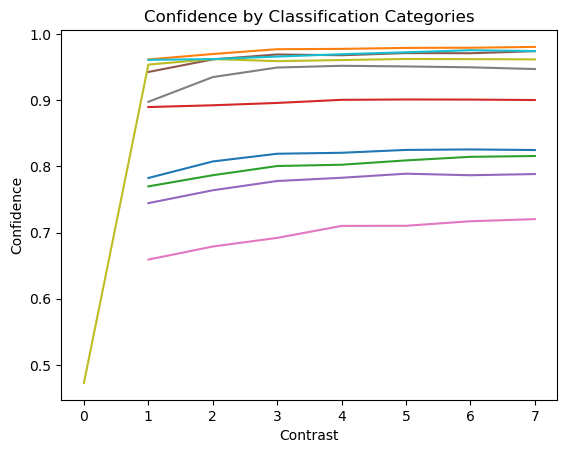

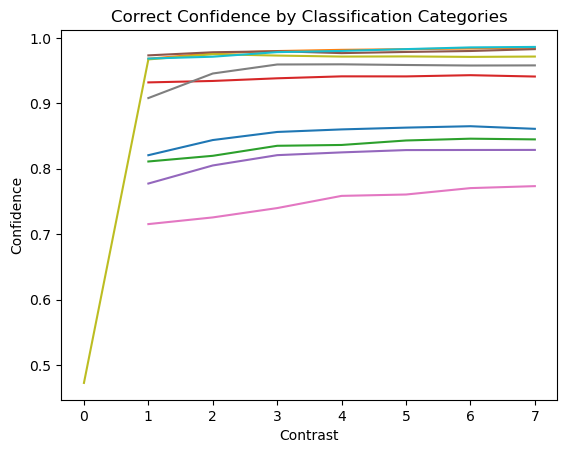

In [33]:
cd_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

layer1_activation = []
layer2_activation = []
layer3_activation = []
layer4_activation = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))



for i in range(len(cd_test)):
    images_testing_noise = generate_contrast(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_deep.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    

    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    hidden_activation1 = model_layer1.predict(images_testing_noise_flat)
    hidden_activation2 = model_layer2.predict(images_testing_noise_flat)
    hidden_activation3 = model_layer3.predict(images_testing_noise_flat)
    hidden_activation4 = model_layer4.predict(images_testing_noise_flat)
    
    layer1_activation.append(np.mean(hidden_activation1))
    layer2_activation.append(np.mean(hidden_activation2))
    layer3_activation.append(np.mean(hidden_activation3))
    layer4_activation.append(np.mean(hidden_activation4))    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cd_test,acc_array, label = "Accuracy")
conf_ax.plot(cd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Deep Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

plt.figure(3)
plt.plot(cd_test,layer1_activation,label ="Layer 1 Activation")
plt.plot(cd_test,layer2_activation,label ="Layer 2 Activation")
plt.plot(cd_test,layer3_activation,label ="Layer 3 Activation")
plt.plot(cd_test,layer4_activation,label ="Layer 4 Activation")
plt.legend(loc= "upper right")
plt.title("Layer Activation")

plt.figure(4)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(6)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

# Experiment 2d: Deep Feedforward Network- normalize 3rd layer

In [34]:
#Train deep feedforward model

images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

inputs = Input(shape=(784))

layer1 = Dense(10,activation='relu')(inputs)
layer2 = Dense(10,activation='relu')(layer1)
layer3 = Dense(10,activation='relu')(layer2)

layer3 = LayerNormalization()(layer3)

layer4 = Dense(10,activation='relu')(layer3)

outputs = Dense(10,activation='softmax')(layer4)

model_deep = Model(inputs=inputs,outputs=outputs)

model_layer1 = Model(inputs=inputs,outputs=layer1)
model_layer2 = Model(inputs=inputs,outputs=layer2)
model_layer3 = Model(inputs=inputs,outputs=layer3)
model_layer4 = Model(inputs=inputs,outputs=layer4)

model_deep.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_deep.fit(images_training_flat,labels_training,batch_size=100,verbose=0,epochs=500,validation_split=0.33,callbacks=[es])


Epoch 00036: early stopping


<Figure size 640x480 with 0 Axes>

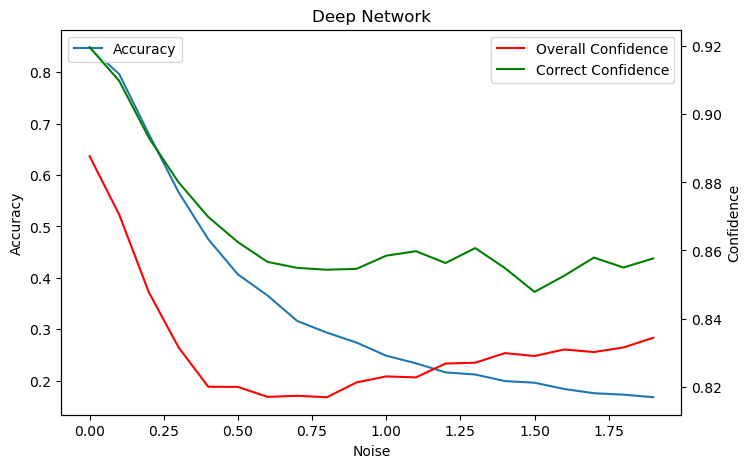

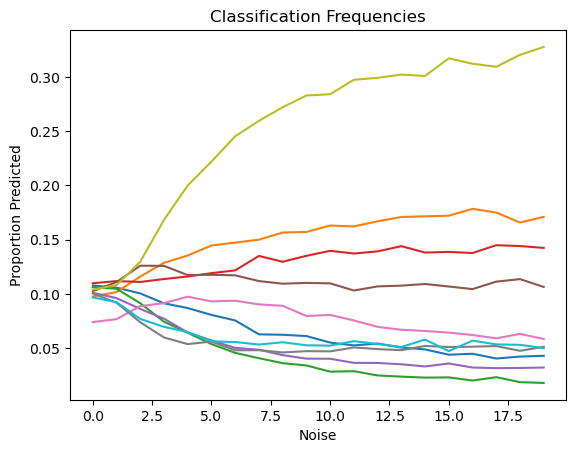

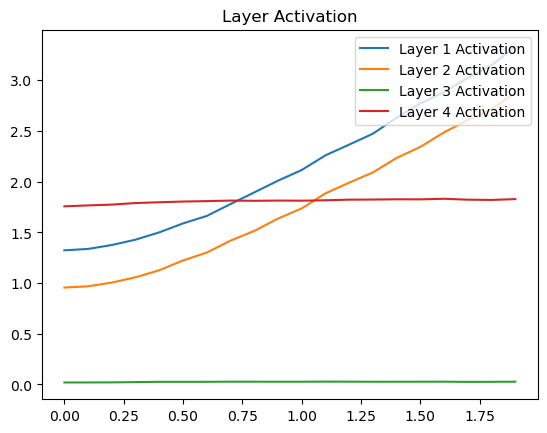

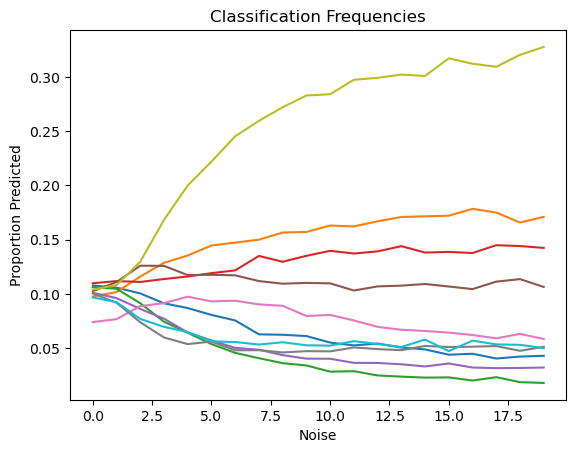

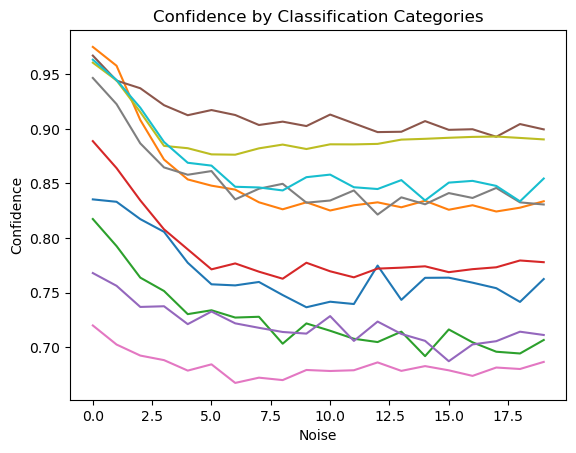

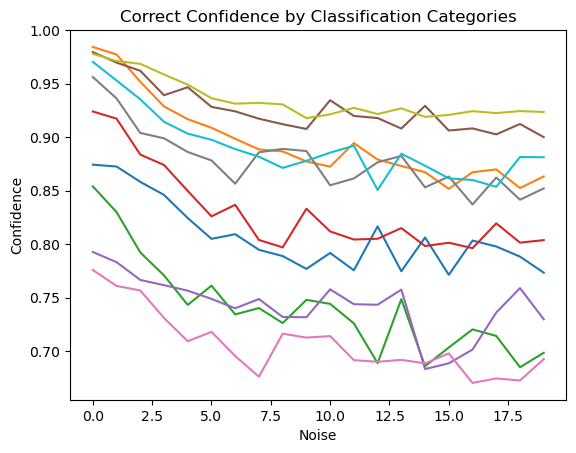

In [35]:
sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

layer1_activation = []
layer2_activation = []
layer3_activation = []
layer4_activation = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))



for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_deep.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    

    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    hidden_activation1 = model_layer1.predict(images_testing_noise_flat)
    hidden_activation2 = model_layer2.predict(images_testing_noise_flat)
    hidden_activation3 = model_layer3.predict(images_testing_noise_flat)
    hidden_activation4 = model_layer4.predict(images_testing_noise_flat)
    
    layer1_activation.append(np.mean(hidden_activation1))
    layer2_activation.append(np.mean(hidden_activation2))
    layer3_activation.append(np.mean(hidden_activation3))
    layer4_activation.append(np.mean(hidden_activation4))    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Deep Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

plt.figure(3)
plt.plot(sd_test,layer1_activation,label ="Layer 1 Activation")
plt.plot(sd_test,layer2_activation,label ="Layer 2 Activation")
plt.plot(sd_test,layer3_activation,label ="Layer 3 Activation")
plt.plot(sd_test,layer4_activation,label ="Layer 4 Activation")
plt.legend(loc= "upper right")
plt.title("Layer Activation")

plt.figure(4)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(6)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

<ipython-input-3-2497c16af76f>:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-3-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

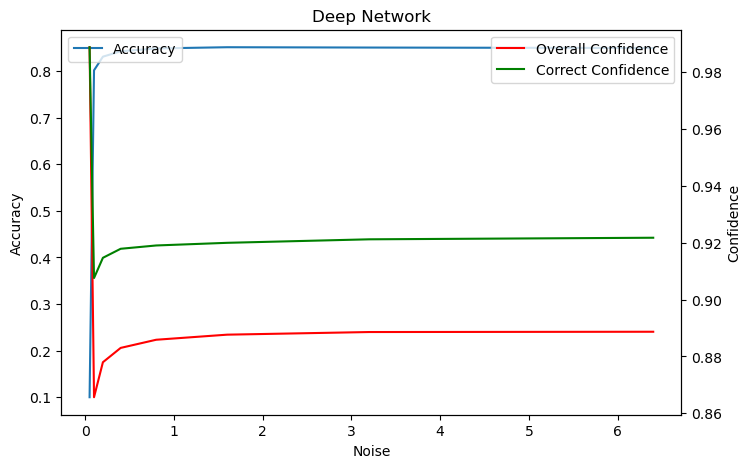

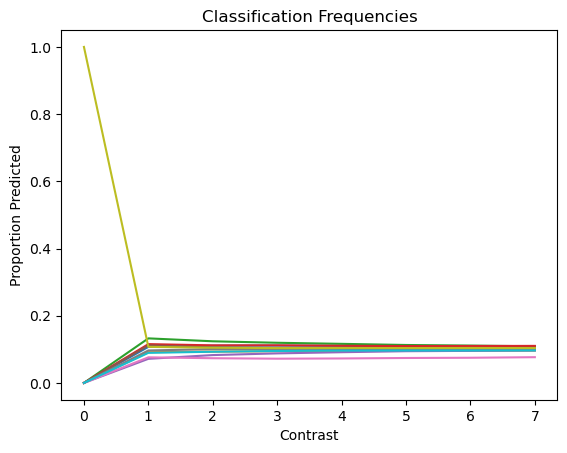

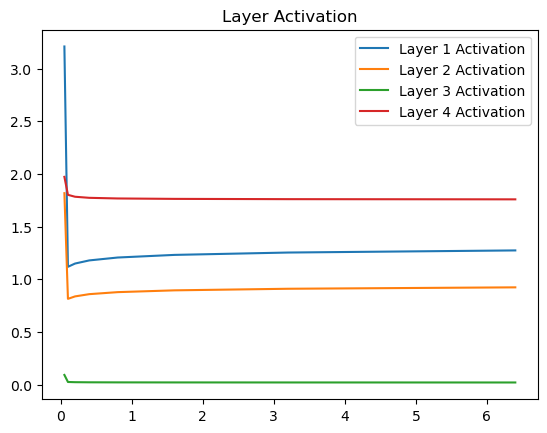

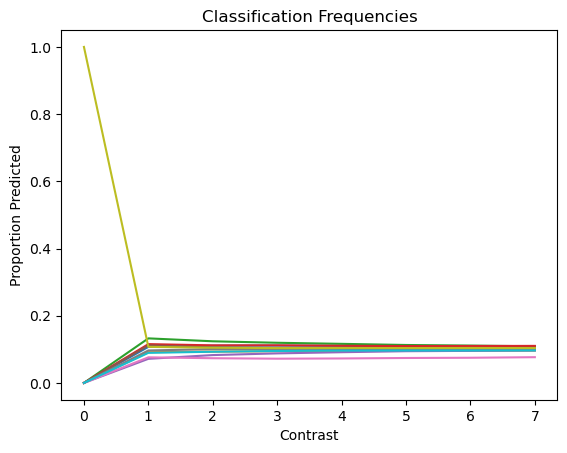

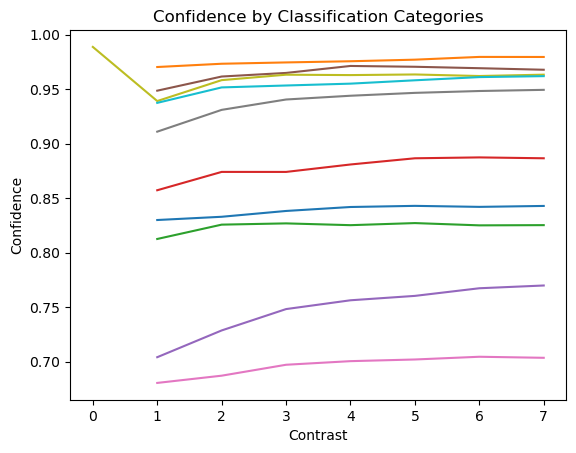

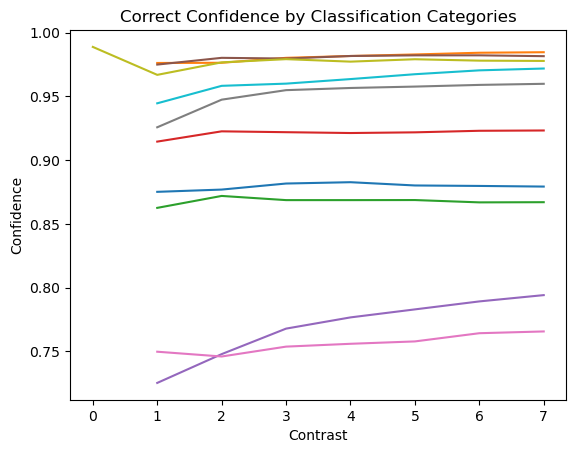

In [36]:
cd_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

layer1_activation = []
layer2_activation = []
layer3_activation = []
layer4_activation = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))



for i in range(len(cd_test)):
    images_testing_noise = generate_contrast(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_deep.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    

    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    hidden_activation1 = model_layer1.predict(images_testing_noise_flat)
    hidden_activation2 = model_layer2.predict(images_testing_noise_flat)
    hidden_activation3 = model_layer3.predict(images_testing_noise_flat)
    hidden_activation4 = model_layer4.predict(images_testing_noise_flat)
    
    layer1_activation.append(np.mean(hidden_activation1))
    layer2_activation.append(np.mean(hidden_activation2))
    layer3_activation.append(np.mean(hidden_activation3))
    layer4_activation.append(np.mean(hidden_activation4))    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cd_test,acc_array, label = "Accuracy")
conf_ax.plot(cd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Deep Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

plt.figure(3)
plt.plot(cd_test,layer1_activation,label ="Layer 1 Activation")
plt.plot(cd_test,layer2_activation,label ="Layer 2 Activation")
plt.plot(cd_test,layer3_activation,label ="Layer 3 Activation")
plt.plot(cd_test,layer4_activation,label ="Layer 4 Activation")
plt.legend(loc= "upper right")
plt.title("Layer Activation")

plt.figure(4)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(6)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

# Experiment 2e: Deep Feedforward Network- normalize 4st layer

In [37]:
#Train deep feedforward model

images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

inputs = Input(shape=(784))

layer1 = Dense(10,activation='relu')(inputs)
layer2 = Dense(10,activation='relu')(layer1)
layer3 = Dense(10,activation='relu')(layer2)
layer4 = Dense(10,activation='relu')(layer3)

layer4 = LayerNormalization()(layer4)

outputs = Dense(10,activation='softmax')(layer4)

model_deep = Model(inputs=inputs,outputs=outputs)

model_layer1 = Model(inputs=inputs,outputs=layer1)
model_layer2 = Model(inputs=inputs,outputs=layer2)
model_layer3 = Model(inputs=inputs,outputs=layer3)
model_layer4 = Model(inputs=inputs,outputs=layer4)

model_deep.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_deep.fit(images_training_flat,labels_training,batch_size=100,verbose=0,epochs=500,validation_split=0.33,callbacks=[es])


Epoch 00035: early stopping


<Figure size 640x480 with 0 Axes>

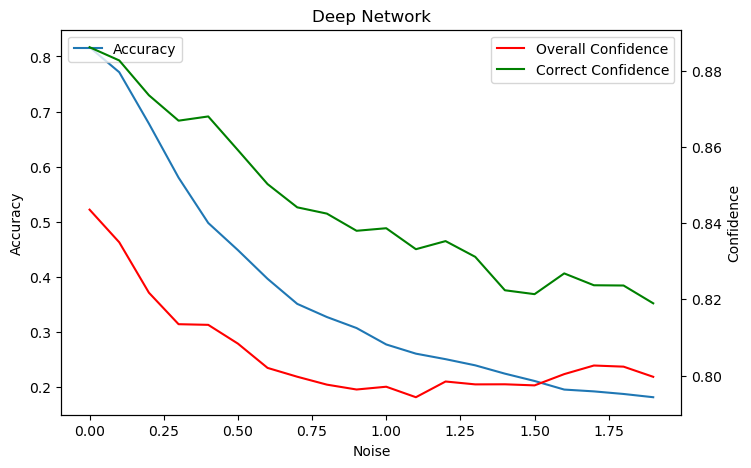

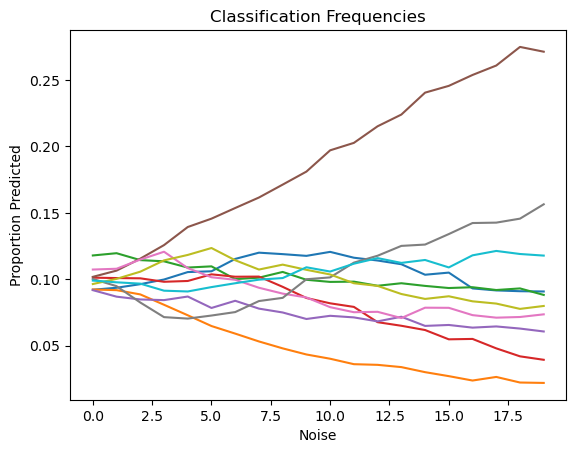

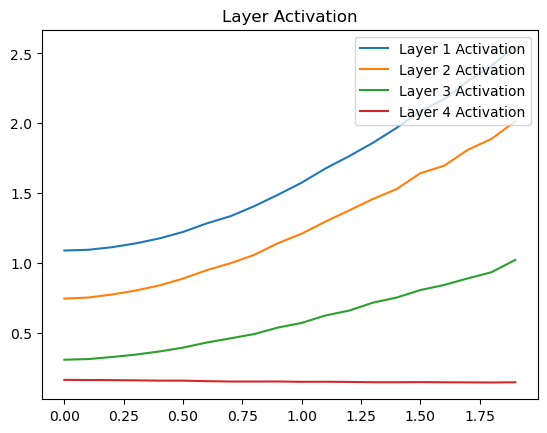

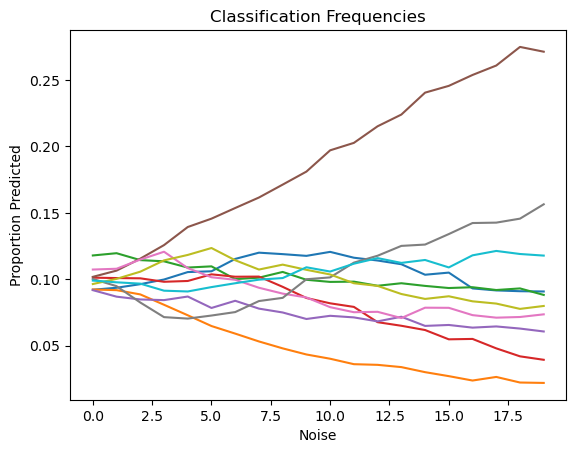

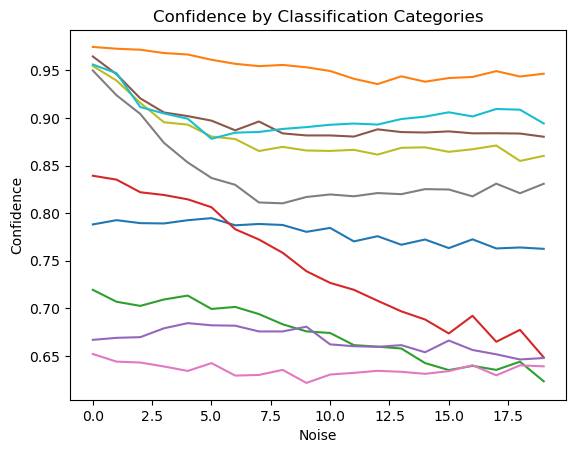

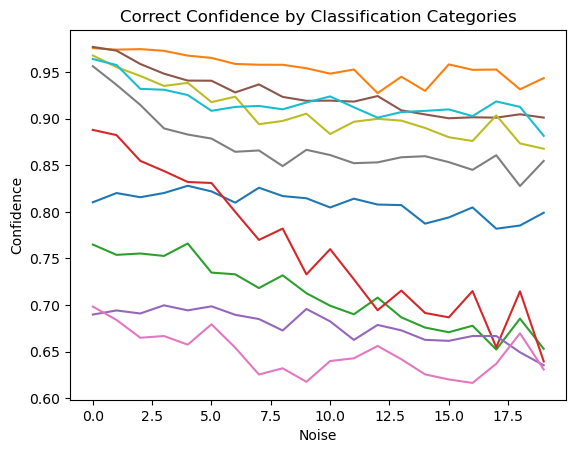

In [38]:
sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

layer1_activation = []
layer2_activation = []
layer3_activation = []
layer4_activation = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))



for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_deep.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    

    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    hidden_activation1 = model_layer1.predict(images_testing_noise_flat)
    hidden_activation2 = model_layer2.predict(images_testing_noise_flat)
    hidden_activation3 = model_layer3.predict(images_testing_noise_flat)
    hidden_activation4 = model_layer4.predict(images_testing_noise_flat)
    
    layer1_activation.append(np.mean(hidden_activation1))
    layer2_activation.append(np.mean(hidden_activation2))
    layer3_activation.append(np.mean(hidden_activation3))
    layer4_activation.append(np.mean(hidden_activation4))    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Deep Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

plt.figure(3)
plt.plot(sd_test,layer1_activation,label ="Layer 1 Activation")
plt.plot(sd_test,layer2_activation,label ="Layer 2 Activation")
plt.plot(sd_test,layer3_activation,label ="Layer 3 Activation")
plt.plot(sd_test,layer4_activation,label ="Layer 4 Activation")
plt.legend(loc= "upper right")
plt.title("Layer Activation")

plt.figure(4)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(6)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

<ipython-input-3-2497c16af76f>:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-3-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

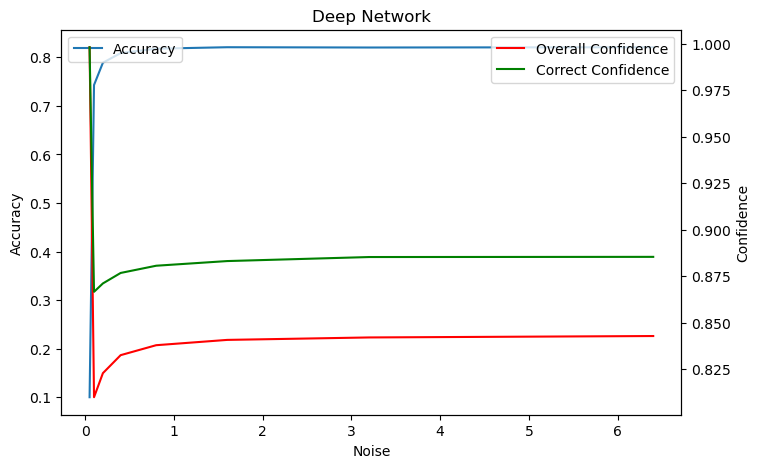

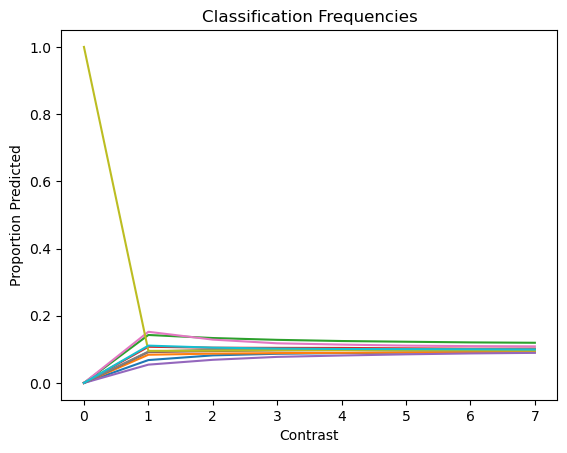

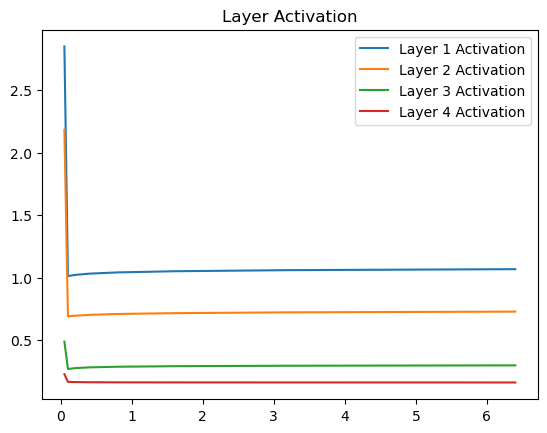

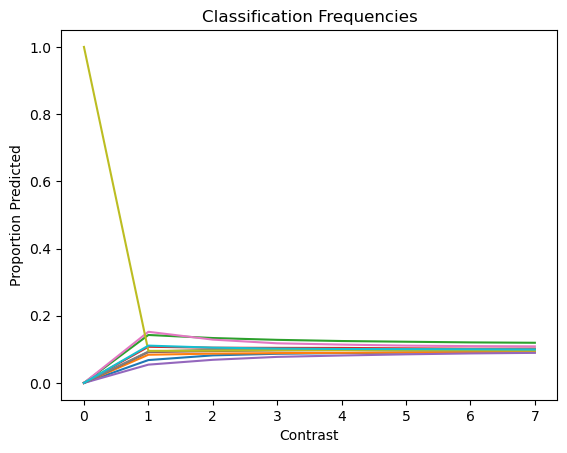

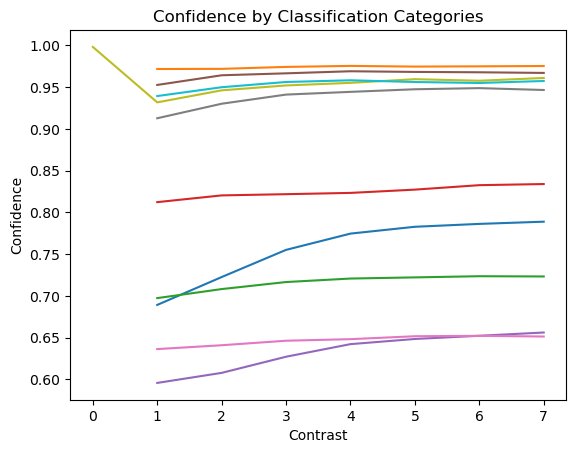

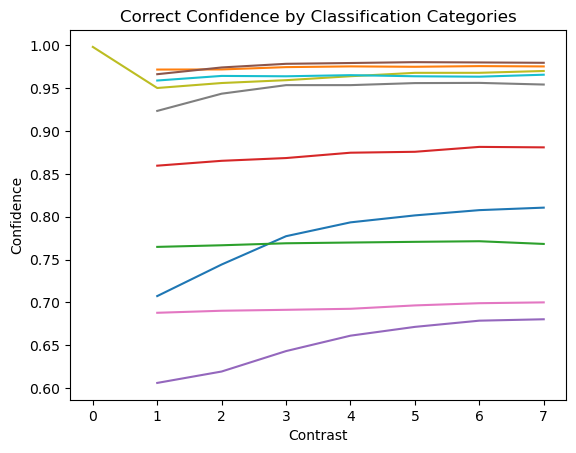

In [39]:
cd_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

layer1_activation = []
layer2_activation = []
layer3_activation = []
layer4_activation = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))



for i in range(len(cd_test)):
    images_testing_noise = generate_contrast(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_deep.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    

    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    hidden_activation1 = model_layer1.predict(images_testing_noise_flat)
    hidden_activation2 = model_layer2.predict(images_testing_noise_flat)
    hidden_activation3 = model_layer3.predict(images_testing_noise_flat)
    hidden_activation4 = model_layer4.predict(images_testing_noise_flat)
    
    layer1_activation.append(np.mean(hidden_activation1))
    layer2_activation.append(np.mean(hidden_activation2))
    layer3_activation.append(np.mean(hidden_activation3))
    layer4_activation.append(np.mean(hidden_activation4))    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cd_test,acc_array, label = "Accuracy")
conf_ax.plot(cd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Deep Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

plt.figure(3)
plt.plot(cd_test,layer1_activation,label ="Layer 1 Activation")
plt.plot(cd_test,layer2_activation,label ="Layer 2 Activation")
plt.plot(cd_test,layer3_activation,label ="Layer 3 Activation")
plt.plot(cd_test,layer4_activation,label ="Layer 4 Activation")
plt.legend(loc= "upper right")
plt.title("Layer Activation")

plt.figure(4)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(6)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

# Experiment 3a: Wide Network 

In [40]:
#Train wide feedforward model

images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

inputs = Input(shape=(784))
layer = Dense(200,activation='relu')(inputs)


outputs = Dense(10,activation='softmax')(layer)

model_wide = Model(inputs=inputs,outputs=outputs)

model_hidden = Model(inputs=inputs,outputs=layer)

model_wide.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_wide.fit(images_training_flat,labels_training,batch_size=100,verbose=0,epochs=500,validation_split=0.33,callbacks=[es])


Epoch 00037: early stopping


<Figure size 640x480 with 0 Axes>

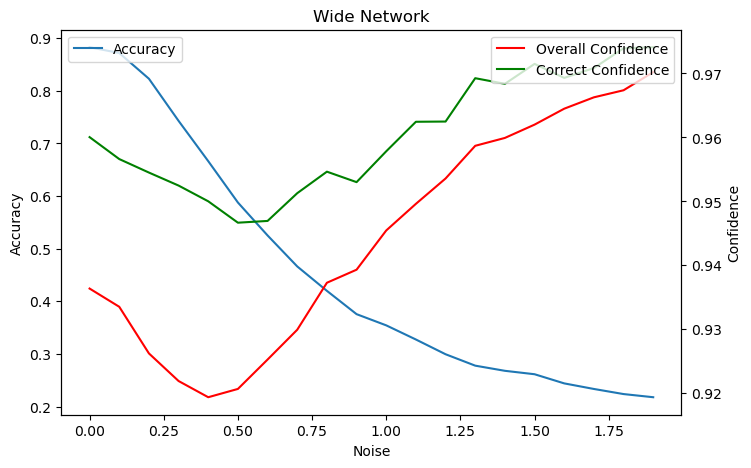

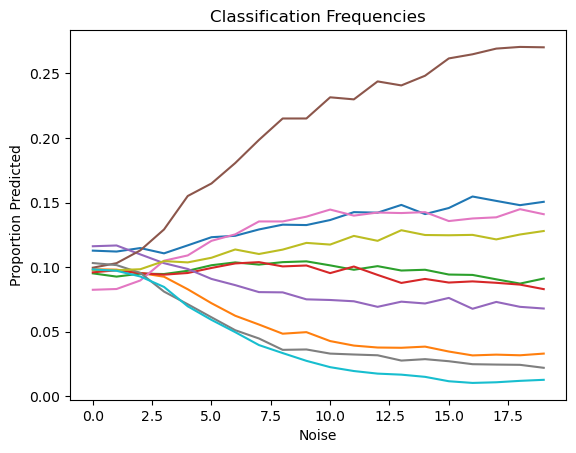

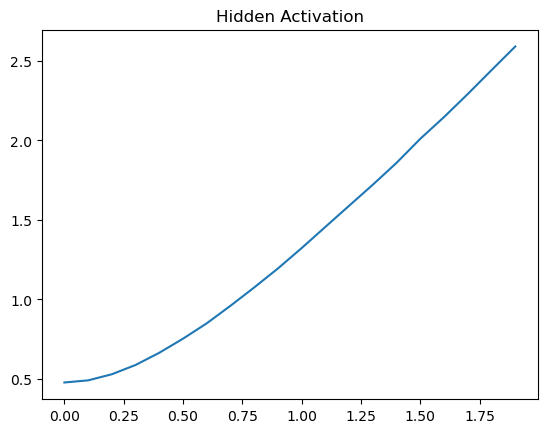

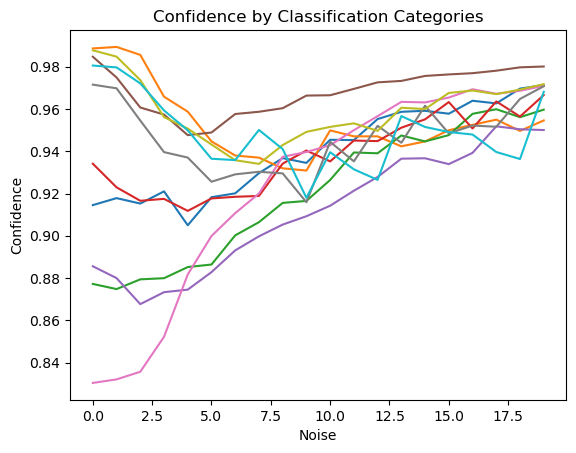

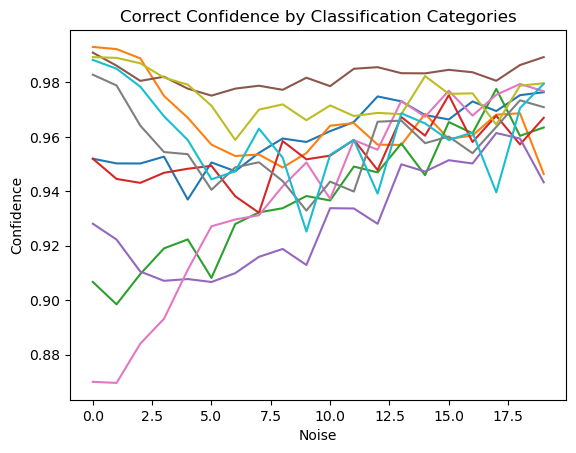

In [41]:
sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))

hidden_activation = []

for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_wide.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    hidden_output = model_hidden.predict(images_testing_noise_flat)
    
    hidden_activation.append(np.mean(hidden_output))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Wide Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")


plt.figure(3)
plt.plot(sd_test,hidden_activation)
plt.title("Hidden Activation")


plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

<ipython-input-3-2497c16af76f>:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-3-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

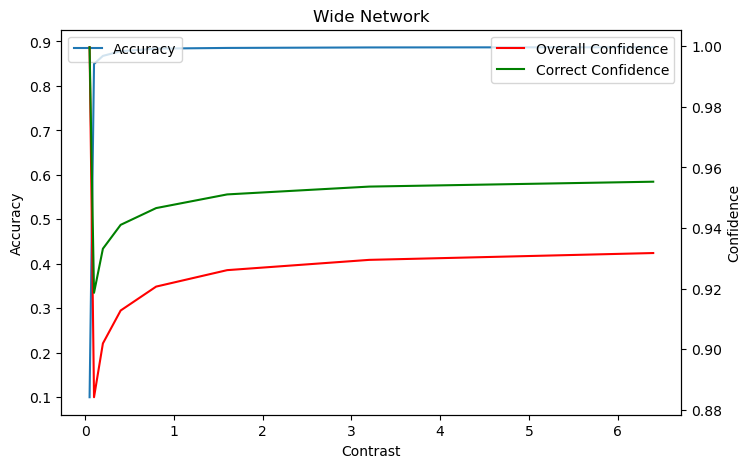

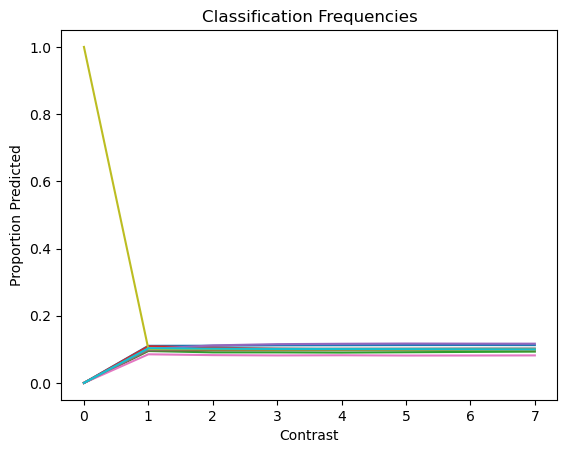

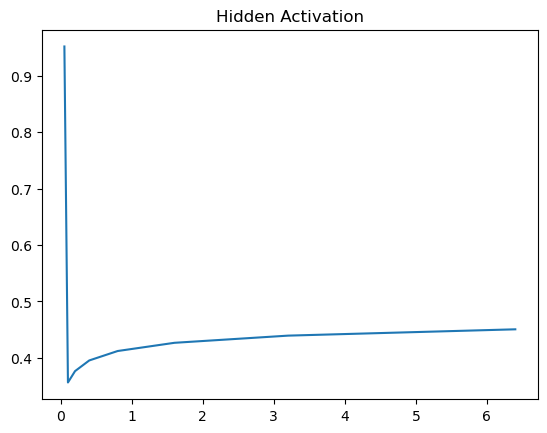

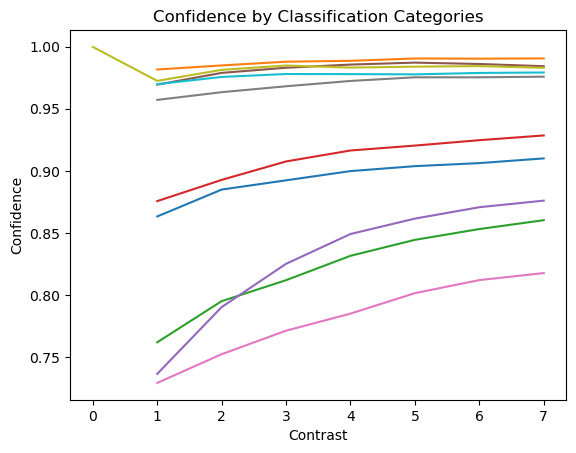

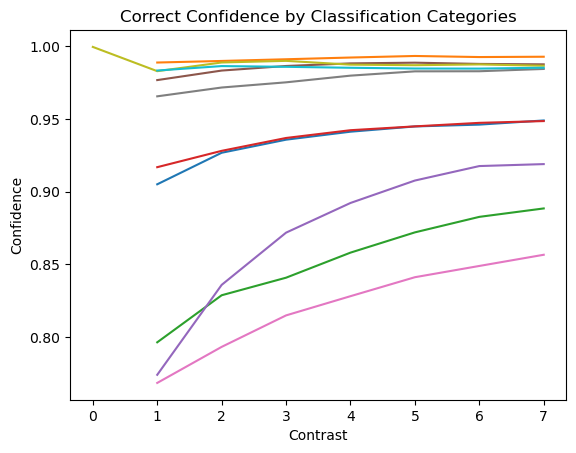

In [42]:
cd_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))

hidden_activation = []

for i in range(len(cd_test)):
    images_testing_noise = generate_contrast(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_wide.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    hidden_output = model_hidden.predict(images_testing_noise_flat)
    
    hidden_activation.append(np.mean(hidden_output))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Contrast")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cd_test,acc_array, label = "Accuracy")
conf_ax.plot(cd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Wide Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")


plt.figure(3)
plt.plot(cd_test,hidden_activation)
plt.title("Hidden Activation")


plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

# Experiment 3b: Wide Network Hidden layer normalization

In [43]:
#Train wide feedforward model

images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

inputs = Input(shape=(784))
layer = Dense(200,activation='relu')(inputs)

layer = LayerNormalization()(layer)

outputs = Dense(10,activation='softmax')(layer)

model_wide = Model(inputs=inputs,outputs=outputs)

model_hidden = Model(inputs=inputs,outputs=layer)

model_wide.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_wide.fit(images_training_flat,labels_training,batch_size=100,verbose=0,epochs=500,validation_split=0.33,callbacks=[es])


Epoch 00021: early stopping


<Figure size 640x480 with 0 Axes>

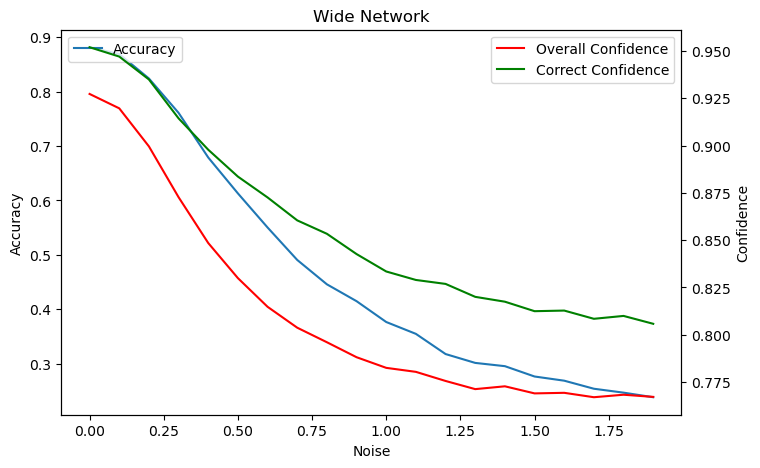

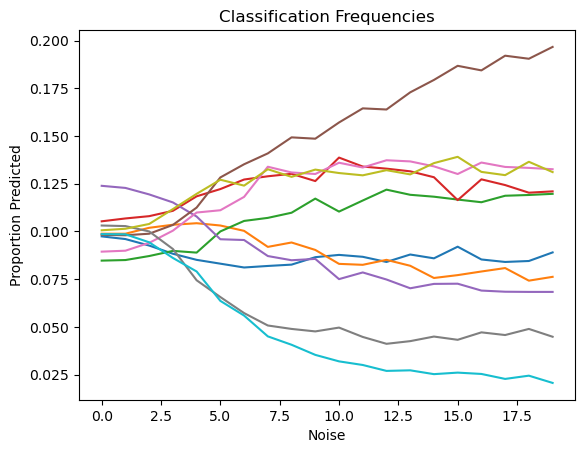

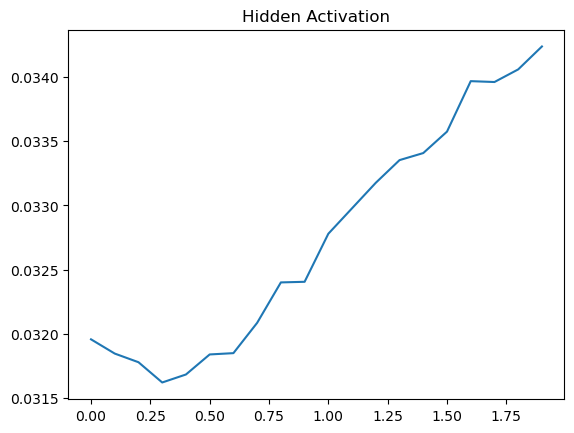

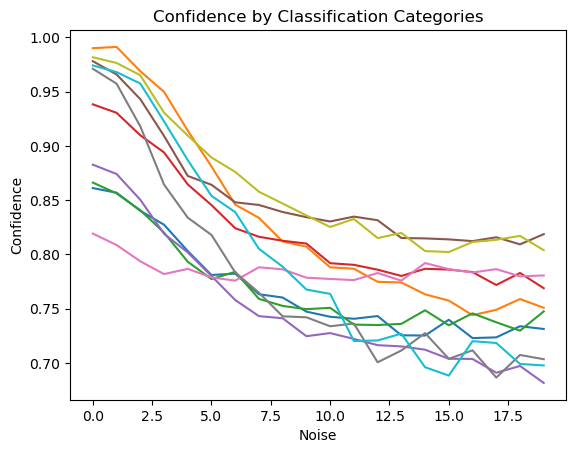

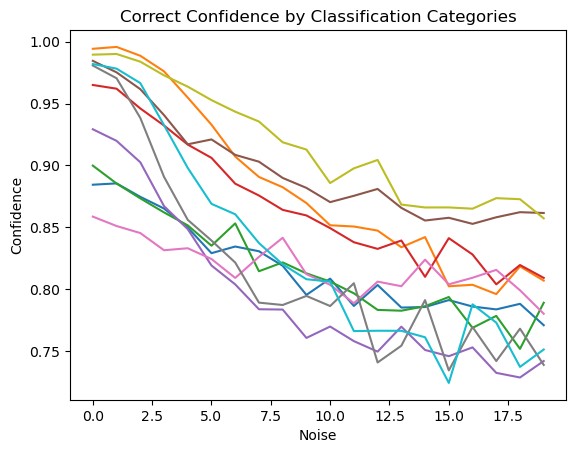

In [44]:
sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))

hidden_activation = []

for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_wide.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    hidden_output = model_hidden.predict(images_testing_noise_flat)
    
    hidden_activation.append(np.mean(hidden_output))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Wide Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")


plt.figure(3)
plt.plot(sd_test,hidden_activation)
plt.title("Hidden Activation")


plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

<ipython-input-3-2497c16af76f>:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-3-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

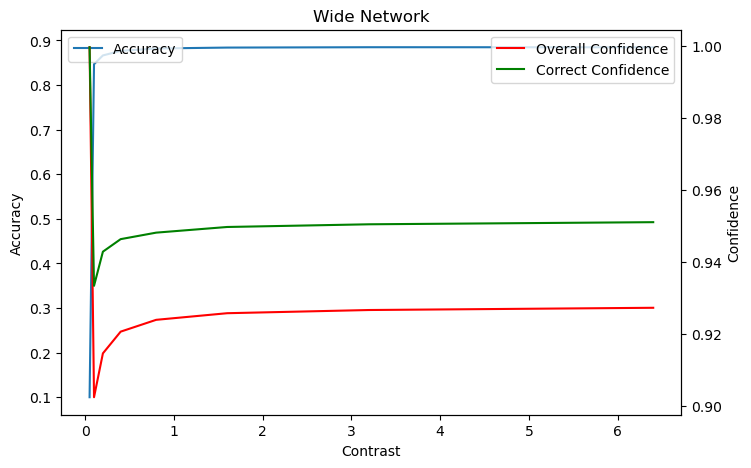

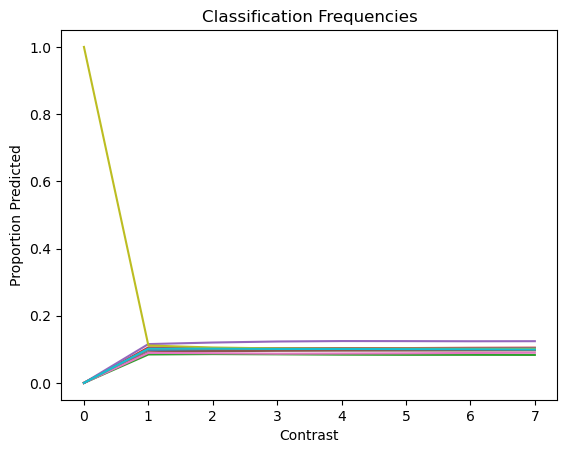

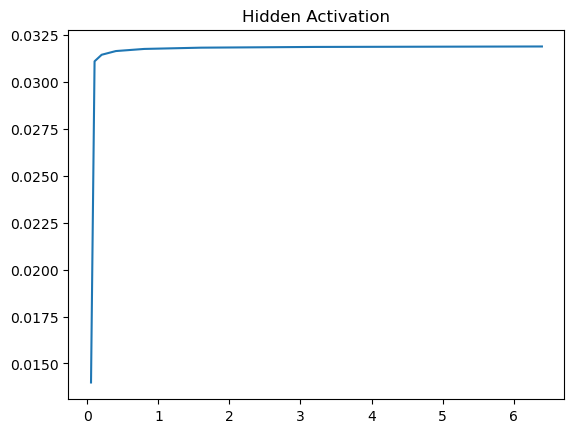

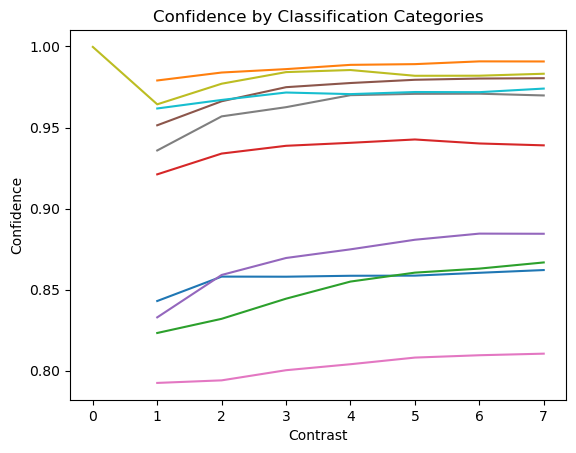

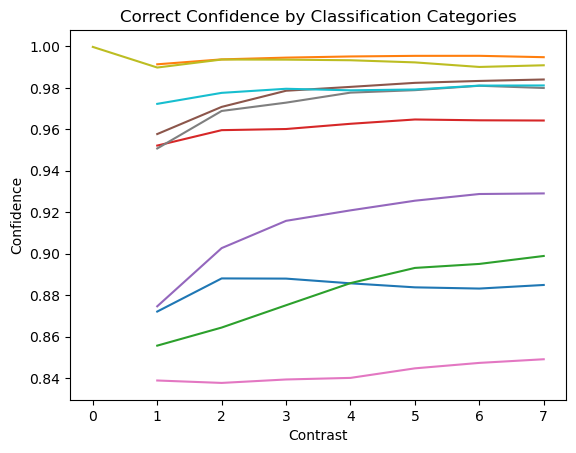

In [45]:
cd_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))

hidden_activation = []

for i in range(len(cd_test)):
    images_testing_noise = generate_contrast(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_wide.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    hidden_output = model_hidden.predict(images_testing_noise_flat)
    
    hidden_activation.append(np.mean(hidden_output))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Contrast")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cd_test,acc_array, label = "Accuracy")
conf_ax.plot(cd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Wide Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")


plt.figure(3)
plt.plot(cd_test,hidden_activation)
plt.title("Hidden Activation")


plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

# Experiment 4: Large Network

In [46]:
#Train deep feedforward model

images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

inputs = Input(shape=(784))
layer1 = Dense(200,activation='relu')(inputs)

layer2 = Dense(200,activation='relu')(layer1)
layer3 = Dense(200,activation='relu')(layer2)
layer4 = Dense(200,activation='relu')(layer3)

outputs = Dense(10,activation='softmax')(layer4)

model_deep = Model(inputs=inputs,outputs=outputs)

model_layer1 = Model(inputs=inputs,outputs=layer1)
model_layer2 = Model(inputs=inputs,outputs=layer2)
model_layer3 = Model(inputs=inputs,outputs=layer3)
model_layer4 = Model(inputs=inputs,outputs=layer4)

model_deep.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_deep.fit(images_training_flat,labels_training,batch_size=100,verbose=0,epochs=500,validation_split=0.33,callbacks=[es])


Epoch 00037: early stopping


<Figure size 640x480 with 0 Axes>

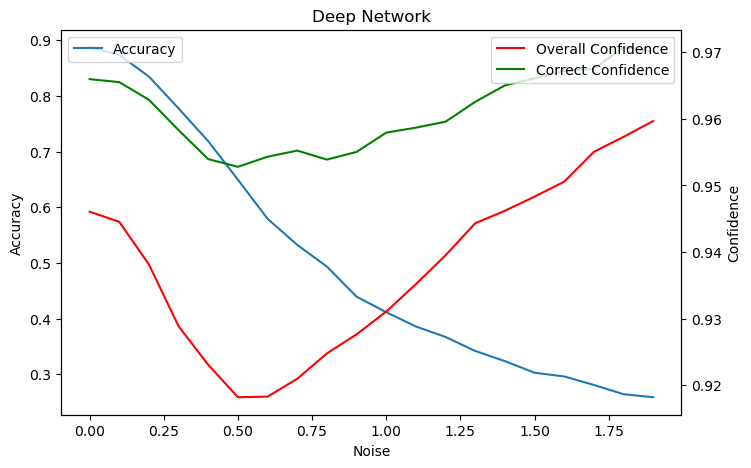

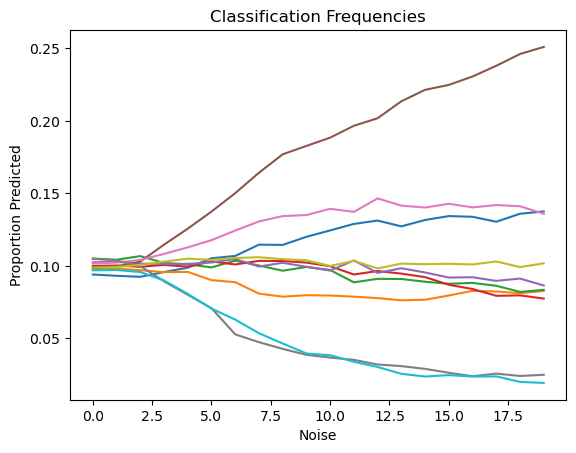

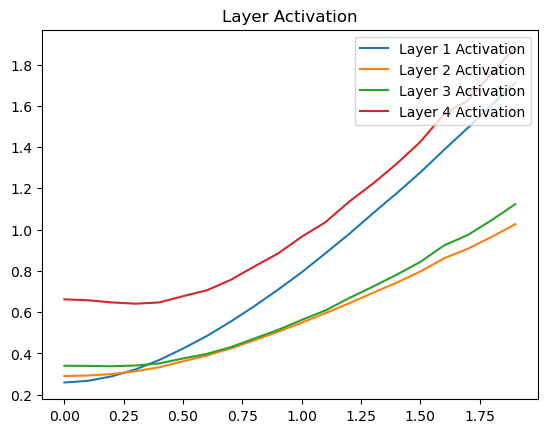

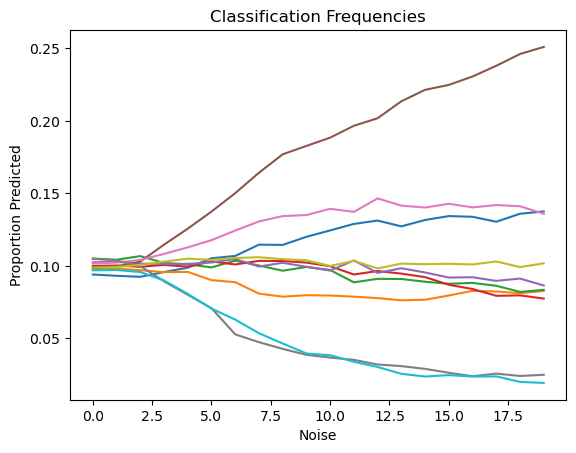

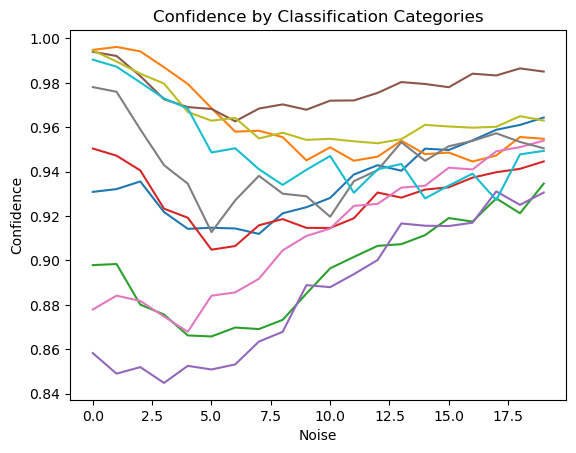

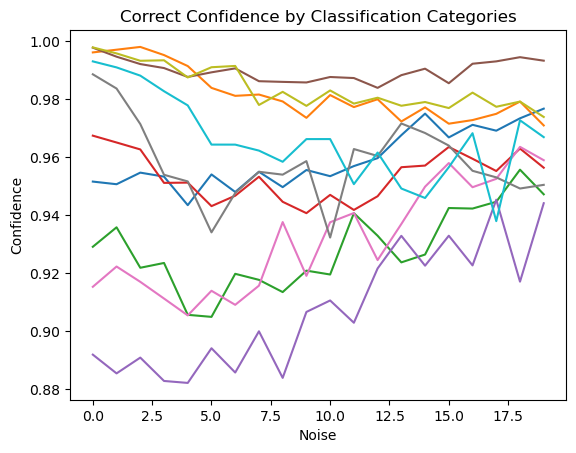

In [47]:
sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

layer1_activation = []
layer2_activation = []
layer3_activation = []
layer4_activation = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))



for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_deep.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    

    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    hidden_activation1 = model_layer1.predict(images_testing_noise_flat)
    hidden_activation2 = model_layer2.predict(images_testing_noise_flat)
    hidden_activation3 = model_layer3.predict(images_testing_noise_flat)
    hidden_activation4 = model_layer4.predict(images_testing_noise_flat)
    
    layer1_activation.append(np.mean(hidden_activation1))
    layer2_activation.append(np.mean(hidden_activation2))
    layer3_activation.append(np.mean(hidden_activation3))
    layer4_activation.append(np.mean(hidden_activation4))    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Deep Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

plt.figure(3)
plt.plot(sd_test,layer1_activation,label ="Layer 1 Activation")
plt.plot(sd_test,layer2_activation,label ="Layer 2 Activation")
plt.plot(sd_test,layer3_activation,label ="Layer 3 Activation")
plt.plot(sd_test,layer4_activation,label ="Layer 4 Activation")
plt.legend(loc= "upper right")
plt.title("Layer Activation")

plt.figure(4)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(6)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

<ipython-input-3-2497c16af76f>:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-3-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

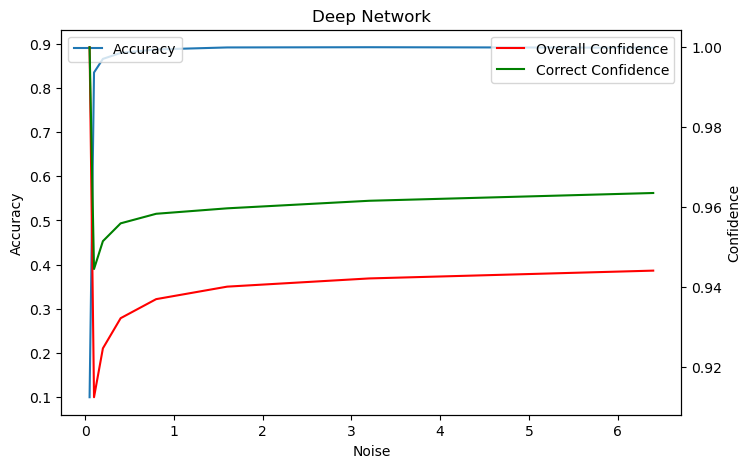

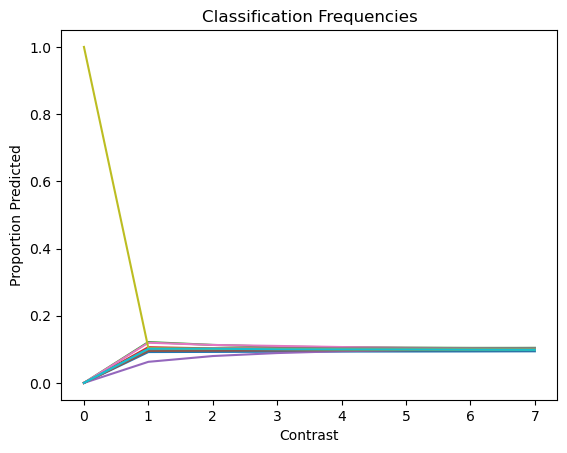

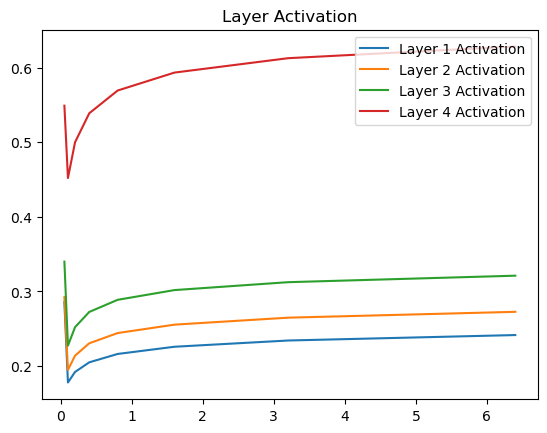

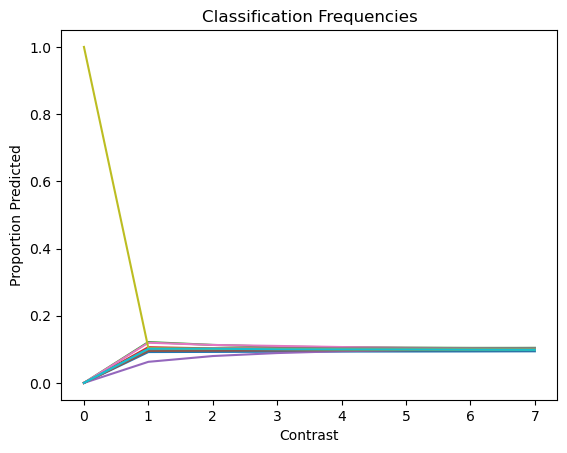

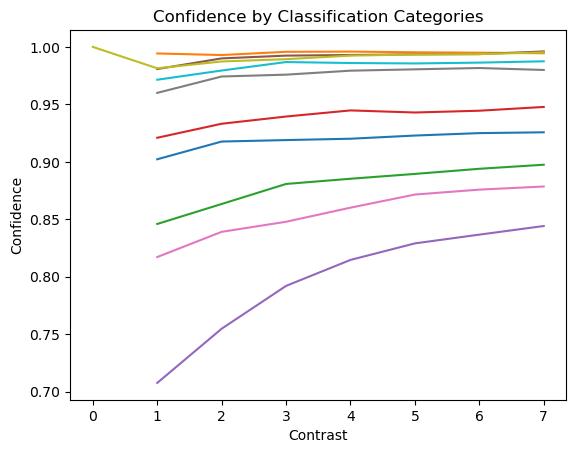

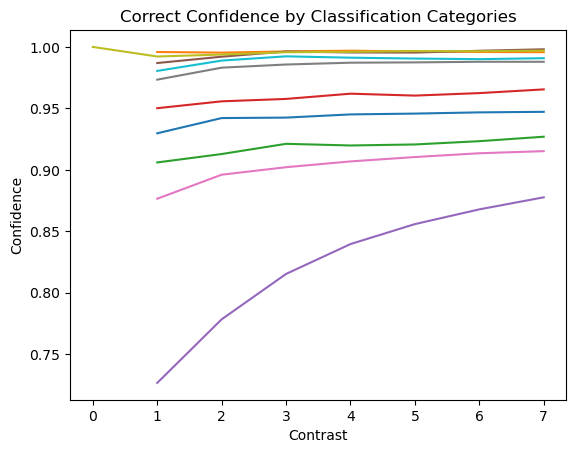

In [48]:
cd_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

layer1_activation = []
layer2_activation = []
layer3_activation = []
layer4_activation = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))



for i in range(len(cd_test)):
    images_testing_noise = generate_contrast(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_deep.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    

    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    hidden_activation1 = model_layer1.predict(images_testing_noise_flat)
    hidden_activation2 = model_layer2.predict(images_testing_noise_flat)
    hidden_activation3 = model_layer3.predict(images_testing_noise_flat)
    hidden_activation4 = model_layer4.predict(images_testing_noise_flat)
    
    layer1_activation.append(np.mean(hidden_activation1))
    layer2_activation.append(np.mean(hidden_activation2))
    layer3_activation.append(np.mean(hidden_activation3))
    layer4_activation.append(np.mean(hidden_activation4))    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cd_test,acc_array, label = "Accuracy")
conf_ax.plot(cd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Deep Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

plt.figure(3)
plt.plot(cd_test,layer1_activation,label ="Layer 1 Activation")
plt.plot(cd_test,layer2_activation,label ="Layer 2 Activation")
plt.plot(cd_test,layer3_activation,label ="Layer 3 Activation")
plt.plot(cd_test,layer4_activation,label ="Layer 4 Activation")
plt.legend(loc= "upper right")
plt.title("Layer Activation")

plt.figure(4)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(6)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

# Experiment 5: Convolutional Neural Network 

In [49]:
#Train large feedforward model

images_training_conv = images_training[:,:,:,np.newaxis]



inputs = Input(shape=(28,28,1))

layer = Conv2D(32, kernel_size=(3, 3), activation="relu")(inputs)
layer1 = MaxPooling2D(pool_size=(2, 2))(layer)

layer2 = Conv2D(64, kernel_size=(3, 3), activation="relu")(layer1)
layer2 = MaxPooling2D(pool_size=(2, 2))(layer2)

layer3 = Flatten()(layer2)

outputs = Dense(10,activation='softmax')(layer3)

model_conv = Model(inputs=inputs,outputs=outputs)

model_layer1 = Model(inputs=inputs,outputs=layer1)
model_layer2 = Model(inputs=inputs,outputs=layer2)

model_conv.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)


model_conv.fit(images_training_conv,labels_training,batch_size=100,epochs=500,validation_split=0.33,callbacks=[es])


Epoch 1/500
402/402 [==============================] - 4s 11ms/step - loss: 0.0249 - acc: 0.8267 - val_loss: 0.0189 - val_acc: 0.8706
Epoch 2/500
402/402 [==============================] - 4s 11ms/step - loss: 0.0167 - acc: 0.8880 - val_loss: 0.0168 - val_acc: 0.8866
Epoch 3/500
402/402 [==============================] - 4s 11ms/step - loss: 0.0147 - acc: 0.9012 - val_loss: 0.0165 - val_acc: 0.8867
Epoch 4/500
402/402 [==============================] - 4s 11ms/step - loss: 0.0134 - acc: 0.9109 - val_loss: 0.0157 - val_acc: 0.8918
Epoch 5/500
402/402 [==============================] - 4s 11ms/step - loss: 0.0123 - acc: 0.9198 - val_loss: 0.0153 - val_acc: 0.8945
Epoch 6/500
402/402 [==============================] - 4s 11ms/step - loss: 0.0114 - acc: 0.9254 - val_loss: 0.0146 - val_acc: 0.9001
Epoch 7/500
402/402 [==============================] - 4s 11ms/step - loss: 0.0106 - acc: 0.9320 - val_loss: 0.0152 - val_acc: 0.8968
Epoch 8/500
402/402 [==============================] - 4s 11ms

<Figure size 640x480 with 0 Axes>

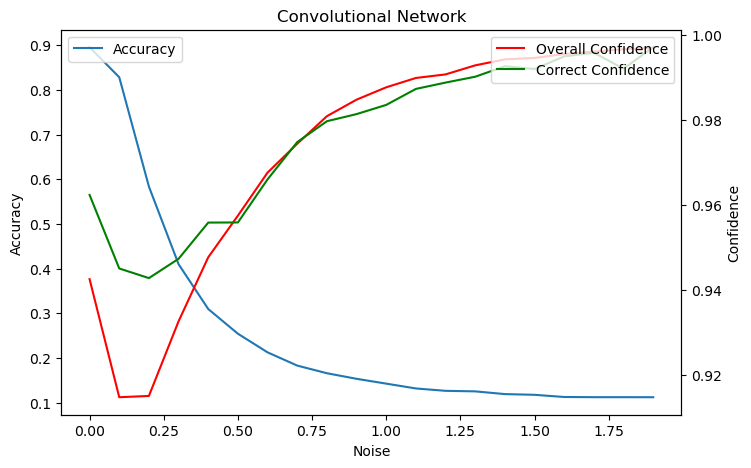

Text(0.5, 1.0, 'Classification Frequencies')

In [50]:
sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    labels_testing_predicted = model_conv.predict(images_testing_noise)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Convolutional Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

# Experiment 6a: No Hidden Layer

In [51]:
#Train network with no hidden layer

images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

inputs = Input(shape=(784))

outputs = Dense(10,activation='softmax')(inputs)

model_nohidden = Model(inputs=inputs,outputs=outputs)

model_nohidden.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_nohidden.fit(images_training_flat,labels_training,batch_size=100, verbose=0,epochs=500,validation_split=0.33,callbacks=[es])

Epoch 00033: early stopping


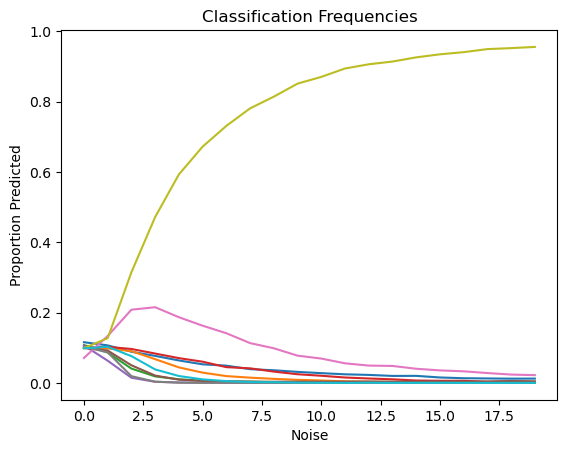

<Figure size 640x480 with 0 Axes>

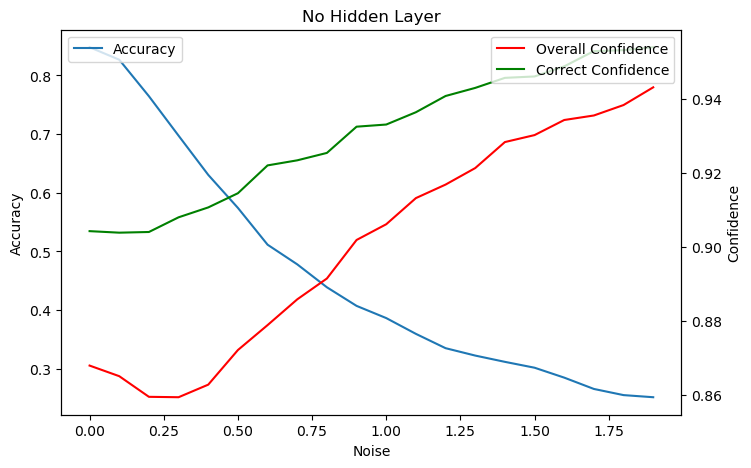

Text(0.5, 1.0, 'Classification Frequencies')

In [52]:
sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_nohidden.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("No Hidden Layer")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

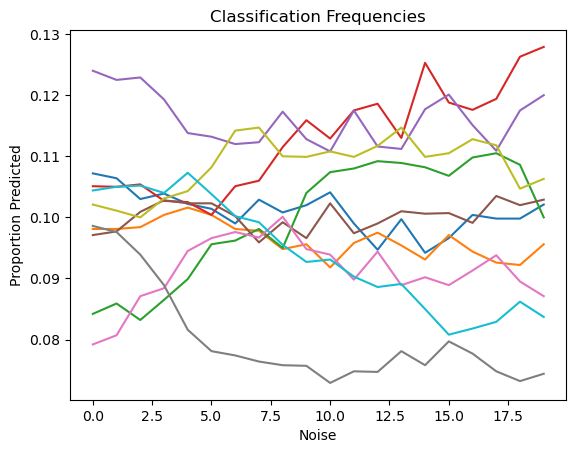

<Figure size 640x480 with 0 Axes>

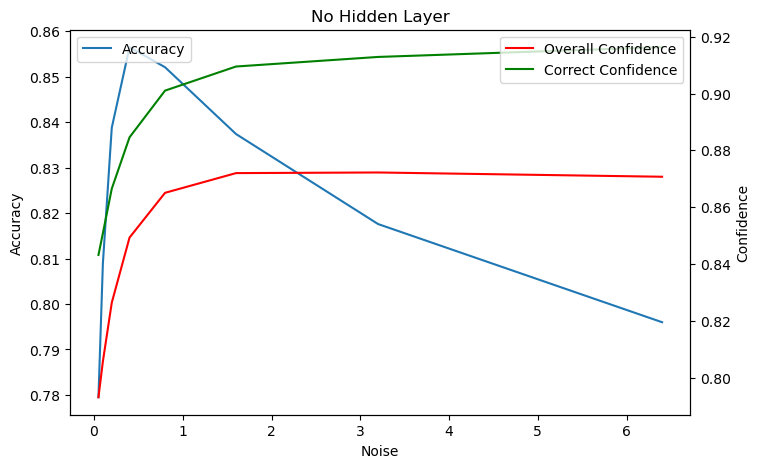

Text(0.5, 1.0, 'Classification Frequencies')

In [53]:
cd_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

for i in range(len(cd_test)):
    images_testing_noise = generate_contrast(images_testing,cd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_nohidden.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cd_test,acc_array, label = "Accuracy")
conf_ax.plot(cd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("No Hidden Layer")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

# Experiment 6b: No Hidden Layer and layer normalization

In [54]:
#Train network with no hidden layer

images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

inputs = Input(shape=(784))


layer = LayerNormalization()(inputs)

outputs = Dense(10,activation='softmax')(layer)

model_nohidden = Model(inputs=inputs,outputs=outputs)

model_nohidden.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_nohidden.fit(images_training_flat,labels_training,batch_size=100, verbose=0,epochs=500,validation_split=0.33,callbacks=[es])

Epoch 00027: early stopping


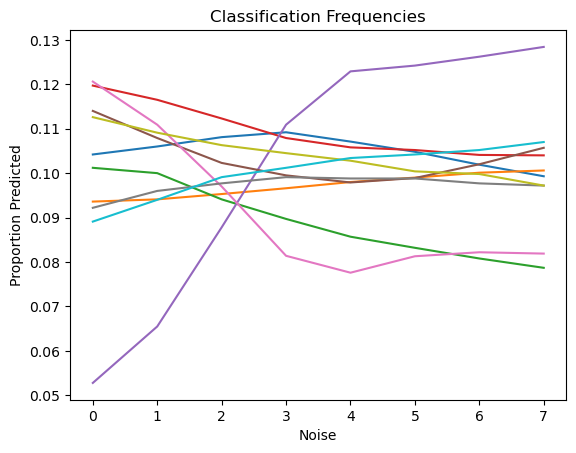

<Figure size 640x480 with 0 Axes>

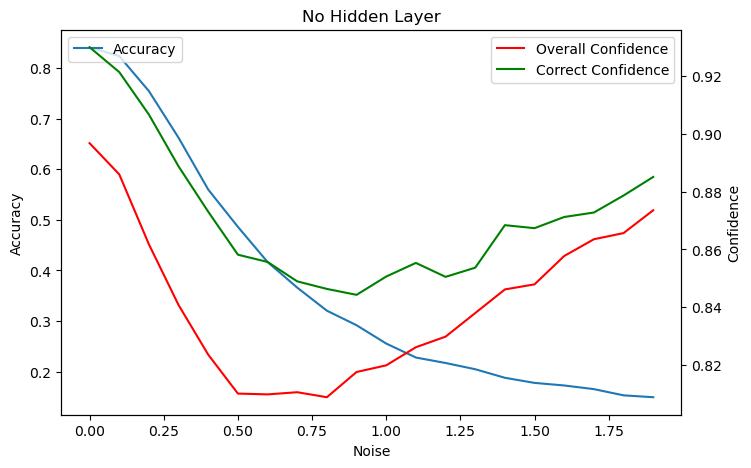

Text(0.5, 1.0, 'Classification Frequencies')

In [55]:
sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_nohidden.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("No Hidden Layer")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

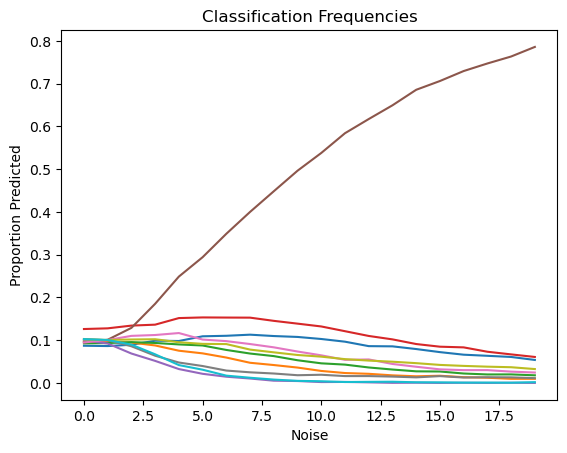

<Figure size 640x480 with 0 Axes>

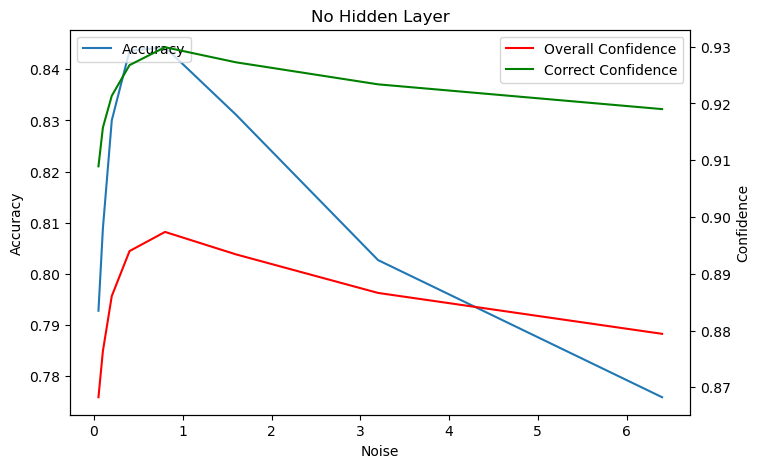

Text(0.5, 1.0, 'Classification Frequencies')

In [56]:
cd_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

for i in range(len(cd_test)):
    images_testing_noise = generate_contrast(images_testing,cd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_nohidden.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cd_test,acc_array, label = "Accuracy")
conf_ax.plot(cd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("No Hidden Layer")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")